In [388]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '/home/jw3514/Work/CellType_Psy/src')
from CellType_PSY import *
HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()
os.chdir("/home/jw3514/Work/CellType_Psy/notebooks3/")
print(f"Current working directory: {os.getcwd()}")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working directory: /home/jw3514/Work/CellType_Psy/notebooks3


In [295]:
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/truetype/msttcorefonts/Arial.ttf'
fm.fontManager.addfont(font_path)  # Only if you're adding a new font file
fm._load_fontmanager(try_read_cache=False)

In [296]:
#CT_Z2_MAT_HC = pd.read_csv("../dat/HumanCTExpressionMats/Human.CT.Exp.Entrez.log2.Z2.HCT.z1clip3.csv", index_col=0)
CT_Z2_MAT_HC = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Z1clip5.Z2.clip3.Jan21.csv", index_col=0)
CT_Z2_MAT_HC = CT_Z2_MAT_HC.rename(columns=lambda x: int(x))
    ##CT_Z2_MAT_HC = pd.read_csv("../dat/HumanCTExpressionMats/Human.CT.Exp.Entrez.", index_col=0)

In [299]:
Bias_Save_Dict = "/home/jw3514/Work/CellType_Psy/dat/Bias_Jan13_2025/"
ASD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.ASD61.Z2.HCT.csv", index_col=0)
SCZ_Bias = pd.read_csv(Bias_Save_Dict + "HCT.SCZ61.Z2.HCT.csv", index_col=0)
HighIQ_ASD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.ASD61.HIQ.Z2.HCT.csv", index_col=0)
LowIQ_ASD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.ASD61.LIQ.Z2.HCT.csv", index_col=0)
X22q_Bias = pd.read_csv(Bias_Save_Dict + "HCT.X22q61.Z2.HCT.csv", index_col=0)
DDD_Bias = pd.read_csv(Bias_Save_Dict + "HCT.DDDHC.Z2.HCT.top61.csv", index_col=0)

### Cell type bias and rank for each disorders

In [389]:
def SuperClusterBias_BoxPlot_test(DF, title, sortby = "mean", NeuroOnly=False):
    dat_Z2 = []
    mean_Z2 = []
    if NeuroOnly:
        for _CT in Neurons:
            tmp = DF[DF["Supercluster"] == _CT]
            dat_Z2.append(tmp["EFFECT"].values)
            if sortby == "median":
                mean_Z2.append(np.median(tmp["EFFECT"].values))
            elif sortby == "mean":
                mean_Z2.append(np.mean(tmp["EFFECT"].values))
        mean_Z2 = np.array(mean_Z2)

    else:
        for _CT in ALL_CTs:
            tmp = DF[DF["Supercluster"] == _CT]
            dat_Z2.append(tmp["EFFECT"].values)
            if sortby == "median":
                mean_Z2.append(np.median(tmp["EFFECT"].values))
            elif sortby == "mean":
                mean_Z2.append(np.mean(tmp["EFFECT"].values))
        mean_Z2 = np.array(mean_Z2)

    # Sorting data by the mean values
    sort_idx = np.argsort(mean_Z2)
    show_dat_Z2 = [dat_Z2[x] for x in sort_idx]
    show_CTs = [ALL_CTs[x] for x in sort_idx]

    # Create a figure and axis
    if NeuroOnly:
        fig, ax = plt.subplots(dpi=200, figsize=(8, 7))
    else:
        fig, ax = plt.subplots(dpi=200, figsize=(8, 8))

    # Customize the boxplot
    boxprops = dict(linestyle='-', linewidth=1.5, color='blue', facecolor='lightblue')
    medianprops = dict(linestyle='-', linewidth=2.5, color='firebrick')
    meanprops = dict(marker='D', markeredgecolor='black', markerfacecolor='firebrick')

    # Use Seaborn to set the context for publication-quality plots
    sns.set_context("talk", font_scale=1.2)

    # Draw the boxplot
    bp = ax.boxplot(show_dat_Z2, labels=show_CTs, vert=False, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', color='blue'),
                    medianprops=medianprops, meanprops=meanprops, showmeans=True)

    # Add grid lines
    ax.grid(True, linestyle='--', alpha=0.6)

    # Customize the colors of the boxplot elements
    colors = sns.color_palette("Set2", len(show_dat_Z2))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # Add labels and title
    ax.set_xlabel("{} Mutation Bias".format(title), fontsize=14)
    ax.set_ylabel("Supercluster", fontsize=14)
    #ax.set_title("Boxplot of ASD Mutation Bias by Supercluster", fontsize=16)

    # Adjust the tick parameters for better readability
    ax.tick_params(axis='both', which='major', labelsize=12)

    # Show the plot
    plt.tight_layout()
    plt.show()

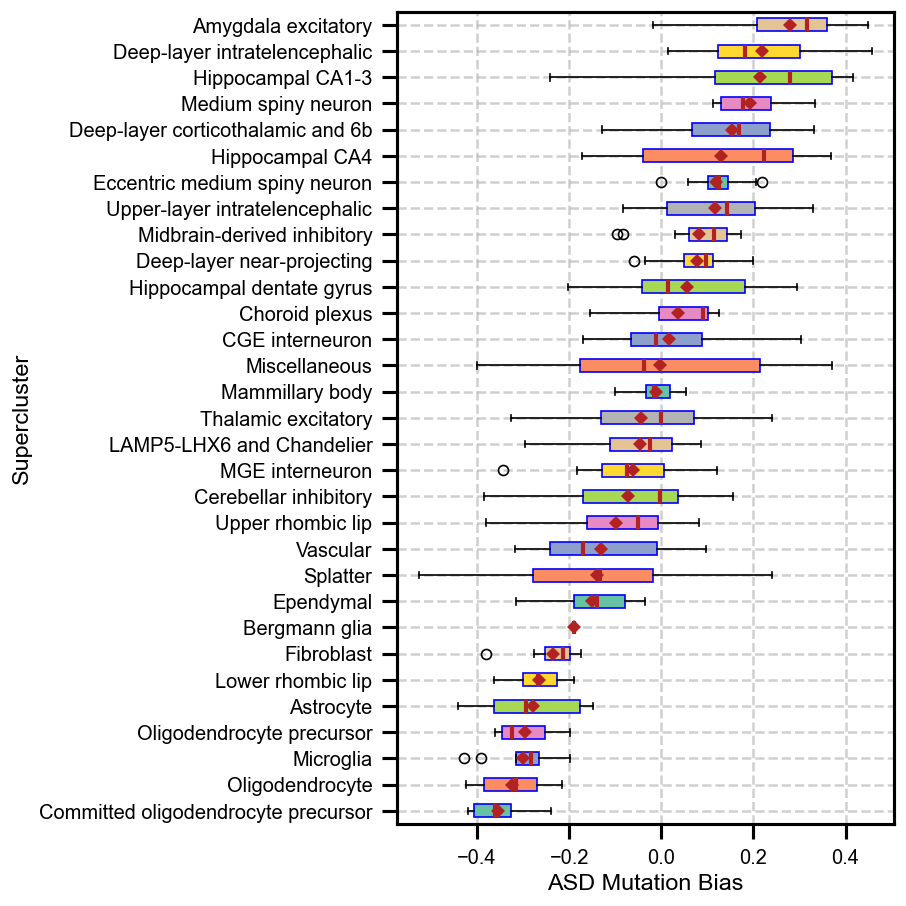

In [395]:
SuperClusterBias_BoxPlot(ASD_Bias, "ASD", NeuroOnly=False)

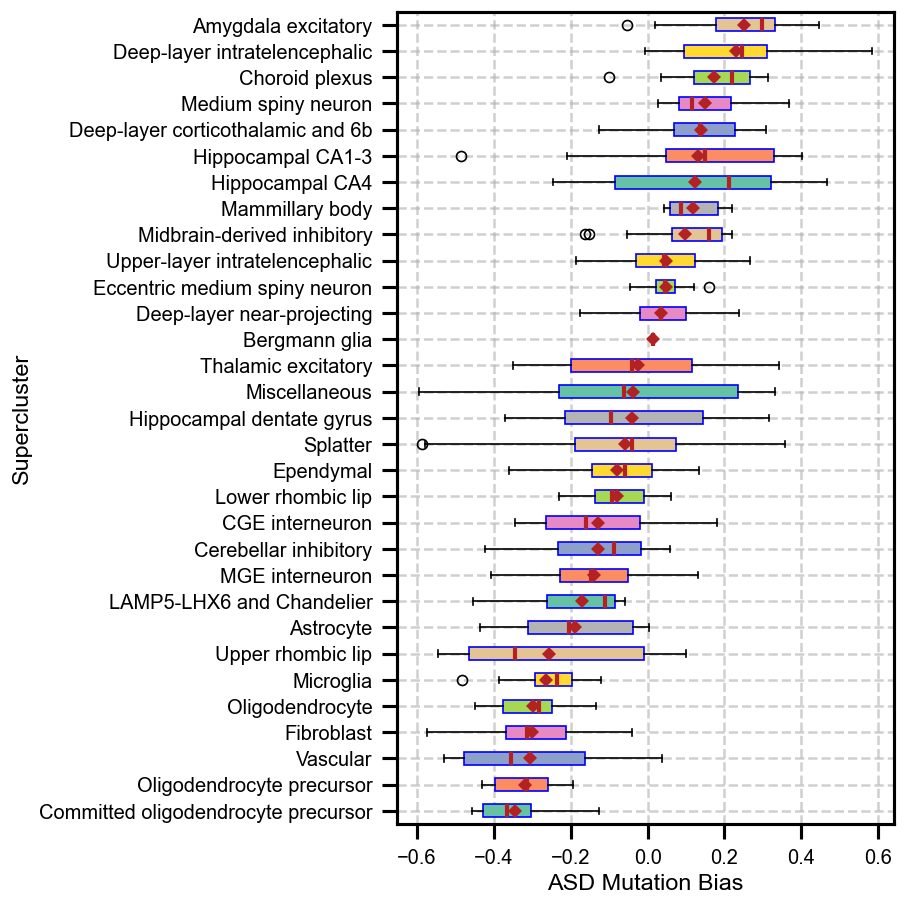

In [396]:
SuperClusterBias_BoxPlot(HighIQ_ASD_Bias, "ASD", NeuroOnly=False, sortby="mean")

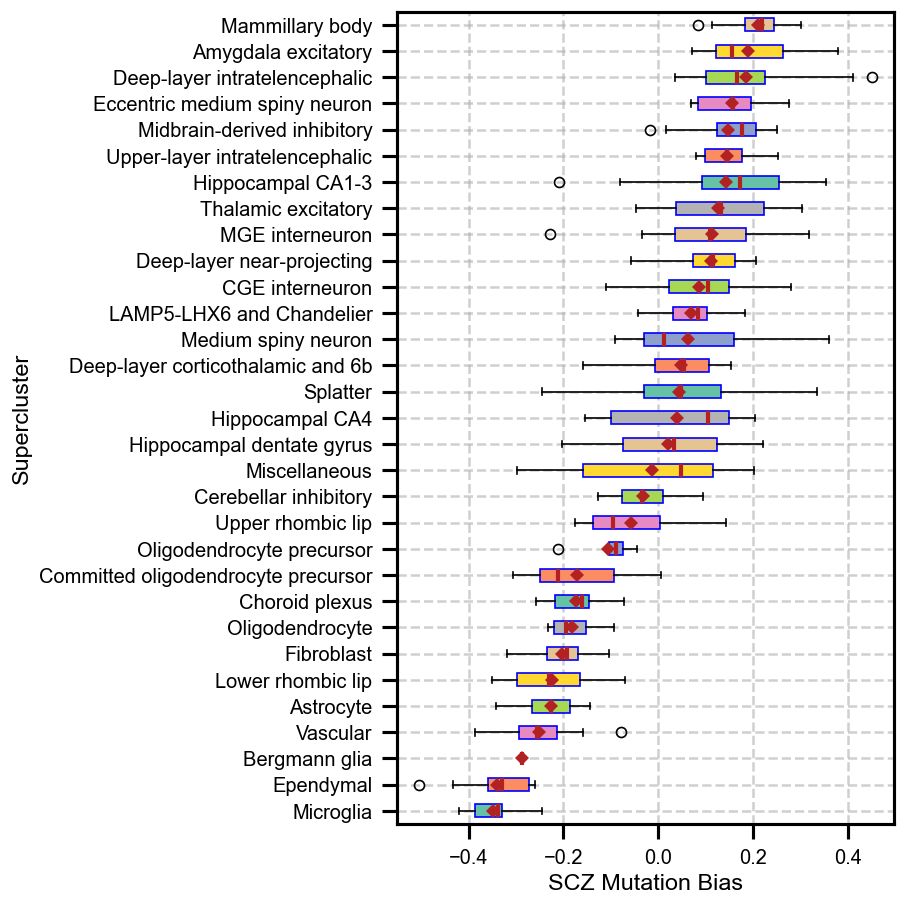

In [397]:
SuperClusterBias_BoxPlot(SCZ_Bias, "SCZ", NeuroOnly=False)
#SuperClusterBias_BoxPlot(SCZ_Bias, "SCZ")

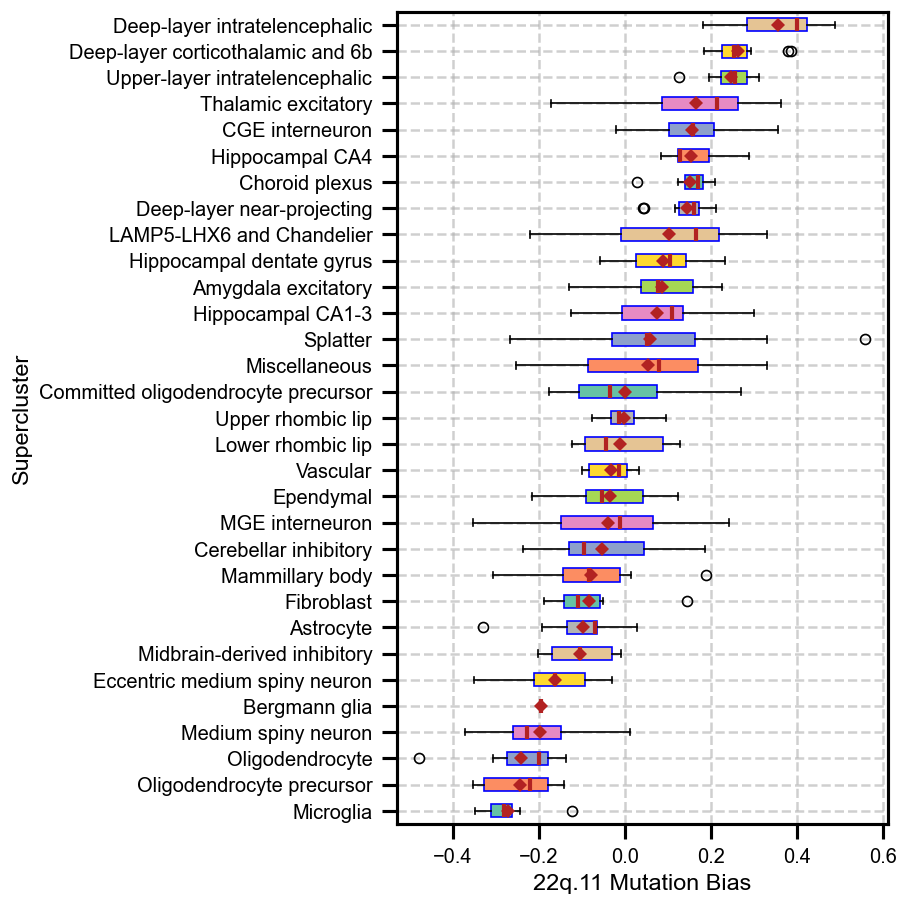

In [398]:
SuperClusterBias_BoxPlot(X22q_Bias, "22q.11")

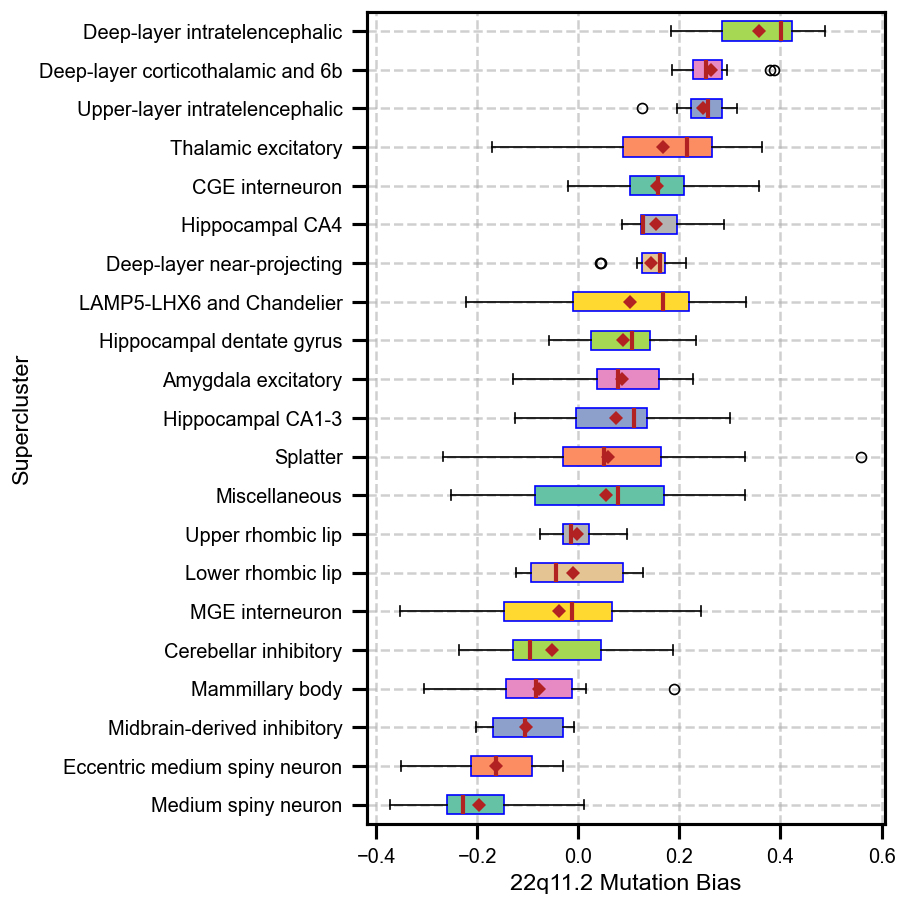

In [401]:
SuperClusterBias_BoxPlot(X22q_Bias, "22q11.2", NeuroOnly=True, sortby="mean")

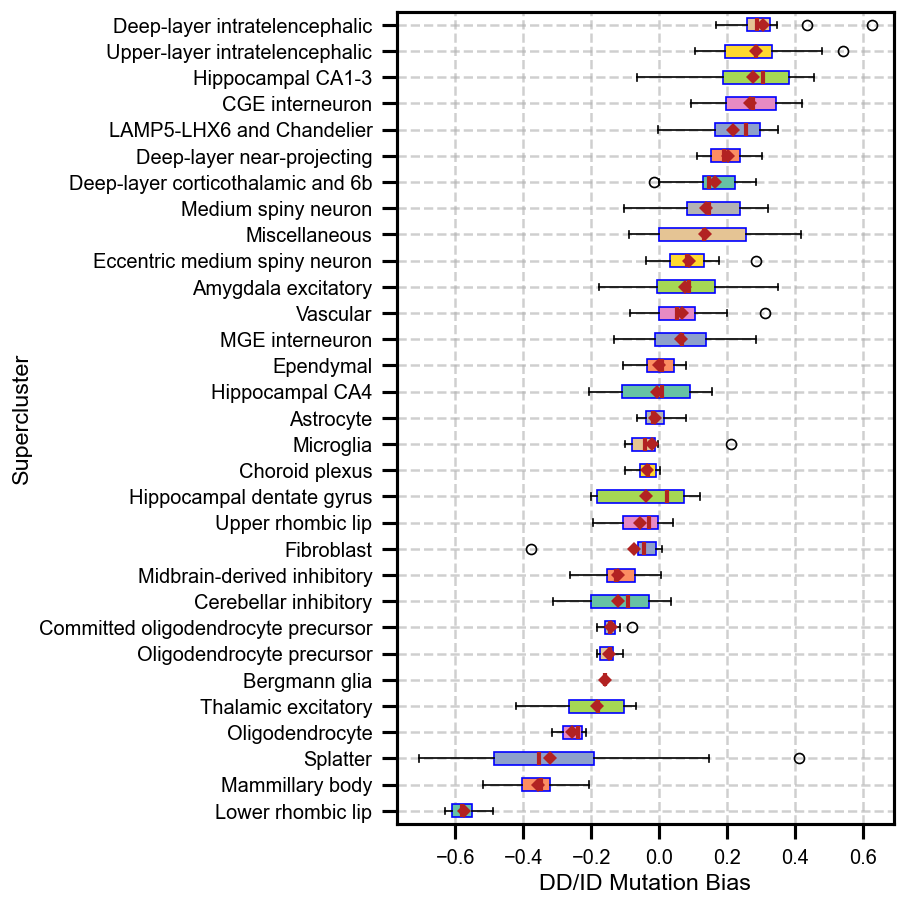

In [ ]:
SuperClusterBias_BoxPlot(DDD_Bias, "DD/ID")

### Bias Correlations and contrast of certain cell types

#### Bias Correlation

SignificanceResult(statistic=0.6416766886272554, pvalue=1.0465229853161184e-45)
21


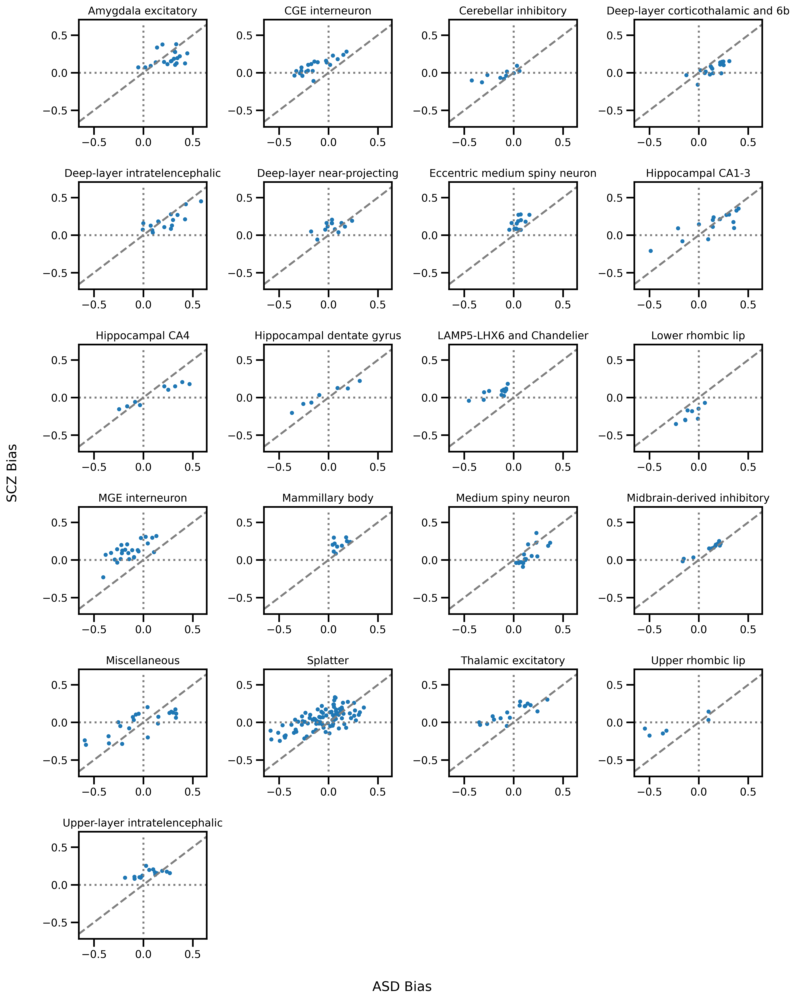

In [20]:
HIQ_ASD_SCZ, fig = CompareCT(HighIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", "",  SuperClusters=Neurons)

In [21]:
HIQ_ASD_SCZ, fig = CompareCT(HighIQ_ASD_Bias, SCZ_Bias, "ASD","SCZ", "",  SuperClusters=ALL_CTs)

SignificanceResult(statistic=0.6696864768731223, pvalue=2.7045149186499455e-61)
31


In [22]:
HIQ_LIQ_ASD, fig = CompareCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "ASD","ASD with ID", "",  SuperClusters=ALL_CTs)

SignificanceResult(statistic=0.7397219115883646, pvalue=5.420076990451356e-81)
31


In [302]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import spearmanr

def PlotBiasContrast2(DF, label1, label2, name1, name2, title=""):
    fig, ax = plt.subplots(dpi=300, figsize=(5, 5))

    X = DF[label1].values; Y=DF[label2].values
    r_all, p_all = spearmanr(X, Y)

    
    DF_neur = DF.loc[Neur_idx, :]
    X = DF_neur[label1].values; Y=DF_neur[label2].values
    r_neur, p_neur = spearmanr(X, Y)
    ax.scatter(X, Y, s=40, color="darkblue", edgecolor='black', alpha=0.7, label="Neuron")
    
    #ax.set_title(title, fontsize=14, pad=15)
    
    xmin = min(min(X), min(Y), -max(X), -max(Y)) * 1.05
    xmax = max(max(X), max(Y), -min(X), -min(Y)) * 1.05

    # Add the diagonal line
    ax.plot([xmin, xmax], [xmin, xmax], color="grey", linestyle="--", linewidth=1.5)
    
    # Add zero axes
    ax.axhline(0, color="grey", linestyle=":", linewidth=1)
    ax.axvline(0, color="grey", linestyle=":", linewidth=1)
    
    ax.set_xlim((xmin, xmax))
    ax.set_ylim((xmin, xmax))
    
    
    # Adjust text position to avoid overlap
    text_x = xmin * 0.85
    text_y = xmax * 0.85
    
    # Position text for "All Cell Types" correlation in top left
    ax.text(text_x, text_y, 
            s=f"SpearmanR = {r_all:.2f}\nP = {p_all:.1e} (All Cell Types)",
            fontsize=10,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    
    # Position text for "Neuron Types" correlation below with more spacing
    ax.text(text_x, text_y - 0.13,
            s=f"SpearmanR = {r_neur:.2f}\nP = {p_neur:.1e} (Neuron Types)", 
            fontsize=10, 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    DF_nonneur = DF.loc[NonNeur_idx, :]
    X = DF_nonneur[label1].values; Y=DF_nonneur[label2].values
    ax.scatter(X, Y, s=40, color="darkred", edgecolor='black', alpha=0.7, label="Non-Neuron")

    ax.set_xlabel(name1, fontsize=18)
    ax.set_ylabel(name2, fontsize=18)
    
    # Style adjustments
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.legend(fontsize=15)
    plt.tight_layout()
    plt.show()

    #print(spearmanr(res["EFFECT_{}".format(name1)].values, res["EFFECT_{}".format(name2)].values))

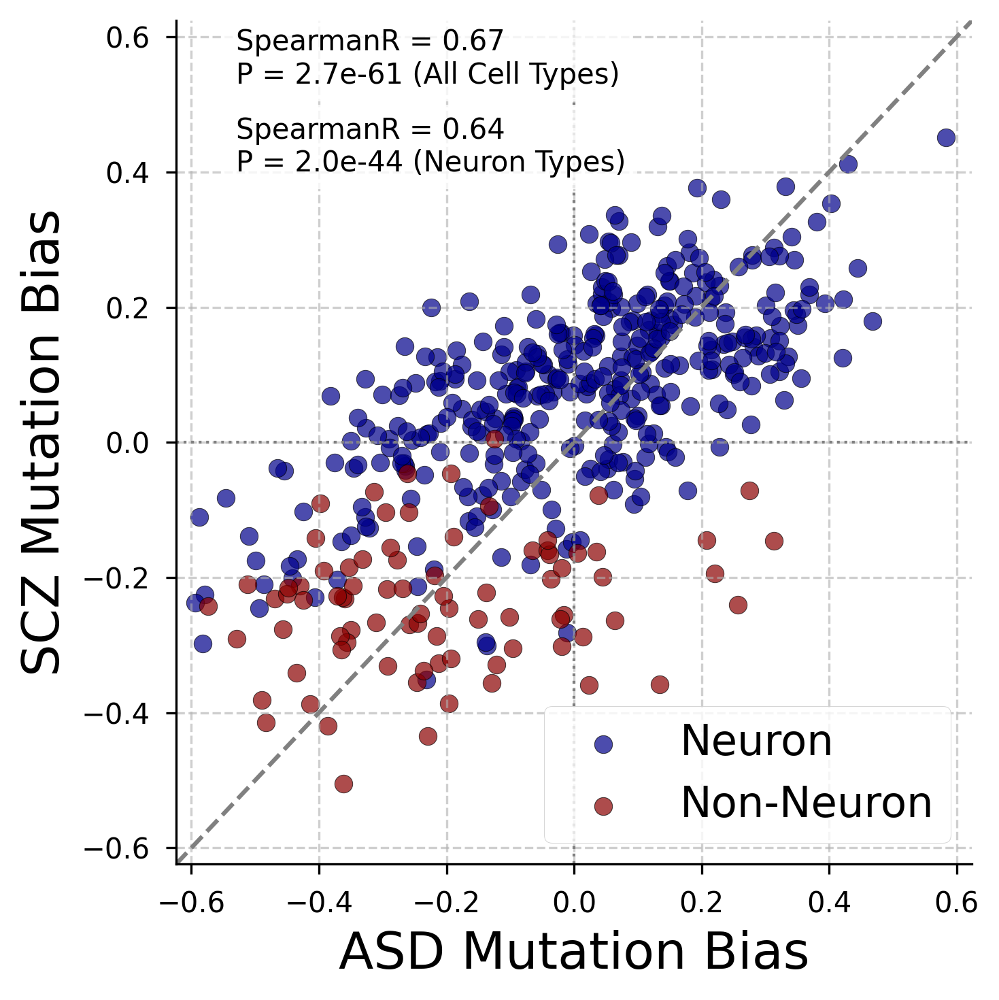

In [303]:
#plt.scatter(res["EFFECT_ASD"].values, res["EFFECT_SCZ"].values)

PlotBiasContrast2(HIQ_ASD_SCZ, label1 = "EFFECT_ASD", label2 = "EFFECT_SCZ", 
                 name1 = "ASD Mutation Bias", name2 = "SCZ Mutation Bias", 
                title = "")

#### Overall Contrasts

In [255]:
def combineBias(Bias1, Bias2, name1="1", name2 = "2"):
    res = Bias1.join(Bias2, how = 'inner', lsuffix="_{}".format(name1), rsuffix="_{}".format(name2))
    res["Diff"] = res["EFFECT_{}".format(name1)] - res["EFFECT_{}".format(name2)]
    return res

In [260]:
def compare_biases(bias1, bias2, name1="1", name2="2", neurons=None):
    """
    Compare two bias datasets and calculate statistics for each cell type.
    
    Args:
        bias1: First bias DataFrame
        bias2: Second bias DataFrame 
        name1: Name/label for first bias dataset (default: "1")
        name2: Name/label for second bias dataset (default: "2")
        neurons: List of neuron types to analyze (default: None)
        
    Returns:
        DataFrame with comparison statistics for each cell type
    """
    BiasDF_cb = combineBias(bias1, bias2, name1=name1, name2=name2)

    # Create list to store results
    results_list = []

    for CT in neurons:
        # Filter data for current CT using proper column name
        CT_mask = BiasDF_cb[f"Supercluster_{name1}"] == CT
        CT_data = BiasDF_cb[CT_mask]
        
        # Get bias values, checking for empty results
        CT_Bias1 = CT_data[f"EFFECT_{name1}"].values
        CT_Bias2 = CT_data[f"EFFECT_{name2}"].values
        stm_1 = np.std(CT_Bias1) / np.sqrt(len(CT_Bias1))
        stm_2 = np.std(CT_Bias2) / np.sqrt(len(CT_Bias2))
        
        if len(CT_Bias1) == 0 or len(CT_Bias2) == 0:
            print(f"Warning: No data found for {CT}")
            continue
            
        # Calculate statistics
        bias = np.mean(CT_Bias1) - np.mean(CT_Bias2)
        
        try:
            t_man, p_man = mannwhitneyu(CT_Bias1, CT_Bias2)
            t_wil, p_wil = wilcoxon(CT_Bias1, CT_Bias2)
        except Exception as e:
            print(f"Error calculating statistics for {CT}: {str(e)}")
            continue
        
        # Add results to list with proper string formatting
        results_list.append({
            'CT': CT,
            f'Bias_{name1}': np.mean(CT_Bias1),
            f'Bias_{name2}': np.mean(CT_Bias2), 
            f'STM_{name1}': stm_1,
            f'STM_{name2}': stm_2,
            'Bias_Diff': bias,
            'Mann_Whitney_P': p_man,
            'Wilcoxon_P': p_wil
        })

    # Convert list to DataFrame and sort
    results = pd.DataFrame(results_list)
    if len(results) > 0:
        results = results.sort_values(by="Bias_Diff")
    else:
        print("Warning: No results generated")
        
    return results

In [310]:
def plot_bias_comparison(results, name1, name2, legend_anchor=(1, 0)):
    # Create publication-quality figure
    plt.style.use('seaborn-v0_8-paper')
    fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

    # Filter results
    results_to_plot = results[(results[f'Bias_{name1}'] > 0) | (results[f'Bias_{name2}'] > 0)]
    x = np.arange(len(results_to_plot))
    width = 0.35

    # Create bars with refined colors and error bars
    bar1 = ax.bar(x - width/2, results_to_plot[f'Bias_{name1}'], width, 
                  label=name1, color='#3182bd', alpha=0.8,
                  yerr=results_to_plot[f'STM_{name1}'], 
                  capsize=4, error_kw={'ecolor': '#08519c', 'capthick': 1.5})

    bar2 = ax.bar(x + width/2, results_to_plot[f'Bias_{name2}'], width,
                  label=name2, color='#e6550d', alpha=0.8,
                  yerr=results_to_plot[f'STM_{name2}'],
                  capsize=4, error_kw={'ecolor': '#a63603', 'capthick': 1.5})

    # Customize plot appearance
    ax.set_ylabel('Mutation Bias', fontsize=30, )
    ax.set_xticks(x)
    ax.set_xticklabels(results_to_plot['CT'], rotation=45, ha='right', 
                       fontsize=21, fontweight='medium')

    # Add refined legend
    ax.legend(fontsize=21, frameon=True, fancybox=True, framealpha=0.9,
             loc='lower right', bbox_to_anchor=legend_anchor)

    # Add zero line and grid
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.3)
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

    # Customize tick parameters
    ax.tick_params(axis='both', which='major', labelsize=21, width=1.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

    # Add significance markers with corrected vertical positioning
    y_max = ax.get_ylim()[1]
    y_min = ax.get_ylim()[0]
    y_range = y_max - y_min

    for i, (idx, row) in enumerate(results_to_plot.iterrows()):
        p_val = row['Wilcoxon_P']
        if p_val < 0.0001:
            marker = '***'
        elif p_val < 0.01:
            marker = '**'
        elif p_val < 0.05:
            marker = '*'
        else:
            marker = 'ns'
            
        # Calculate maximum height of bars and error bars at this position
        bar1_height = row[f'Bias_{name1}'] + row[f'STM_{name1}']
        bar2_height = row[f'Bias_{name2}'] + row[f'STM_{name2}']
        max_height = max(bar1_height, bar2_height)
        
        # Add marker slightly above the highest point
        y_offset = y_range * 0.05  # 5% of the y-axis range
        ax.text(i, max_height + y_offset, marker, 
                ha='center', va='bottom', fontsize=22)

    # Adjust y-axis limits to accommodate markers
    ax.set_ylim(y_min, y_max + y_range * 0.1)  # Add 10% padding at top

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

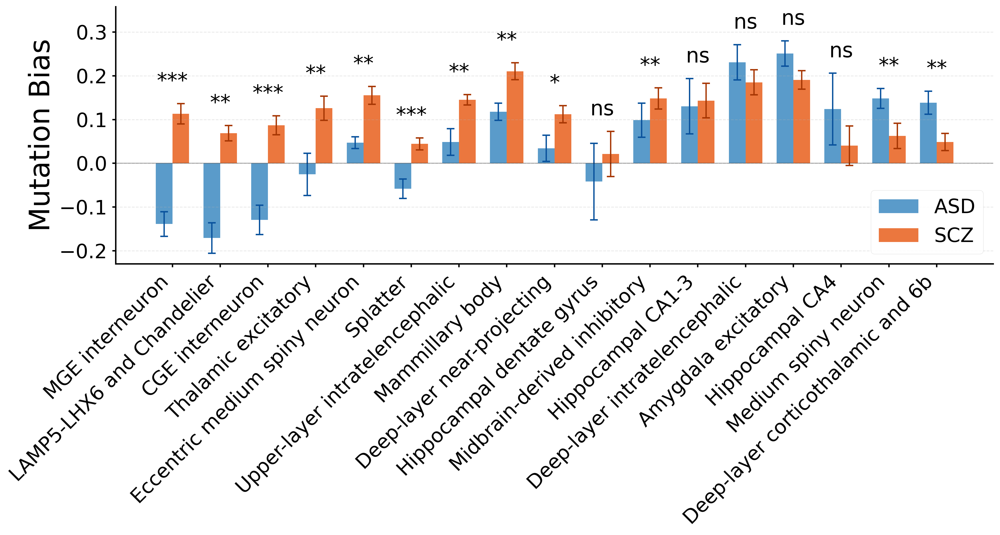

In [307]:
name1="ASD"
name2="SCZ"
results = compare_biases(HighIQ_ASD_Bias, SCZ_Bias, name1="ASD", name2="SCZ", neurons=Neurons)
plot_bias_comparison(results, name1, name2)

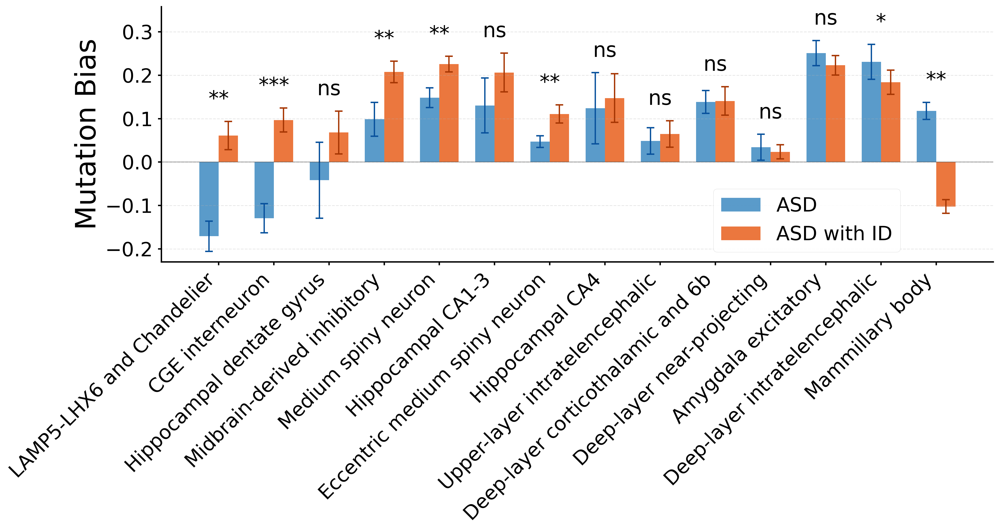

In [314]:
name1="ASD"
name2="ASD with ID"
results = compare_biases(HighIQ_ASD_Bias, LowIQ_ASD_Bias, name1="ASD", name2="ASD with ID", neurons=Neurons)
plot_bias_comparison(results, name1, name2, legend_anchor=(0.9, 0))

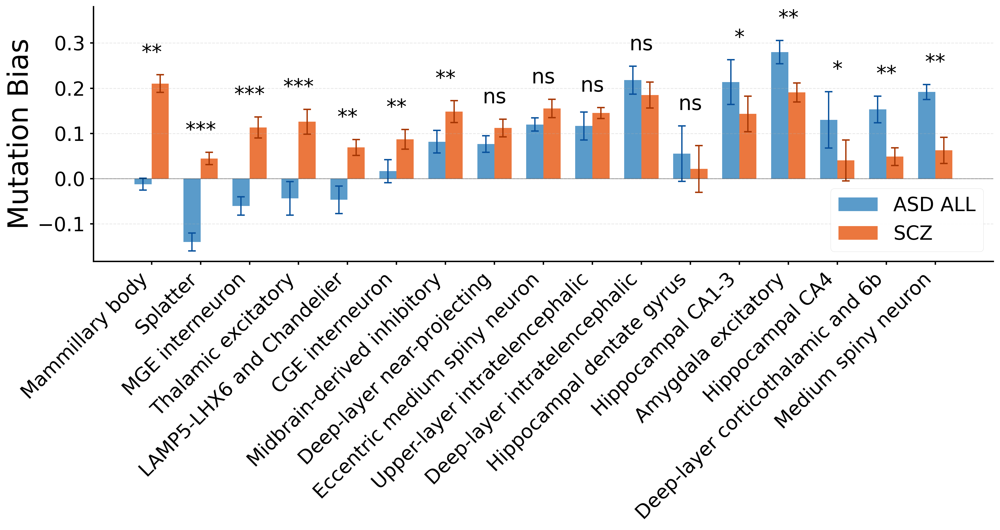

In [309]:
name1="ASD ALL"
name2="SCZ"
results = compare_biases(ASD_Bias, SCZ_Bias, name1="ASD ALL", name2="SCZ", neurons=Neurons)
plot_bias_comparison(results, name1, name2)

In [247]:
name1 = "ASD"
name2 = "ASD with ID"
BiasDF_cb = combineBias(HighIQ_ASD_Bias, LowIQ_ASD_Bias, name1=name1, name2=name2)

# Create list to store results
results_list = []

for CT in Neurons:
    # Filter data for current CT using proper column name
    CT_mask = BiasDF_cb[f"Supercluster_{name1}"] == CT
    CT_data = BiasDF_cb[CT_mask]
    
    # Get bias values, checking for empty results
    CT_ASD_Bias = CT_data[f"EFFECT_{name1}"].values
    CT_SCZ_Bias = CT_data[f"EFFECT_{name2}"].values
    stm_ASD = np.std(CT_ASD_Bias) / np.sqrt(len(CT_ASD_Bias))
    stm_SCZ = np.std(CT_SCZ_Bias) / np.sqrt(len(CT_SCZ_Bias))
    
    if len(CT_ASD_Bias) == 0 or len(CT_SCZ_Bias) == 0:
        print(f"Warning: No data found for {CT}")
        continue
        
    # Calculate statistics
    bias = np.mean(CT_ASD_Bias) - np.mean(CT_SCZ_Bias)
    
    try:
        t_man, p_man = mannwhitneyu(CT_ASD_Bias, CT_SCZ_Bias)
        t_wil, p_wil = wilcoxon(CT_ASD_Bias, CT_SCZ_Bias)
    except Exception as e:
        print(f"Error calculating statistics for {CT}: {str(e)}")
        continue
    
    # Add results to list with proper string formatting
    results_list.append({
        'CT': CT,
        f'Bias_{name1}': np.mean(CT_ASD_Bias),
        f'Bias_{name2}': np.mean(CT_SCZ_Bias), 
        f'STM_{name1}': stm_ASD,
        f'STM_{name2}': stm_SCZ,
        'Bias_Diff': bias,
        'Mann_Whitney_P': p_man,
        'Wilcoxon_P': p_wil
    })

# Convert list to DataFrame and sort
results = pd.DataFrame(results_list)
if len(results) > 0:
    results = results.sort_values(by="Bias_Diff")
else:
    print("Warning: No results generated")

#### Individual CT Contrasts

In [437]:
def PlotBiasContrast_Diff(X, Y, label1, label2, title="", loc=1, text_x=None, text_y=None):
    fig, ax = plt.subplots(dpi=150, figsize=(4, 4))
    # use defualt matplotlib style
    plt.style.use('default')
    # Improved scatter plot with better color and marker
    scatter = ax.scatter(X, Y, s=40, color='dodgerblue', alpha=0.6, edgecolor='k')

    # Title and axis labels with increased font size and weight
    ax.set_title(title, fontsize=18, weight='normal')
    ax.set_xlabel(label1, fontsize=16, weight='normal')
    ax.set_ylabel(label2, fontsize=16, weight='normal')

    # Setting up limits and plot properties
    xmin = min(min(X), min(Y), -max(X), -max(Y)) * 1.05
    xmax = max(max(X), max(Y), -min(X), -min(Y)) * 1.05
    
    BiasDiff = np.mean(X) - np.mean(Y)
    t_wil, p_wil = wilcoxon(X, Y)

    # Plotting the reference lines with explanations
    ax.plot([xmin,xmax],[xmin,xmax], color="grey", ls="dashed")
    ax.plot([0,0],[xmin,xmax], color="grey", ls="dotted")
    ax.plot([xmin,xmax],[0,0], color="grey", ls="dotted")

    # Setting axis limits
    ax.set_xlim((xmin, xmax))
    ax.set_ylim((xmin, xmax))
    
    # Spearman correlation
    r, p = spearmanr(X, Y)
    
    # Calculate the position for the annotation text
    if text_x is None:
        text_x = xmin*0.7
    if text_y is None:
        text_y = xmax*0.7
    if loc == 1:
        text_x = xmin*0.7
        text_y = xmax*0.7
    elif loc == 2:
        text_x = xmax*0.1
        text_y = -xmax*0.7

    # Add text annotation with white background
    ax.text(text_x, text_y, 
            s=f"BiasDiff={BiasDiff:.2f}\nP={p_wil:.1e}",
            fontsize=12, ha='left', va='top')
    
    # Add a legend to explain the lines
    #ax.legend(fontsize=10, loc='upper left')

    # Improve layout and show plot
    plt.tight_layout()
    plt.show()

def CompareSingleCT_New2(Bias1, Bias2, CT, name1="1", name2="2", title="", loc=1, text_x=None, text_y=None):
    res = Bias1.join(Bias2, how='inner', lsuffix=f"_{name1}", rsuffix=f"_{name2}")
    res["Diff"] = res[f"EFFECT_{name1}"] - res[f"EFFECT_{name2}"]
    res = res[res[f"Supercluster_{name1}"]==CT]
    X = res[f"EFFECT_{name1}"].values
    Y = res[f"EFFECT_{name2}"].values
    #PlotBiasContrast(X, Y, name1, name2, title=CT)
    PlotBiasContrast_Diff(X, Y, name1, name2, title=CT, loc=loc, text_x=text_x, text_y=text_y)

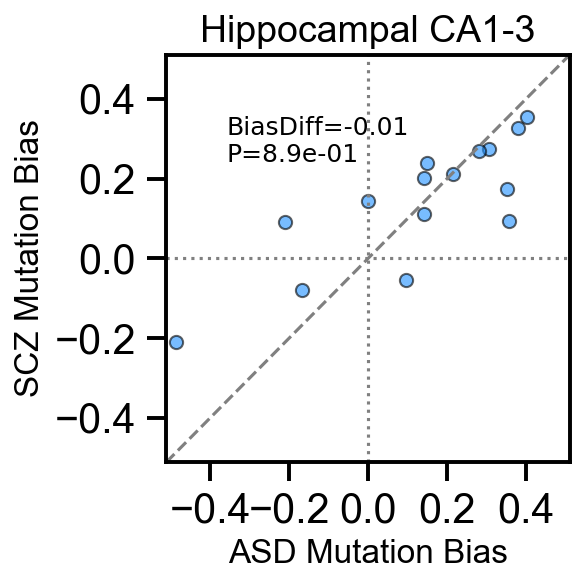

In [438]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Hippocampal CA1-3",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

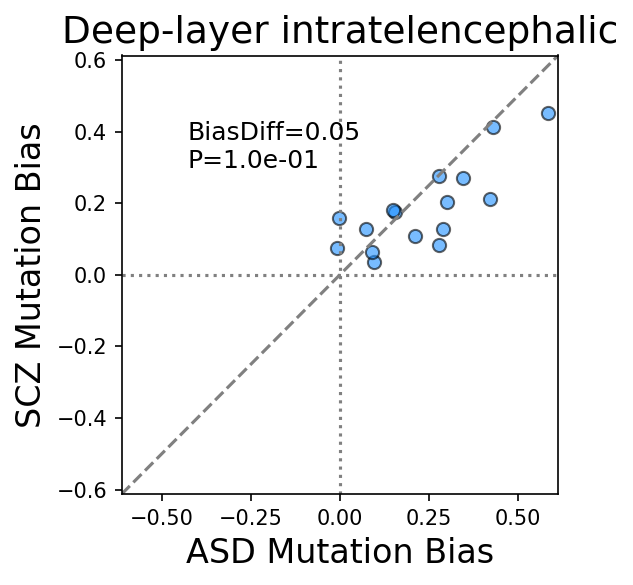

In [439]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer intratelencephalic",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

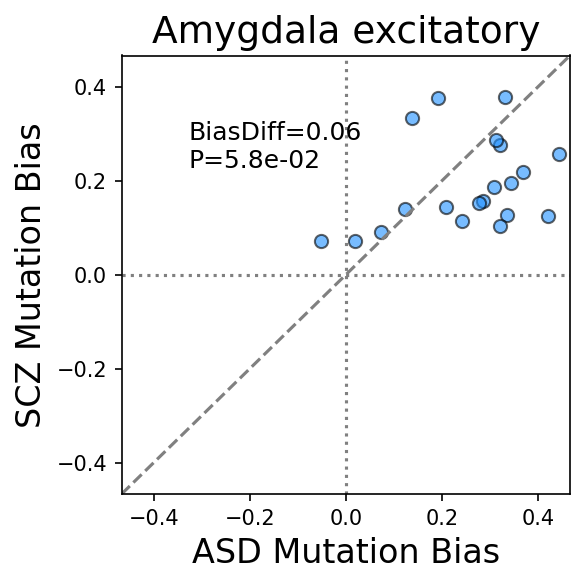

In [440]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Amygdala excitatory",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

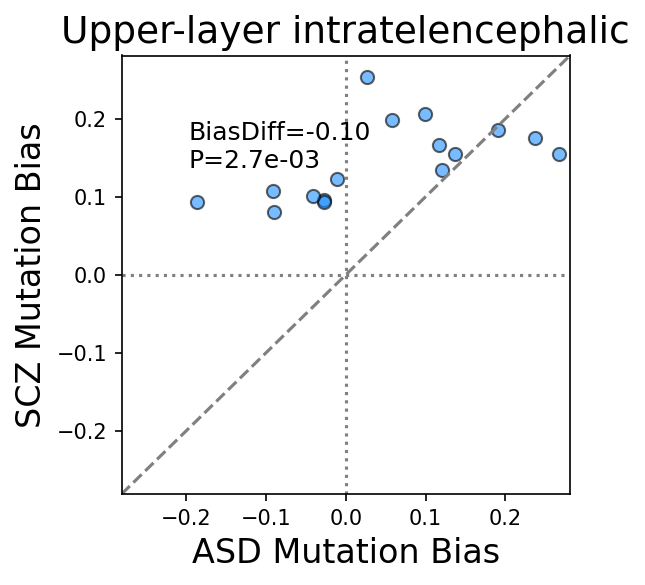

In [441]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Upper-layer intratelencephalic",  
                    "ASD Mutation Bias", "SCZ Mutation Bias")

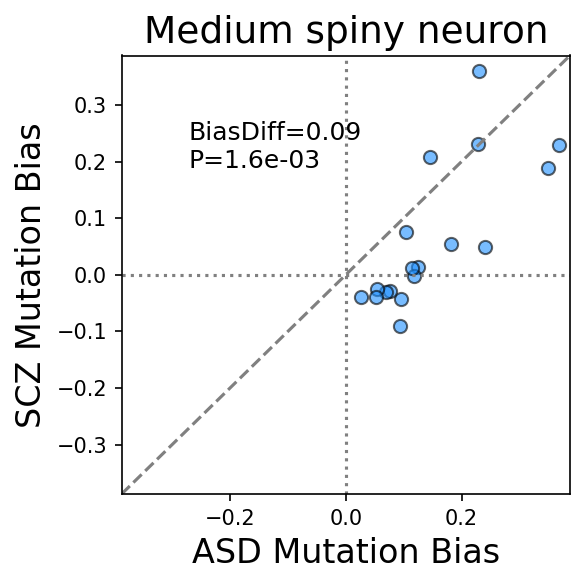

In [442]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Medium spiny neuron",  
                     "ASD Mutation Bias", "SCZ Mutation Bias")

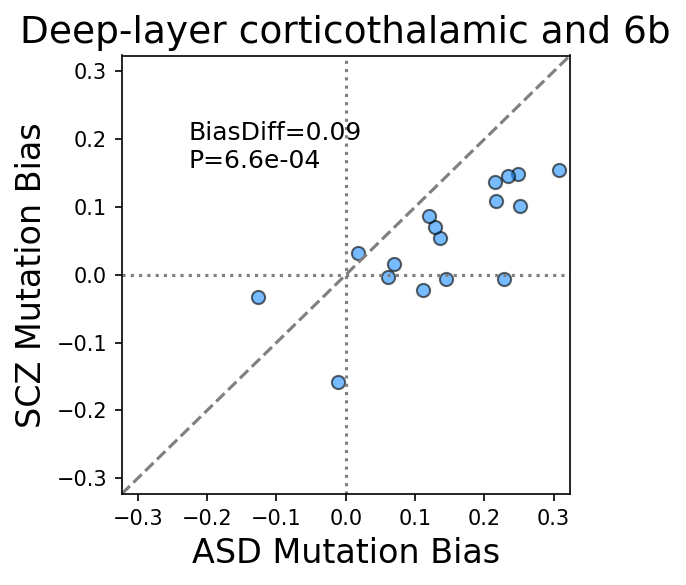

In [443]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "Deep-layer corticothalamic and 6b",  
                     "ASD Mutation Bias", "SCZ Mutation Bias")

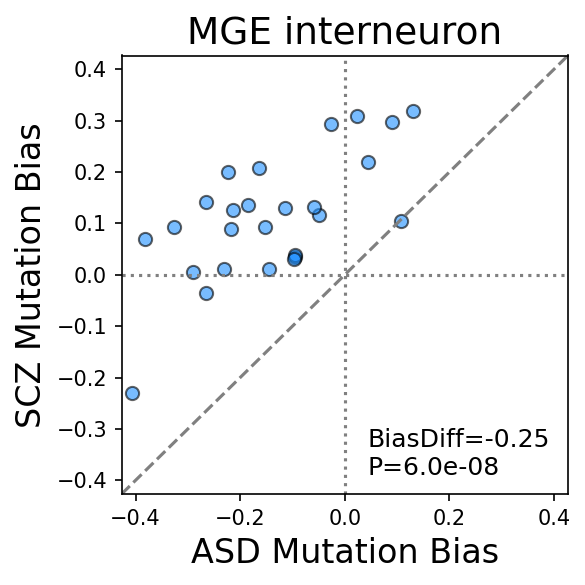

In [330]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "MGE interneuron",  
                    "ASD Mutation Bias", "SCZ Mutation Bias", loc=2
                   )

### SCZ HIQ 22q VIP

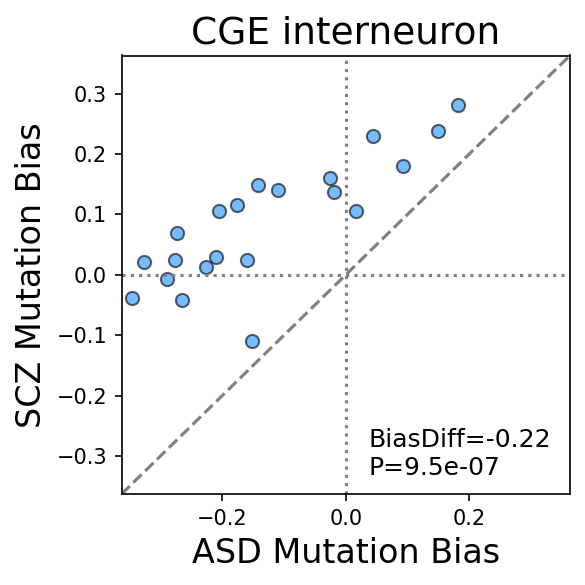

In [331]:
CompareSingleCT_New2(HighIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",  "ASD Mutation Bias", 
                    "SCZ Mutation Bias", loc=2)

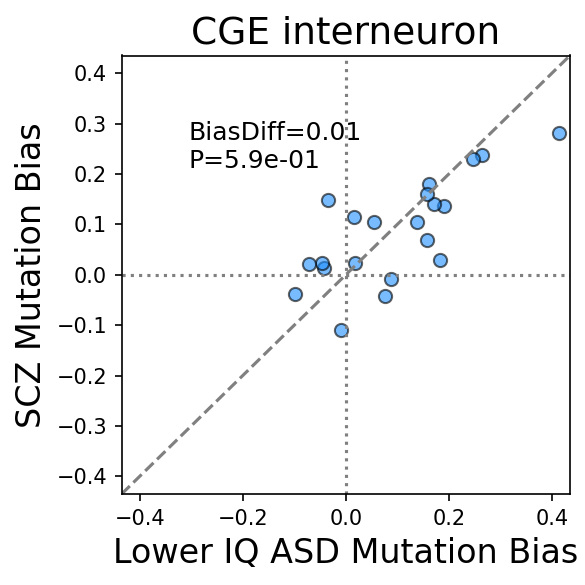

In [332]:
CompareSingleCT_New2(LowIQ_ASD_Bias, SCZ_Bias, "CGE interneuron",  "Lower IQ ASD Mutation Bias", 
                    "SCZ Mutation Bias",)

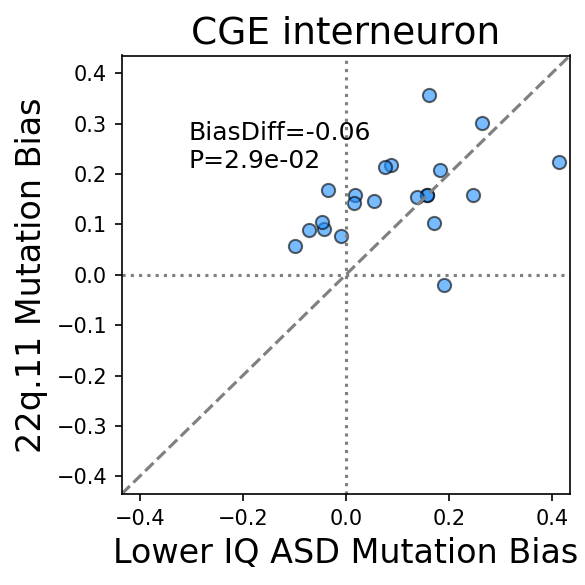

In [333]:
CompareSingleCT_New2(LowIQ_ASD_Bias, X22q_Bias, "CGE interneuron",  "Lower IQ ASD Mutation Bias", 
                    "22q.11 Mutation Bias",)

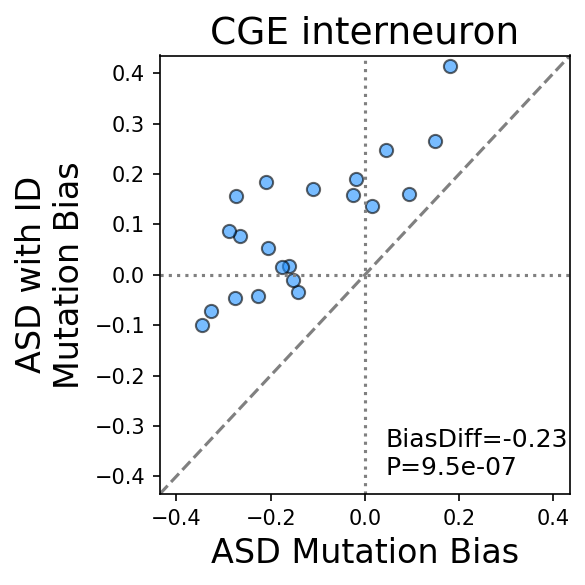

In [334]:
CompareSingleCT_New2(HighIQ_ASD_Bias, LowIQ_ASD_Bias, "CGE interneuron",  "ASD Mutation Bias", 
                    "ASD with ID\nMutation Bias", loc=2)

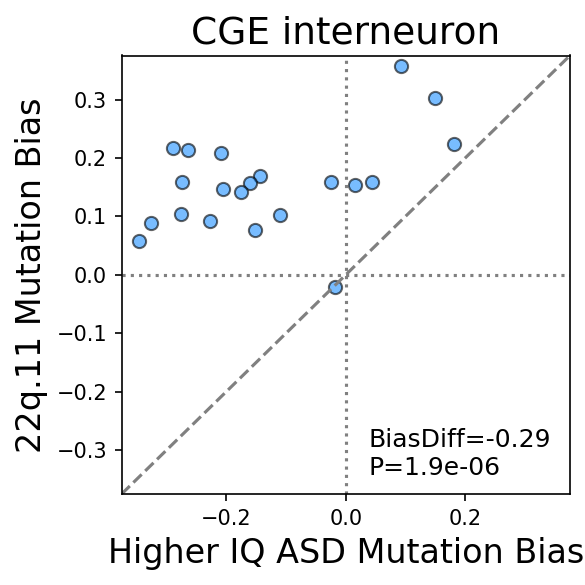

In [335]:
CompareSingleCT_New2(HighIQ_ASD_Bias, X22q_Bias, "CGE interneuron",  "Higher IQ ASD Mutation Bias", 
                    "22q.11 Mutation Bias",loc=2)

In [106]:
#VNR_Neg_Bias = pd.read_csv("../dat3/Bias/CTBias.VNR.Neg.top61.csv", index_col=0)
#VNR_Pos_Bias = pd.read_csv("../dat3/Bias/CTBias.VNR.Pos.top61.csv", index_col=0)
#VNR_Neg_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Neg.top61.csv", index_col=0)
#VNR_Pos_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Pos.top61.csv", index_col=0)
#VNR_Neg_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Neg.top115.csv", index_col=0)
#VNR_Pos_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Pos.top115.csv", index_col=0)
#VNR_Neg_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Neg.top61.csv", index_col=0)#
#VNR_Pos_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Pos.top61.csv", index_col=0)
#VNR_Neg_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Neg.top90.csv", index_col=0)
#VNR_Pos_Bias = pd.read_csv("../dat/Bias/CTBias.VNR.Pos.top90.csv", index_col=0)
Bias_Dir = "/home/jw3514/Work/CellType_Psy/dat/Bias_Jan13_2025"
VNR_Pos_Bias = pd.read_csv(os.path.join(Bias_Dir, "CTBias.VNR.Pos.top61.csv"), index_col=0)
VNR_Neg_Bias = pd.read_csv(os.path.join(Bias_Dir, "CTBias.VNR.Neg.top61.csv"), index_col=0)

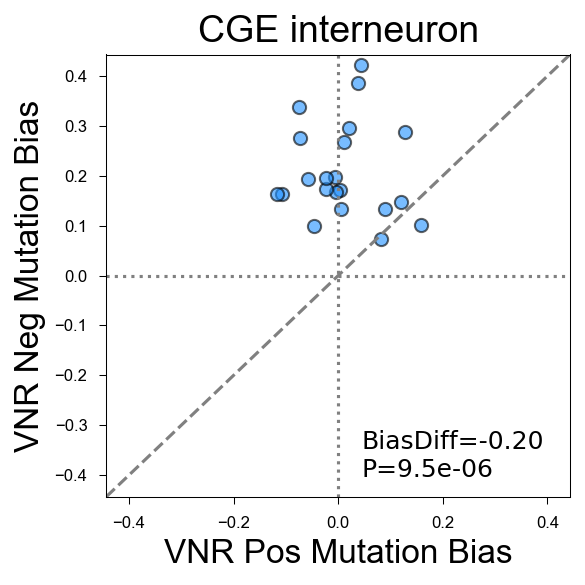

In [354]:
CompareSingleCT_New2(VNR_Pos_Bias, VNR_Neg_Bias, "CGE interneuron",  "VNR Pos Mutation Bias", 
                    "VNR Neg Mutation Bias",loc=2)

In [104]:
#DDD_Bias = pd.read_csv("../dat/Bias/HCT.DDD_ASD_SCZ_Exclude.top.Z2.HCT.csv", index_col=0)
#DDD_Bias = pd.read_csv("../dat/Bias/HCT.DDD_ASD_SCZ_Exclude.Z2.HCT.csv", index_col=0)
Bias_Dir = "/home/jw3514/Work/CellType_Psy/dat/Bias_Jan13_2025"
DDD_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.DDDHC.Z2.HCT.top61.csv"), index_col=0)

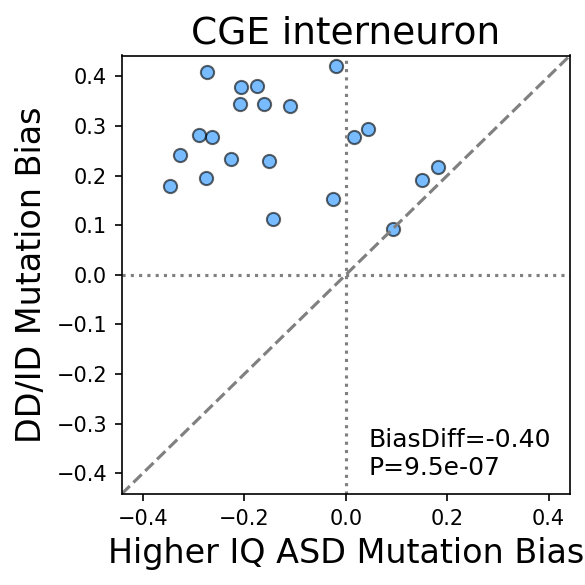

In [355]:
CompareSingleCT_New2(HighIQ_ASD_Bias, DDD_Bias, "CGE interneuron",  "Higher IQ ASD Mutation Bias", 
                    "DD/ID Mutation Bias",loc=2)

#### Complete CT Bias for multiple sets

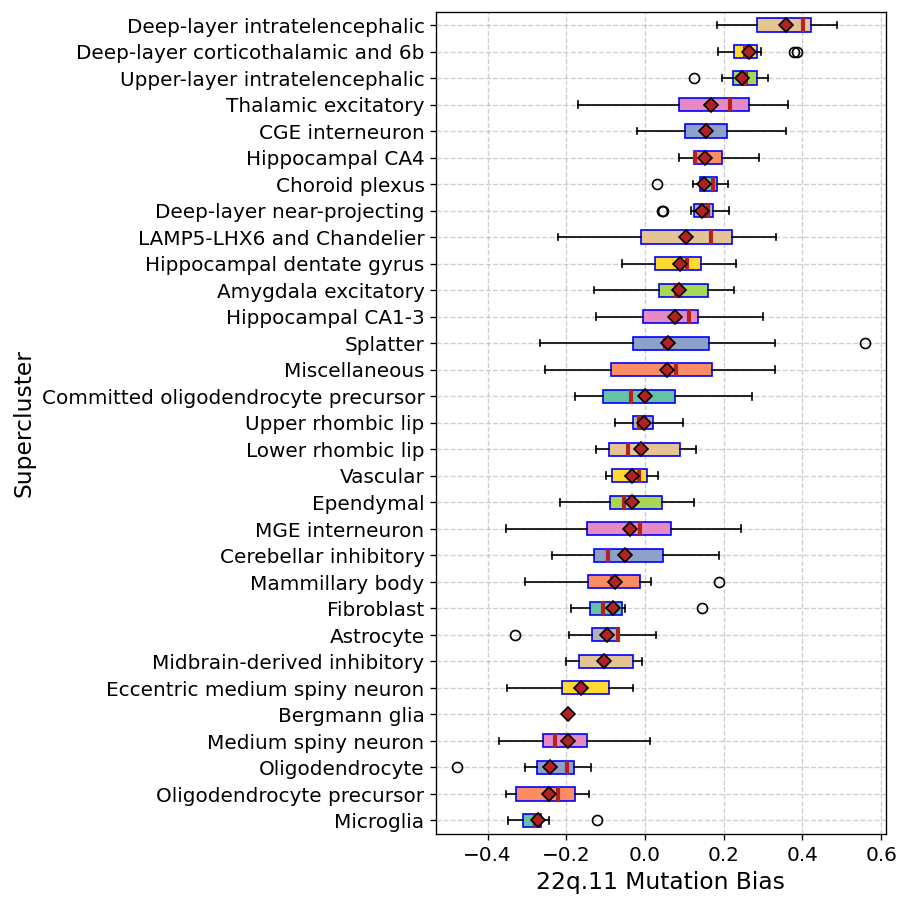

In [356]:
SuperClusterBias_BoxPlot(X22q_Bias, "22q.11")

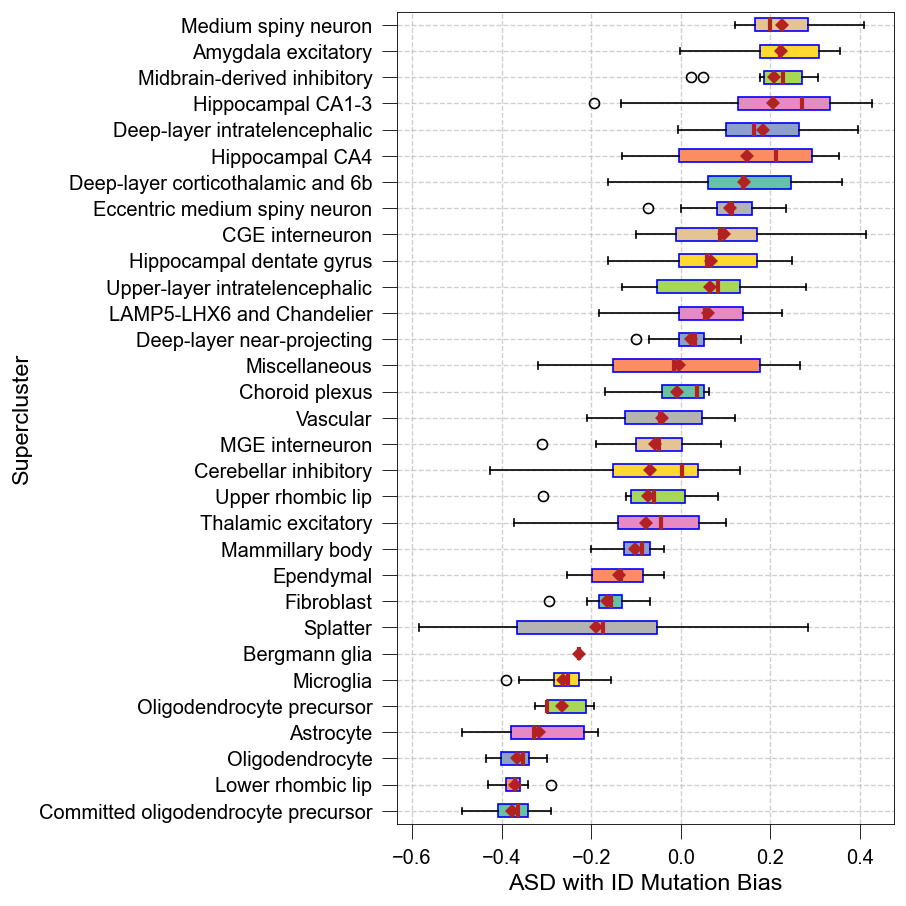

In [375]:
SuperClusterBias_BoxPlot(LowIQ_ASD_Bias, "ASD with ID")

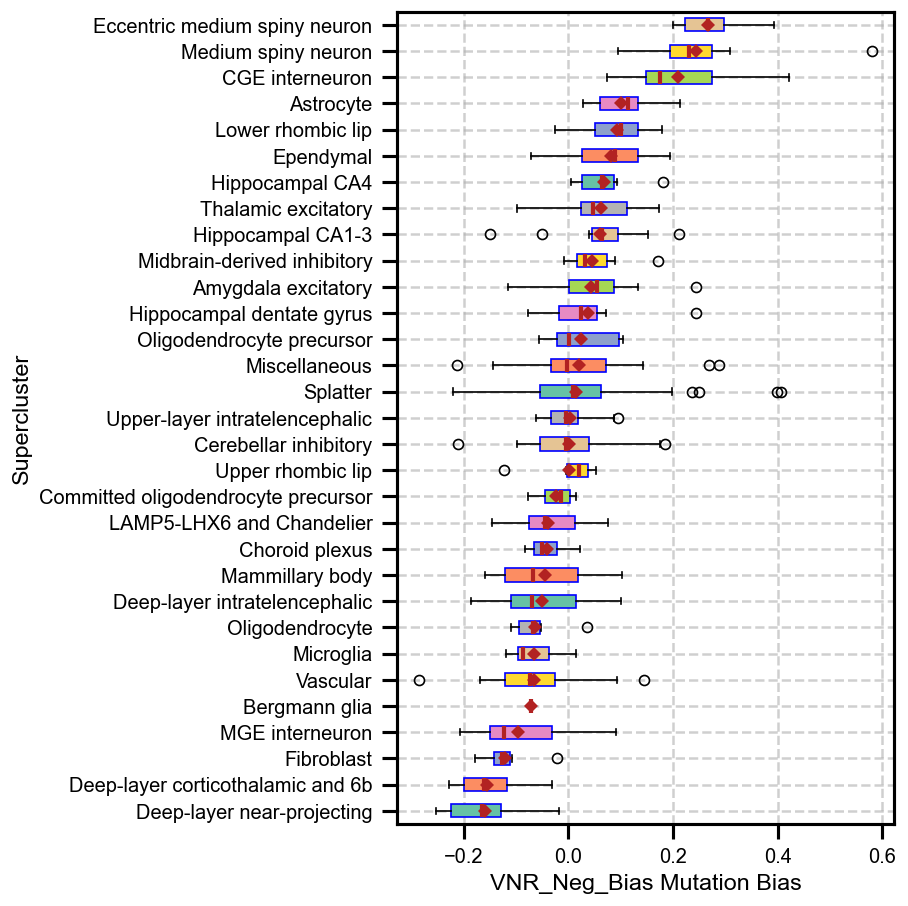

In [376]:
SuperClusterBias_BoxPlot(VNR_Neg_Bias, "VNR_Neg_Bias")

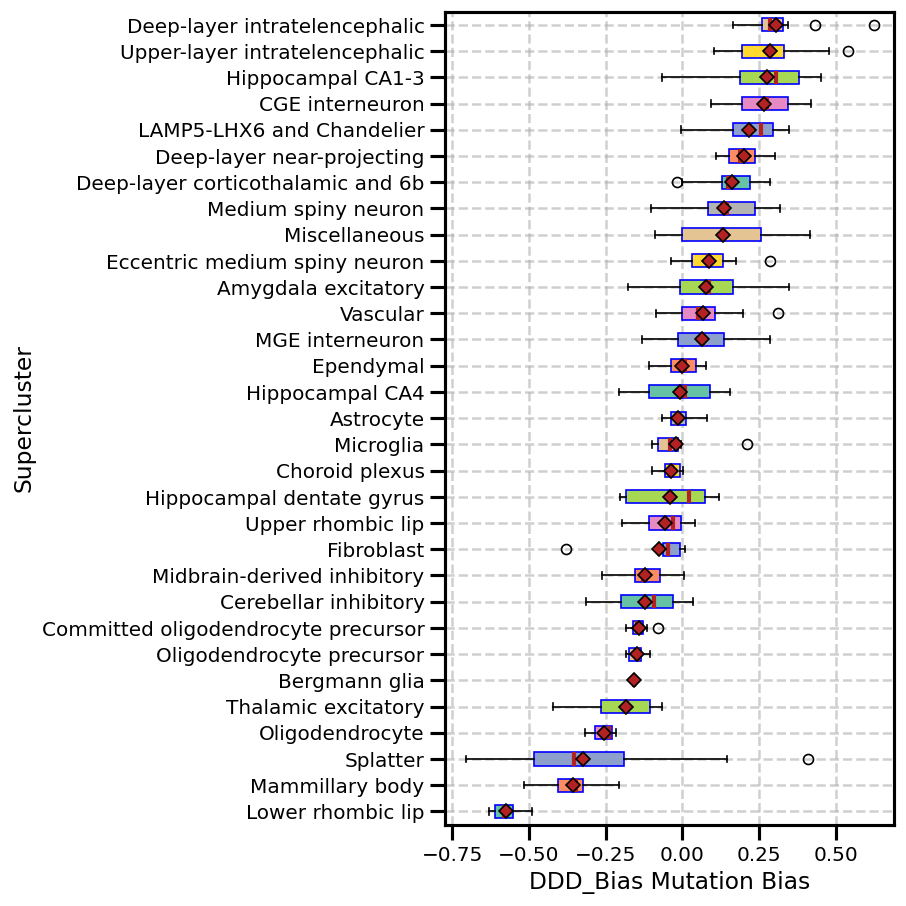

In [358]:
SuperClusterBias_BoxPlot(DDD_Bias, "DDD_Bias")

### Figure 2Boxplot

In [351]:
def GetDat_CompareSingleCT(Bias1, Bias2, CT, name1="1", name2 = "2"):
    res = Bias1.join(Bias2, how = 'inner', lsuffix="_{}".format(name1), rsuffix="_{}".format(name2))
    res["Diff"] = res["EFFECT_{}".format(name1)] - res["EFFECT_{}".format(name2)]
    res = res[res["Supercluster_{}".format(name1)]==CT]
    X = res["EFFECT_{}".format(name1)].values
    Y = res["EFFECT_{}".format(name2)].values
    return X, Y
    #PlotBiasContrast(X, Y, name1, name2, title=CT)
    #PlotBiasContrast_Diff2(X, Y, name1, name2, title=CT, loc=loc)
def PairPlot(data, ylim=(-0.4, 0.5), title=""):


    n_sets = len(data)
    plt.figure(figsize=(12, 8), dpi=300)

    # Offset for separating X and Y points within each set
    offset = 0.2

    # Define a color palette
    setNames = ["ASD", "SCZ", "ASD with ID", "22q.11", "VNR+", "VNR-", "NDD"]
    #colors = ["#7fc97f", "#beaed4", "#fdc086", "#ffff99", "#386cb0", "#f0027f", "#bf5b17"]
    colors = ['#1b9e77','#d95f02','#7570b3','#e7298a','#66a61e','#e6ab02','#a6761d']
    colors_dict = dict(zip(setNames, colors))
    # Track which labels have been added to the legend
    handled_labels = set()

    # Loop through each set and plot the lines connecting X and Y values
    for i, (set_name, values) in enumerate(data.items()):
        # Calculate the x positions for X and Y values
        x_pos_x = i + 1 - offset
        x_pos_y = i + 1 + offset

        # Get the keys for X and Y labels
        key_X, key_Y = values.keys()

        # Plot X values
        if key_X not in handled_labels:
            plt.plot([x_pos_x] * len(values[key_X]), values[key_X], color=colors_dict[key_X], linestyle='-', marker="o", 
                     markersize=8, linewidth=2, label=key_X)
            handled_labels.add(key_X)
        else:
            plt.plot([x_pos_x] * len(values[key_X]), values[key_X], color=colors_dict[key_X], linestyle='-', marker="o", 
                     markersize=8, linewidth=2)

        # Plot Y values
        if key_Y not in handled_labels:
            plt.plot([x_pos_y] * len(values[key_Y]), values[key_Y], color=colors_dict[key_Y], linestyle='--', marker="o", 
                     markersize=8, linewidth=2, label=key_Y)
            handled_labels.add(key_Y)
        else:
            plt.plot([x_pos_y] * len(values[key_Y]), values[key_Y], color=colors_dict[key_Y], linestyle='--', marker="o", 
                     markersize=8, linewidth=2)

        # Draw lines connecting X and Y values
        for x_val, y_val in zip(values[key_X], values[key_Y]):
            plt.plot([x_pos_x, x_pos_y], [x_val, y_val], 'k-', linewidth=1)

        # Perform Wilcoxon paired test
        stat, p_value = wilcoxon(values[key_X], values[key_Y])

        # Annotate p-value above the pair
        y_max = max(max(values[key_X]), max(values[key_Y]))
        plt.text(i + 1, y_max + 0.1 * y_max, f'p = {p_value:.2e}', ha='center', fontsize=15)

    # Setting the x-ticks to be the names of the sets
    plt.xticks(range(1, n_sets + 1), data.keys(), fontsize=15, fontweight='bold')

    # Labeling the axes
    plt.ylabel("Cell Type Bias", fontsize=20, fontweight='bold')

    # Moving the legend outside the main figure area
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=15, frameon=False)

    # Adding a grid for better readability
    plt.grid(True, axis="y", linestyle='--', alpha=0.6)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    # Improving the layout for publication
    plt.tight_layout()

    # Show the plot
    plt.title(title)
    plt.ylim(ylim)
    plt.show()

def GetDat_CompareSingleCT(Bias, CT):
    res = Bias[Bias["Supercluster_{}".format(name1)]==CT]
    X = res["EFFECT{}".format(name1)].values
    return X

def Multi_PairPlot(data, ylim=(-0.4, 0.5), title=""):
    n_sets = len(data)
    plt.figure(figsize=(12, 8), dpi=300)

    # Offset for separating X and Y points within each set
    offset = 0.2

    # Define a color palette
    setNames = ["ASD", "SCZ", "ASD with ID", "22q.11", "VNR+", "VNR-", "NDD"]
    #colors = ["#7fc97f", "#beaed4", "#fdc086", "#ffff99", "#386cb0", "#f0027f", "#bf5b17"]
    colors = ['#1b9e77','#d95f02','#7570b3','#e7298a','#66a61e','#e6ab02','#a6761d']
    colors_dict = dict(zip(setNames, colors))
    # Track which labels have been added to the legend
    handled_labels = set()

    # Loop through each set and plot the lines connecting X and Y values
    for i, (set_name, values) in enumerate(data.items()):
        # Calculate the x positions for X and Y values
        x_pos_x = i + 1 - offset
        x_pos_y = i + 1 + offset

        # Get the keys for X and Y labels
        key_X, key_Y = values.keys()

        # Plot X values
        if key_X not in handled_labels:
            plt.plot([x_pos_x] * len(values[key_X]), values[key_X], color=colors_dict[key_X], linestyle='-', marker="o", 
                     markersize=8, linewidth=2, label=key_X)
            handled_labels.add(key_X)
        else:
            plt.plot([x_pos_x] * len(values[key_X]), values[key_X], color=colors_dict[key_X], linestyle='-', marker="o", 
                     markersize=8, linewidth=2)

        # Plot Y values
        if key_Y not in handled_labels:
            plt.plot([x_pos_y] * len(values[key_Y]), values[key_Y], color=colors_dict[key_Y], linestyle='--', marker="o", 
                     markersize=8, linewidth=2, label=key_Y)
            handled_labels.add(key_Y)
        else:
            plt.plot([x_pos_y] * len(values[key_Y]), values[key_Y], color=colors_dict[key_Y], linestyle='--', marker="o", 
                     markersize=8, linewidth=2)

        # Draw lines connecting X and Y values
        for x_val, y_val in zip(values[key_X], values[key_Y]):
            plt.plot([x_pos_x, x_pos_y], [x_val, y_val], 'k-', linewidth=1)

        # Perform Wilcoxon paired test
        stat, p_value = wilcoxon(values[key_X], values[key_Y])

        # Annotate p-value above the pair
        y_max = max(max(values[key_X]), max(values[key_Y]))
        plt.text(i + 1, y_max + 0.1 * y_max, f'p = {p_value:.2e}', ha='center', fontsize=15)

    # Setting the x-ticks to be the names of the sets
    plt.xticks(range(1, n_sets + 1), data.keys(), fontsize=15, fontweight='bold')

    # Labeling the axes
    plt.ylabel("Cell Type Bias", fontsize=20, fontweight='bold')

    # Moving the legend outside the main figure area
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=15, frameon=False)

    # Adding a grid for better readability
    plt.grid(True, axis="y", linestyle='--', alpha=0.6)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    # Improving the layout for publication
    plt.tight_layout()

    # Show the plot
    plt.title(title)
    plt.ylim(ylim)
    plt.show()

In [89]:
Bias_Dir = "/home/jw3514/Work/CellType_Psy/dat/Bias_Jan13_2025"
HighIQ_ASD_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.ASD61.HIQ.Z2.HCT.csv"), index_col=0)
LowIQ_ASD_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.ASD61.LIQ.Z2.HCT.csv"), index_col=0)
X22q_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.22q11.Z2.HCT.csv"), index_col=0)
VNR_Pos_Bias = pd.read_csv(os.path.join(Bias_Dir, "CTBias.VNR.Pos.top61.csv"), index_col=0)
VNR_Neg_Bias = pd.read_csv(os.path.join(Bias_Dir, "CTBias.VNR.Neg.top61.csv"), index_col=0)
DDD_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.DDDHC.Z2.HCT.top61.csv"), index_col=0)
SCZ_Bias = pd.read_csv(os.path.join(Bias_Dir, "HCT.SCZ61.Z2.HCT.csv"), index_col=0)


### Paired Plot 

In [90]:
CT = "CGE interneuron"
X1, Y1 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, CT)
X2, Y2 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, CT)
X3, Y3 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, X22q_Bias, CT)
X4, Y4 = GetDat_CompareSingleCT(VNR_Pos_Bias, VNR_Neg_Bias, CT)
X5, Y5 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, DDD_Bias, CT)
data = {
    "ASD\nvs\nSCZ": {"ASD": X1, "SCZ": Y1},
    "ASD\nvs\nASD_w_ID": {"ASD": X2, "ASD with ID": Y2},
    "ASD\nvs\n22q.11": {"ASD": X3, "22q.11": Y3},
    "VNR+\nvs\nVNR -": {"VNR+": X4, "VNR-": Y4},
    "ASD\nvs\nNDD": {"ASD": X5, "NDD": Y5},
}
PairPlot(data)

TypeError: GetDat_CompareSingleCT() takes 2 positional arguments but 3 were given

In [91]:
CT = "MGE interneuron"
X1, Y1 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, CT)
X2, Y2 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, CT)
X3, Y3 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, X22q_Bias, CT)
X4, Y4 = GetDat_CompareSingleCT(VNR_Pos_Bias, VNR_Neg_Bias, CT)
X5, Y5 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, DDD_Bias, CT)
data = {
    "ASD\nvs\nSCZ": {"ASD": X1, "SCZ": Y1},
    "ASD\nvs\nASD_w_ID": {"ASD": X2, "ASD with ID": Y2},
    "ASD\nvs\n22q.11": {"ASD": X3, "22q.11": Y3},
    "VNR+\nvs\nVNR -": {"VNR+": X4, "VNR-": Y4},
    "ASD\nvs\nNDD": {"ASD": X5, "NDD": Y5},
}
PairPlot(data, ylim=(-0.5, 0.5), title=CT)

TypeError: GetDat_CompareSingleCT() takes 2 positional arguments but 3 were given

In [92]:
CT = "LAMP5-LHX6 and Chandelier"
X1, Y1 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, SCZ_Bias, CT)
X2, Y2 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, LowIQ_ASD_Bias, CT)
X3, Y3 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, X22q_Bias, CT)
X4, Y4 = GetDat_CompareSingleCT(VNR_Pos_Bias, VNR_Neg_Bias, CT)
X5, Y5 = GetDat_CompareSingleCT(HighIQ_ASD_Bias, DDD_Bias, CT)
data = {
    "ASD\nvs\nSCZ": {"ASD": X1, "SCZ": Y1},
    "ASD\nvs\nASD_w_ID": {"ASD": X2, "ASD with ID": Y2},
    "ASD\nvs\n22q.11": {"ASD": X3, "22q.11": Y3},
    "VNR+\nvs\nVNR -": {"VNR+": X4, "VNR-": Y4},
    "ASD\nvs\nNDD": {"ASD": X5, "NDD": Y5},
}
PairPlot(data, ylim=(-0.5, 0.5), title=CT)

TypeError: GetDat_CompareSingleCT() takes 2 positional arguments but 3 were given

### Multi-Pair Plot

In [371]:
CT = "CGE interneuron"
CT_idx = Anno[Anno["Supercluster"]==CT].index.values

def plot_mutation_bias_comparison(CT, datasets, anno_df):
    """
    Create a comparative plot of mutation bias across multiple datasets for a given cell type.
    
    Parameters:
    -----------
    CT : str
        Cell type name to plot
    datasets : dict
        Dictionary of dataset name -> bias dataframe pairs
    anno_df : pandas DataFrame
        Annotation dataframe with cell type information
        
    Returns:
    --------
    None, displays plot
    """
    # Get cell type indices
    CT_idx = anno_df[anno_df["Supercluster"]==CT].index.values
    
    # Get data for each dataset
    data = {name: df.loc[CT_idx, "EFFECT"] for name, df in datasets.items()}

    # Calculate means and sort datasets
    means = {k: v.mean() for k,v in data.items()}
    sorted_datasets = sorted(data.keys(), key=lambda x: means[x])
    sorted_data = {k: data[k] for k in sorted_datasets}

    # Set style for Nature publication
    plt.style.use('seaborn-v0_8-paper')
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 20  # Increased from 8
    plt.rcParams['font.weight'] = 'normal'  # Added bold
    plt.rcParams['axes.linewidth'] = 0.5
    plt.rcParams['xtick.major.width'] = 0.5
    plt.rcParams['ytick.major.width'] = 0.5

    # Create figure
    fig, ax = plt.subplots(figsize=(4.5, 3.5), dpi=300)

    # Plot individual points and connect same cell types
    positions = range(1, len(sorted_data)+1)
    n_cells = len(CT_idx)

    # Create arrays to store coordinates
    x_coords = np.zeros((n_cells, len(sorted_data)))
    y_coords = np.zeros((n_cells, len(sorted_data)))

    # Plot points and store coordinates
    colors = plt.cm.Set2(np.linspace(0, 1, len(sorted_data)))
    for i, (pos, (label, values)) in enumerate(zip(positions, sorted_data.items())):
        x = np.random.normal(pos, 0.04, size=len(values))
        ax.scatter(x, values, color=colors[i], s=15, alpha=1, label=label)
        
        # Store coordinates for connecting lines
        x_coords[:, i] = x
        y_coords[:, i] = values

    # Connect points for same cell type
    # for cell in range(n_cells):
    #     ax.plot(x_coords[cell], y_coords[cell], color='grey', alpha=0.2, 
    #             linewidth=0.5, ls='dotted')

    # Add boxplots
    bp = ax.boxplot([v for v in sorted_data.values()], positions=positions,
                    showfliers=False, patch_artist=True, widths=0.5)

    #Customize boxplots
    for i, box in enumerate(bp['boxes']):
        box.set(facecolor='white', alpha=0.2)
        box.set(edgecolor='black', linewidth=0.5)
    plt.setp(bp['medians'], color='grey', linewidth=1)
    plt.setp(bp['whiskers'], color='grey', linewidth=0.5)
    plt.setp(bp['caps'], color='grey', linewidth=0.5)

    # Customize plot
    ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.set_xticks(range(1,len(sorted_data)+1))
    ax.set_xticklabels(sorted_data.keys(), rotation=45, ha='center', weight='normal')  # Added bold
    ax.set_ylabel('Mutation Bias', labelpad=5, weight='normal' )  # Added bold
    ax.set_title(f'{CT}', pad=10, weight='normal')  # Added bold

    # Adjust layout
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('grey')
    ax.spines['left'].set_alpha(0.6)
    ax.spines['bottom'].set_color('grey') 
    ax.spines['bottom'].set_alpha(0.6)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()

    plt.show()


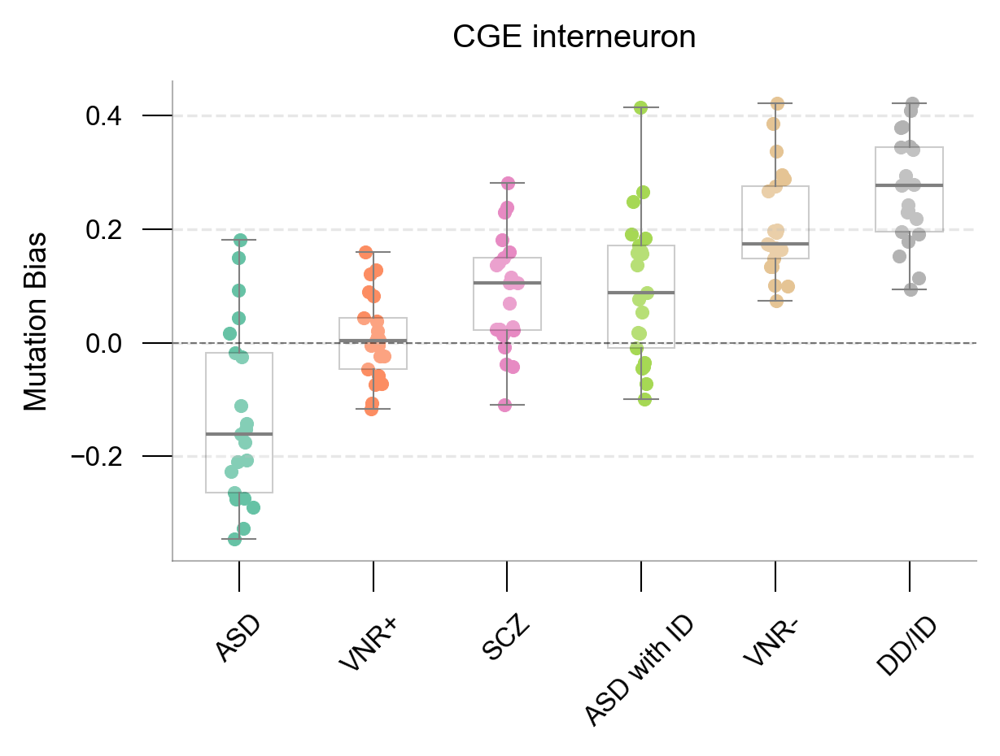

In [372]:
# Example usage:
datasets = {
    'ASD': HighIQ_ASD_Bias,
    'ASD with ID': LowIQ_ASD_Bias,
    'VNR+': VNR_Pos_Bias,
    'VNR-': VNR_Neg_Bias,
    'DD/ID': DDD_Bias,
    'SCZ': SCZ_Bias
}

plot_mutation_bias_comparison("CGE interneuron", datasets, Anno)

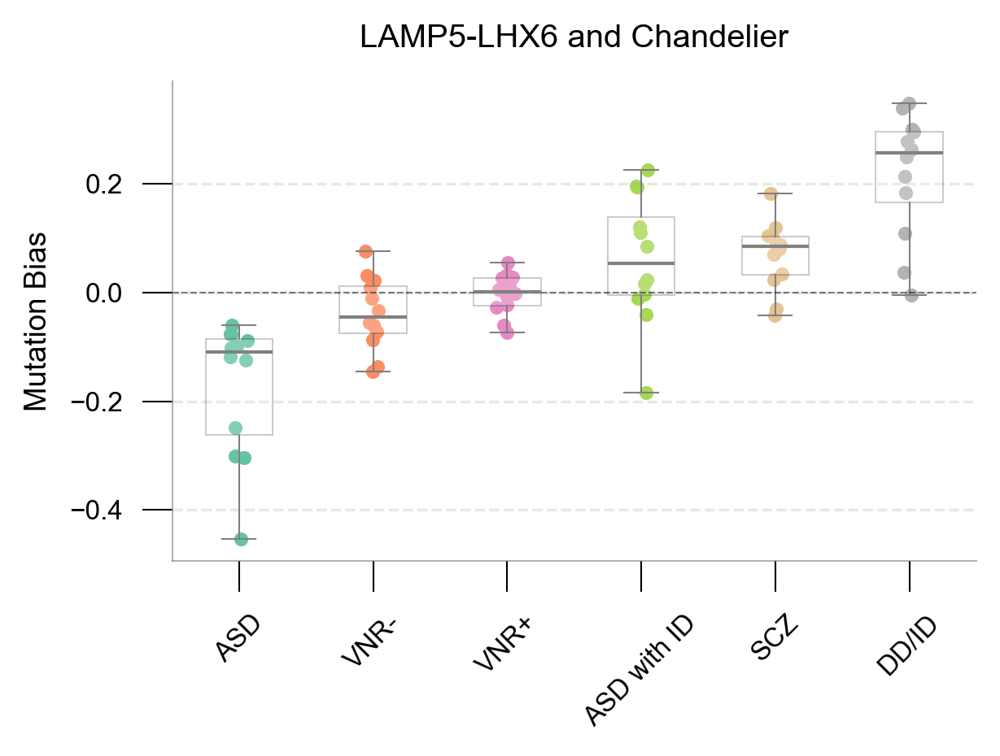

In [373]:

plot_mutation_bias_comparison("LAMP5-LHX6 and Chandelier", datasets, Anno)

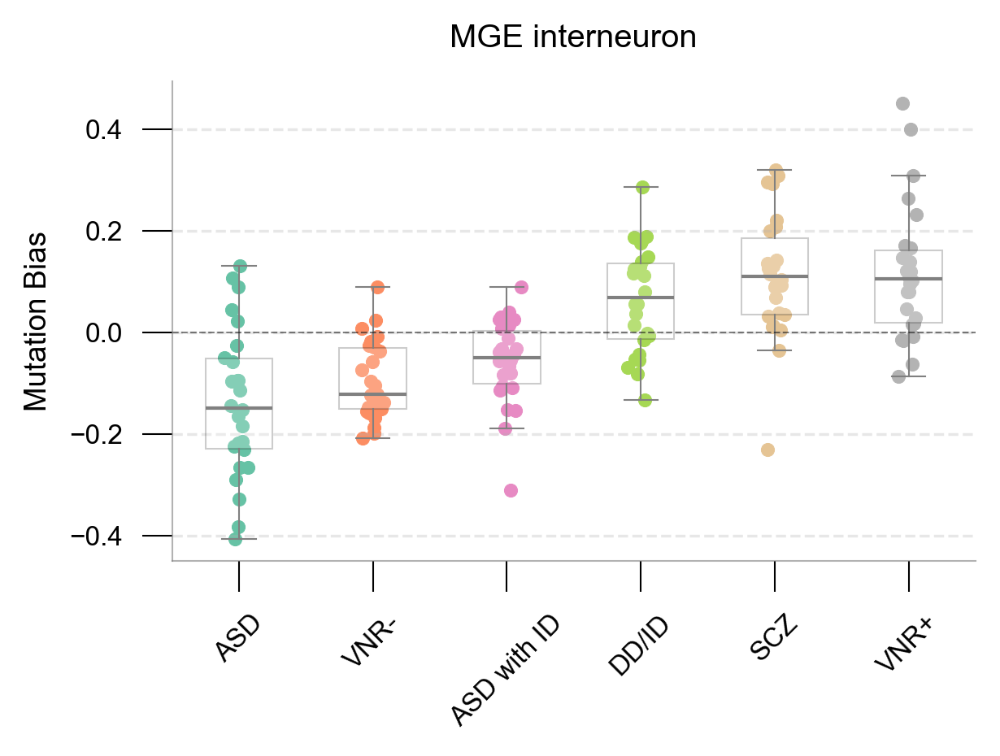

In [374]:

plot_mutation_bias_comparison("MGE interneuron", datasets, Anno)


### VIP 

In [191]:
#ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.Cluster.Log2Mean.Exp.csv", index_col=0)
ExpL = pd.read_csv("/home/jw3514/Work/CellType_Psy/dat/HumanCTExpressionMats/Human.CT.Exp.Entrez.csv", index_col=0)
ExpL.columns = [int(x) for x in ExpL.columns.values ]

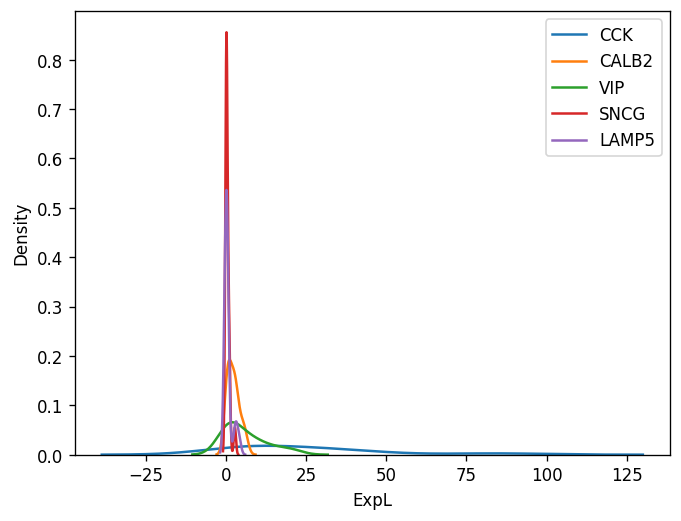

In [192]:
CGE_idx = Anno[Anno["Supercluster"]=="CGE interneuron"].index.values
CT = CGE_idx
PVALB_expl = ExpL.loc[GeneSymbol2Entrez["PVALB"], CT] 
CCK_expl = ExpL.loc[GeneSymbol2Entrez["CCK"], CT]
CALB2_expl = ExpL.loc[GeneSymbol2Entrez["CALB2"], CT]
SST_expl = ExpL.loc[GeneSymbol2Entrez["SST"], CT]
VIP_expl = ExpL.loc[GeneSymbol2Entrez["VIP"], CT]
SNCG_expl = ExpL.loc[GeneSymbol2Entrez["SNCG"], CT]
LAMP5_expl = ExpL.loc[GeneSymbol2Entrez["LAMP5"], CT]

plt.figure(dpi=120)
#sns.kdeplot(PVALB_expl, label="PVALB")
sns.kdeplot(CCK_expl, label="CCK")
sns.kdeplot(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
sns.kdeplot(VIP_expl, label="VIP")
sns.kdeplot(SNCG_expl, label="SNCG")
sns.kdeplot(LAMP5_expl, label="LAMP5")
plt.xlabel("ExpL")
plt.legend()

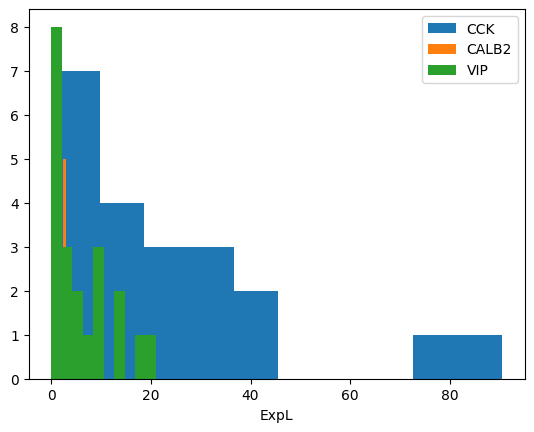

In [193]:
plt.hist(CCK_expl, label="CCK")
plt.hist(CALB2_expl, label="CALB2")
#sns.kdeplot(SST_expl, label="SST")
plt.hist(VIP_expl, label="VIP")
plt.xlabel("ExpL")
plt.legend()

In [194]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

Name1="HIQ ASD"
Name2="22q.11"
index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []
BiasC = []
Bias4 = []
Bias5 = []
Bias6 = []
for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx] )
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx] )
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx] )
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx] )
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx] )
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx] )

    BiasA.append(HighIQ_ASD_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasC.append(SCZ_Bias.loc[idx, "EFFECT"])
    Bias4.append(VNR_Neg_Bias.loc[idx, "EFFECT"])
    Bias5.append(DDD_Bias.loc[idx, "EFFECT"])
    Bias6.append(LowIQ_ASD_Bias.loc[idx, "EFFECT"])
tmpdf = pd.DataFrame({"Index":GABA_ALL_idx, "PV":PV, "SST":SST, "VIP":VIP, "CCK":CCK, "GABA":GABA, 
                      "CR":CR,
                      "EFFECT_"+Name1:BiasA, 
                      "EFFECT_"+Name2:BiasB,
                      "EFFECT_SCZ":BiasC,
                      "EFFECT_VNR":Bias4,
                      "EFFECT_DD":Bias5,
                      "EFFECT_LIQ":Bias6,
                     })
tmpdf = tmpdf.set_index("Index")

In [195]:
tmpdf

,PV,SST,VIP,CCK,GABA,CR,EFFECT_HIQ ASD,EFFECT_22q.11,EFFECT_SCZ,EFFECT_VNR,EFFECT_DD,EFFECT_LIQ
Index,,,,,,,,,,,,
276,0.004808,0.805288,8.779327,24.634615,0.914423,0.432692,0.181656,0.224608,0.280570,0.163673,0.218331,0.414694
277,0.005455,0.162424,0.045455,2.483636,1.015151,1.058788,0.044120,0.158245,0.229249,0.099654,0.293844,0.247990
278,0.007385,1.052111,0.081232,45.028008,0.681064,0.451999,-0.018459,-0.020879,0.137091,0.174296,0.421119,0.190790
279,0.012493,0.159457,2.963595,90.443985,0.822407,1.023106,0.149653,0.302001,0.238356,0.134054,0.191295,0.265459
280,0.015276,0.081277,1.858206,78.125930,0.666079,1.327654,0.016115,0.154299,0.105138,0.133652,0.277653,0.137369
281,0.010295,0.102059,4.373322,33.676365,0.689346,2.556849,0.092647,0.357526,0.180591,0.167203,0.093174,0.160790
282,0.065673,0.440536,0.197715,29.134228,0.512966,0.486140,-0.152339,0.076188,-0.109912,0.288719,0.229344,-0.009812
283,0.010624,1.174502,0.125517,2.032437,0.596841,2.818165,-0.226790,0.091905,0.013407,0.422103,0.232484,-0.042265
284,0.009551,0.463717,5.386541,0.769239,0.667362,3.823691,-0.110326,0.102743,0.140991,0.267258,0.339443,0.170495


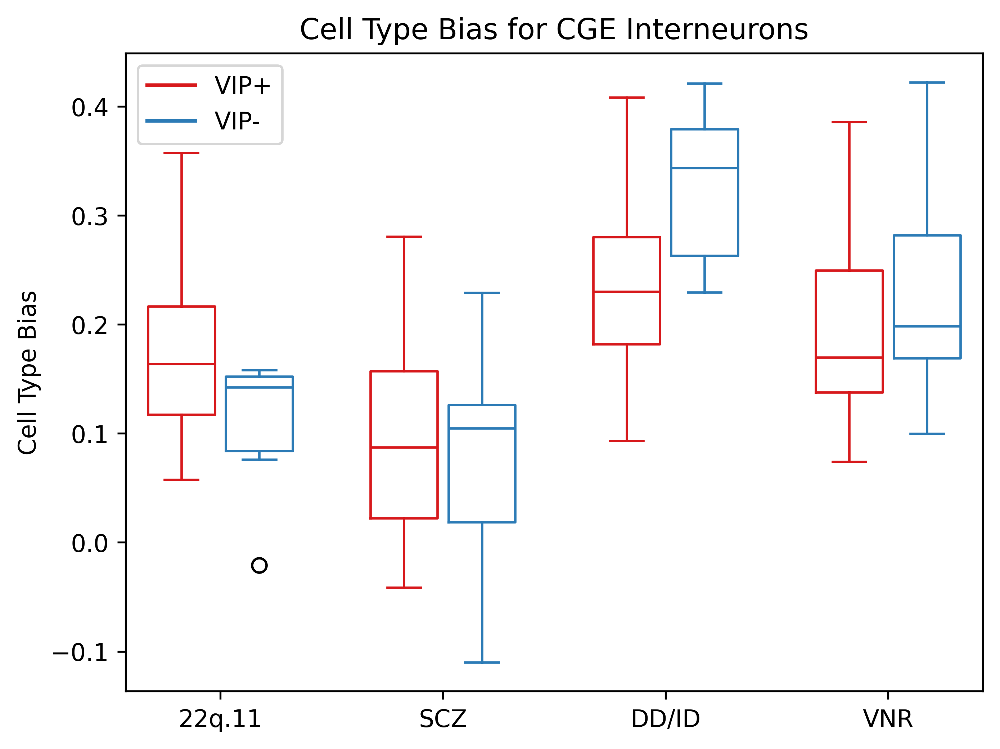

In [196]:
import matplotlib.pyplot as plt
 
# import the numpy package
import numpy as np
 
# create 2 - sample a 3-Dim array, that measures
# the summer and winter rain fall amount
VIP1 = [tmpdf[tmpdf["VIP"]>1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]>1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]>1]["EFFECT_VNR"]]

VIP2 = [tmpdf[tmpdf["VIP"]<1]["EFFECT_22q.11"], 
               tmpdf[tmpdf["VIP"]<1]["EFFECT_SCZ"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_DD"],
               tmpdf[tmpdf["VIP"]<1]["EFFECT_VNR"]]
 
# the list named ticks, summarizes or groups
# the summer and winter rainfall as low, mid
# and high
ticks = ['22q.11', 'SCZ', 'DD/ID', "VNR"]
 
plt.figure(dpi=480)
summer_rain_plot = plt.boxplot(VIP1,
                               positions=np.array(
    np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.6)
winter_rain_plot = plt.boxplot(VIP2,
                               positions=np.array(
    np.arange(len(VIP2)))*2.0+0.35,
                               widths=0.6)
 
def define_box_properties(plot_name, color_code, label):
    for k, v in plot_name.items():
        plt.setp(plot_name.get(k), color=color_code)
    plt.plot([], c=color_code, label=label)
    plt.legend()
 
 
# setting colors for each groups
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')
 
# set the x label values
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks)
plt.ylabel("Cell Type Bias")
# set the limit for x axis
#plt.xlim(-2, len(ticks)*2)
 
# set the limit for y axis
#plt.ylim(0, 50)
 
# set the title
plt.title('Cell Type Bias for CGE Interneurons')
plt.show()

In [501]:
# X22q_cons = pd.read_csv("../dat3/Bias/CTBias.22q11.cons.genes.Z2_HCM.csv", index_col=0)
# X22q_hexp = pd.read_csv("../dat3/Bias/CTBias.22q11.highExp.csv", index_col=0)
# X22q_select = pd.read_csv("../dat3/Bias/CTBias.22q11.select.csv", index_col=0)
# X22q_mousemodel = pd.read_csv("../dat3/Bias/CTBias.22q11.mousemodel.csv", index_col=0)
# X22q_Bias = pd.read_csv("../dat3/Bias/CTBias.22q11.Z2_HCM.csv", index_col=0)

# X22q_cons = pd.read_csv("../dat/Bias/HCT.22q11.Cons.Z2.HCT.csv", index_col=0)
# X22q_hexp = pd.read_csv("../dat/Bias/HCT.22q11.HEXP.Z2.HCT.csv", index_col=0)
# X22q_select = pd.read_csv("../dat/Bias/HCT.22q11.Select.Z2.HCT.csv", index_col=0)
# X22q_mousemodel = pd.read_csv("../dat/Bias/HCT.22q11.mouse.Z2.HCT.csv", index_col=0)
# X22q_Bias = pd.read_csv("../dat/Bias/HCT.22q11.Z2.HCT.csv", index_col=0)
# genes_16p11_Bias = pd.read_csv("../dat/Bias/CTBias.16p11.Z2.HCT.csv", index_col=0)

# BiasDir = "/home/jw3514/Work/CellType_Psy/dat/Bias_Jan13_2025"
# X22q_cons = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Cons.Z2.HCT.csv"), index_col=0)
# X22q_hexp = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.HEXP.Z2.HCT.csv"), index_col=0)
# X22q_select = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Select.Z2.HCT.csv"), index_col=0)
# X22q_mousemodel = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.mouse.Z2.HCT.csv"), index_col=0)
# X22q_Bias = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Z2.HCT.csv"), index_col=0)

BiasDir = "/home/jw3514/Work/CellType_Psy/dat/Bias_Feb25_2025/"
#X22q_cons = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Cons.Z2.HCT.csv"), index_col=0)
#X22q_hexp = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.HEXP.Z2.HCT.csv"), index_col=0)
X22q_select = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Select.Z2.HCT.csv"), index_col=0)
X22q_mousemodel = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.mouse.Z2.HCT.csv"), index_col=0)
X22q_Bias = pd.read_csv(os.path.join(BiasDir, "HCT.22q11.Z2.HCT.csv"), index_col=0)

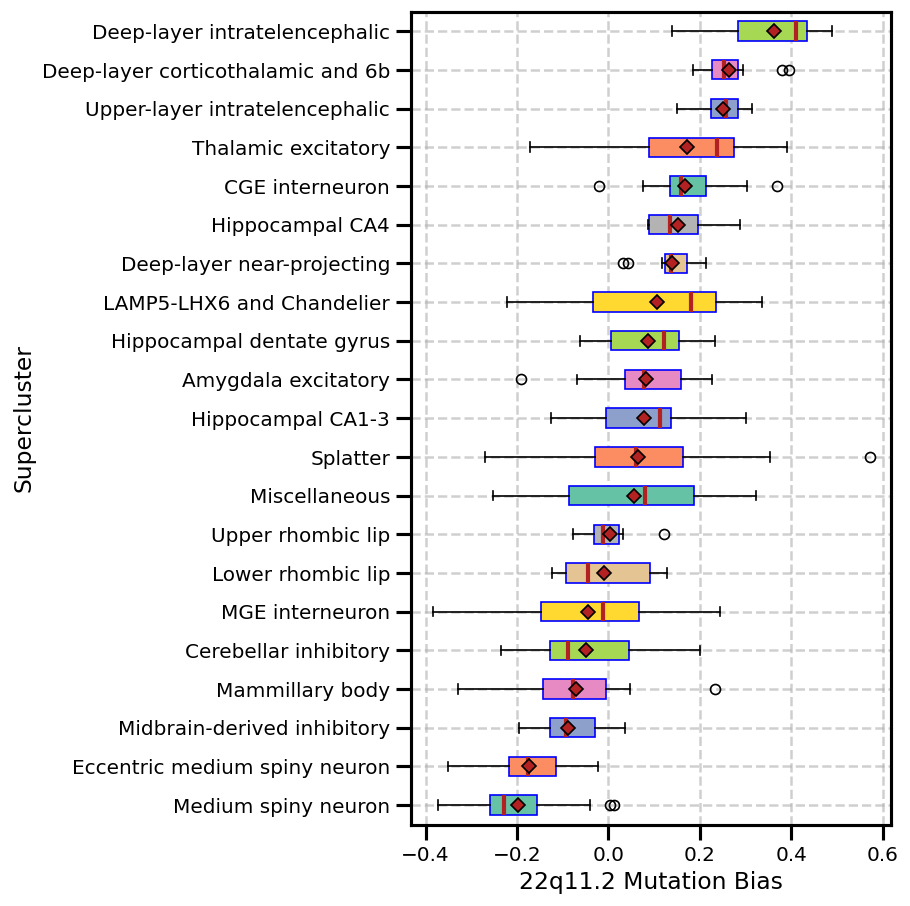

In [502]:
# X22q_Bias = pd.read_csv("../dat/Bias/HCT.X22q61.Z2.HCT.csv", index_col=0)
# X22q_mousemodel = pd.read_csv("../dat/Bias/HCT.X22q61.SD.Z2.HCT.csv", index_col=0)
# X22q_select = pd.read_csv("../dat/Bias/HCT.X22q61.Selected.Z2.HCT.csv", index_col=0)
#SuperClusterBias_BoxPlot(X22q_Bias, "22q.11", )
SuperClusterBias_BoxPlot(X22q_Bias, "22q11.2", NeuroOnly=True, sortby="mean")

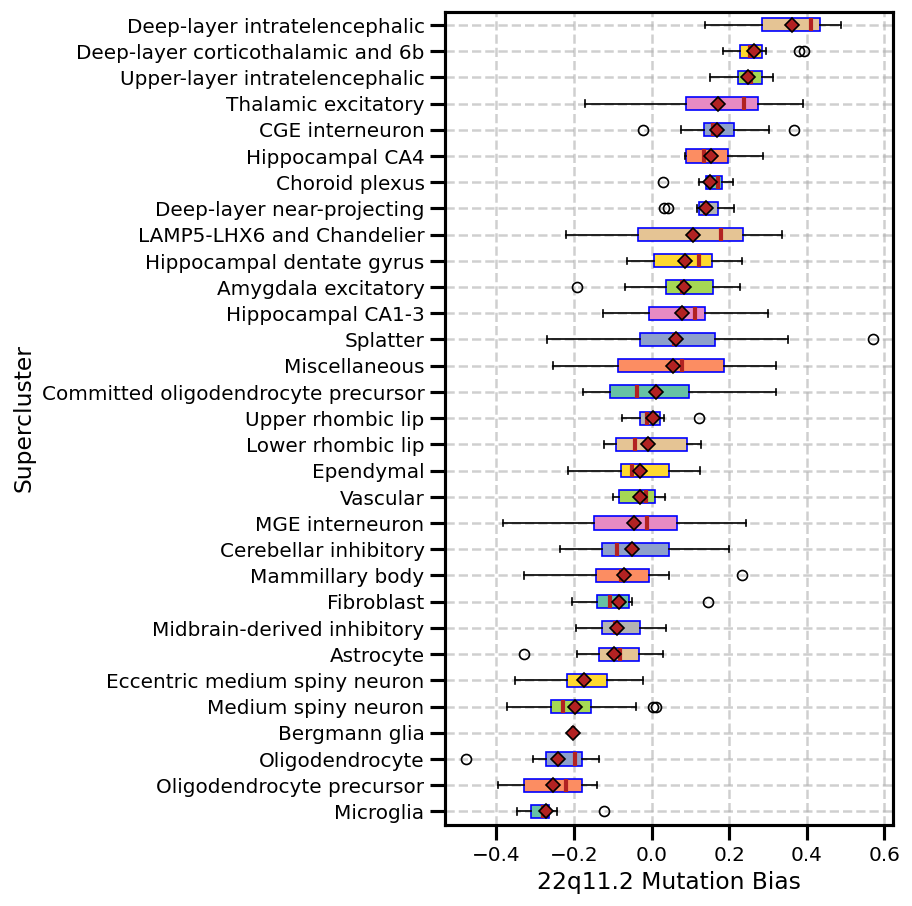

In [503]:
SuperClusterBias_BoxPlot(X22q_Bias, "22q11.2", NeuroOnly=False, sortby="mean")

### CGE IN compare to Other IN

In [504]:
X22q_Bias_CGE = X22q_Bias[X22q_Bias["Supercluster"]=="CGE interneuron"]
X22q_Bias_MGE = X22q_Bias[X22q_Bias["Supercluster"]=="MGE interneuron"]
X22q_Bias_LAMP5 = X22q_Bias[X22q_Bias["Supercluster"]=="LAMP5-LHX6 and Chandelier"]


CGE vs LAMP5: stat=123.000, p=9.255e-01
LAMP5 vs MGE: stat=228.000, p=2.474e-02
CGE vs MGE: stat=487.000, p=4.913e-06


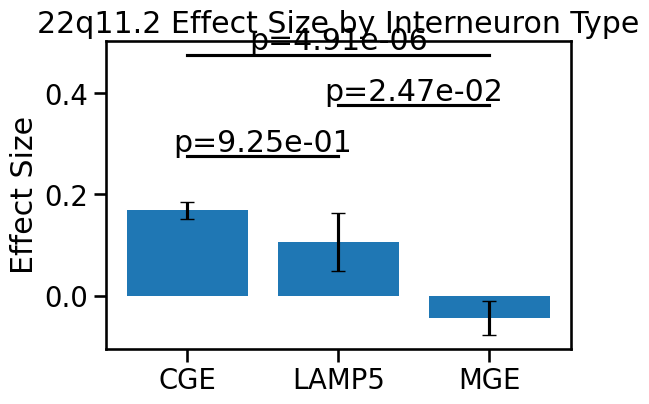

In [505]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
import numpy as np

# Compare CGE vs LAMP5
stat_cge_lamp5, p_cge_lamp5 = mannwhitneyu(X22q_Bias_CGE["EFFECT"].values,
                                          X22q_Bias_LAMP5["EFFECT"].values) 
print("CGE vs LAMP5: stat=%.3f, p=%.3e" % (stat_cge_lamp5, p_cge_lamp5))

# Compare LAMP5 vs MGE 
stat_lamp5_mge, p_lamp5_mge = mannwhitneyu(X22q_Bias_LAMP5["EFFECT"].values,
                                          X22q_Bias_MGE["EFFECT"].values)
print("LAMP5 vs MGE: stat=%.3f, p=%.3e" % (stat_lamp5_mge, p_lamp5_mge))

# Compare CGE vs MGE
stat_cge_mge, p_cge_mge = mannwhitneyu(X22q_Bias_CGE["EFFECT"].values, 
                                      X22q_Bias_MGE["EFFECT"].values)
print("CGE vs MGE: stat=%.3f, p=%.3e" % (stat_cge_mge, p_cge_mge))

# Create bar plot
means = [X22q_Bias_CGE["EFFECT"].mean(),
         X22q_Bias_LAMP5["EFFECT"].mean(), 
         X22q_Bias_MGE["EFFECT"].mean()]
sems = [X22q_Bias_CGE["EFFECT"].std()/np.sqrt(len(X22q_Bias_CGE)),
        X22q_Bias_LAMP5["EFFECT"].std()/np.sqrt(len(X22q_Bias_LAMP5)),
        X22q_Bias_MGE["EFFECT"].std()/np.sqrt(len(X22q_Bias_MGE))]

plt.figure(figsize=(6,4))
bars = plt.bar(['CGE', 'LAMP5', 'MGE'], means, yerr=sems, capsize=5)
plt.ylabel('Effect Size')
plt.title('22q11.2 Effect Size by Interneuron Type')

# Add significance markers
y_max = max(means) + max(sems) + 0.05
plt.plot([0,1], [y_max, y_max], 'k-')
plt.text(0.5, y_max+0.01, f'p={p_cge_lamp5:.2e}', ha='center')

y_max2 = y_max + 0.1
plt.plot([1,2], [y_max2, y_max2], 'k-')
plt.text(1.5, y_max2+0.01, f'p={p_lamp5_mge:.2e}', ha='center')

y_max3 = y_max + 0.2
plt.plot([0,2], [y_max3, y_max3], 'k-')
plt.text(1, y_max3+0.01, f'p={p_cge_mge:.2e}', ha='center')

plt.show()

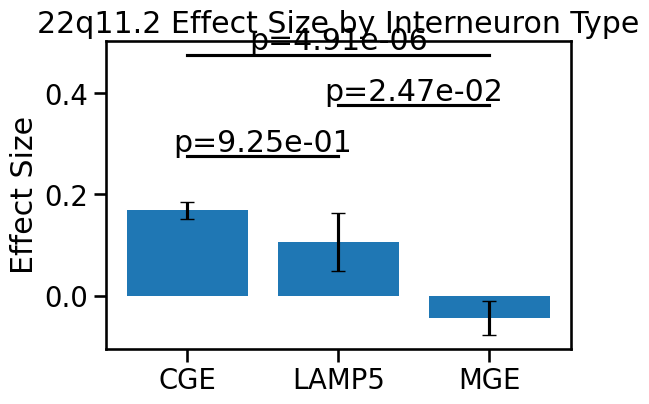

In [506]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt
import numpy as np

# Create bar plot


plt.figure(figsize=(6,4))
bars = plt.bar(['CGE', 'LAMP5', 'MGE'], means, yerr=sems, capsize=5)
plt.ylabel('Effect Size')
plt.title('22q11.2 Effect Size by Interneuron Type')

# Add significance markers
y_max = max(means) + max(sems) + 0.05
plt.plot([0,1], [y_max, y_max], 'k-')
plt.text(0.5, y_max+0.01, f'p={p_cge_lamp5:.2e}', ha='center')

y_max2 = y_max + 0.1
plt.plot([1,2], [y_max2, y_max2], 'k-')
plt.text(1.5, y_max2+0.01, f'p={p_lamp5_mge:.2e}', ha='center')

y_max3 = y_max + 0.2
plt.plot([0,2], [y_max3, y_max3], 'k-')
plt.text(1, y_max3+0.01, f'p={p_cge_mge:.2e}', ha='center')

plt.show()

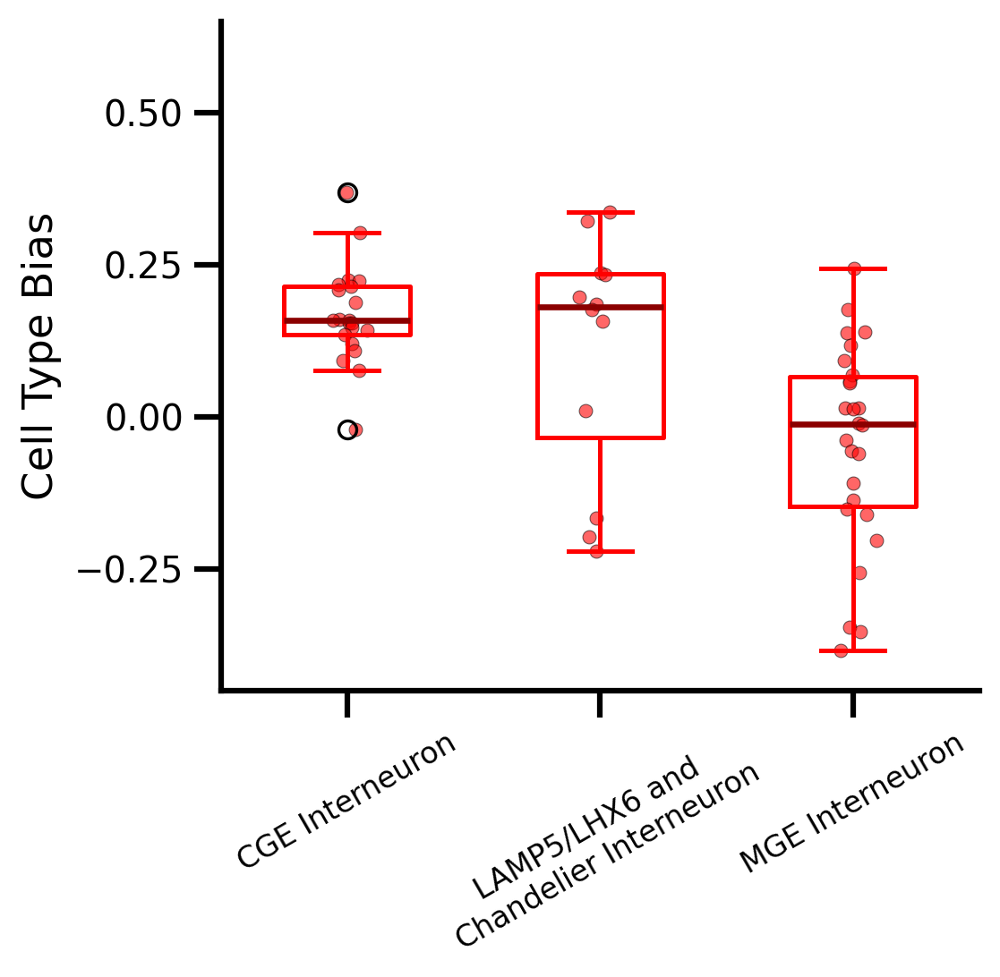

In [507]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# Prepare data
datasets = ['CGE Interneuron', 'LAMP5/LHX6 and \nChandelier Interneuron', 'MGE Interneuron']
labels = datasets

# Get data
dat = [X22q_Bias_CGE["EFFECT"], X22q_Bias_LAMP5["EFFECT"], X22q_Bias_MGE["EFFECT"]]

# Perform Mann-Whitney U tests between groups
stat_cge_lamp5, p_cge_lamp5 = mannwhitneyu(dat[0], dat[1])
stat_lamp5_mge, p_lamp5_mge = mannwhitneyu(dat[1], dat[2]) 
stat_cge_mge, p_cge_mge = mannwhitneyu(dat[0], dat[2])

# Create figure
plt.figure(figsize=(5,5), dpi=240)

# Plot boxplots
pos_boxes = plt.boxplot(dat, positions=np.arange(len(datasets)), widths=0.5,
                       patch_artist=False,
                       boxprops=dict(color="red", linewidth=1.5),
                       medianprops=dict(color="darkred", linewidth=2),
                       whiskerprops=dict(color="red", linewidth=1.5),
                       capprops=dict(color="red", linewidth=1.5))

# Add data points
for i in range(len(datasets)):
    # Add jittered points
    x_pos = np.random.normal(i, 0.04, size=len(dat[i]))
    plt.scatter(x_pos, dat[i], color='red', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

# Customize plot
plt.xticks(range(len(labels)), labels, fontsize=10, fontweight='normal', rotation=30)
plt.yticks(fontsize=12, fontweight='normal')
plt.ylabel("Cell Type Bias", fontsize=14, fontweight='normal')
plt.ylim(-0.45, 0.65)

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### VIP+ vs VIP- 

In [508]:
GABA_ALL = Anno[(Anno["Supercluster"]=="CGE interneuron")]
GABA_ALL_idx = GABA_ALL.index.values

index = []
PV = []
SST = []
VIP = []
CCK = []
GABA = []
CR = []
BiasA = []
BiasB = []
BiasC = []
Bias4 = []
Bias5 = []
Bias6 = []
for idx in GABA_ALL_idx:
    PV.append(ExpL.loc[GeneSymbol2Entrez["PVALB"], idx] )
    SST.append(ExpL.loc[GeneSymbol2Entrez["SST"], idx] )
    VIP.append(ExpL.loc[GeneSymbol2Entrez["VIP"], idx] )
    CCK.append(ExpL.loc[GeneSymbol2Entrez["CCK"], idx] )
    GABA.append(ExpL.loc[GeneSymbol2Entrez["SLC32A1"], idx] )
    CR.append(ExpL.loc[GeneSymbol2Entrez["CALB2"], idx] )

    BiasA.append(X22q_Bias.loc[idx, "EFFECT"])
    BiasB.append(X22q_mousemodel.loc[idx, "EFFECT"])
    BiasC.append(X22q_select.loc[idx, "EFFECT"])
    Bias4.append(X22q_cons.loc[idx, "EFFECT"])
    Bias5.append(X22q_hexp.loc[idx, "EFFECT"])
    Bias6.append(genes_16p11_Bias.loc[idx, "EFFECT"])

tmpdf2 = pd.DataFrame({"Index":GABA_ALL_idx, "PV":PV, "SST":SST, "VIP":VIP, "CCK":CCK, "GABA":GABA, 
                      "CR":CR,
                      "EFFECT_22q.11" :BiasA ,
                      "EFFECT_22q.11_mouse_gene"  :BiasB ,
                      "EFFECT_22q.11_selected":BiasC,
                      "EFFECT_22q.11_constraint":Bias4,
                      "EFFECT_22q.11_HighExp": Bias5,
                      "EFFECT_16p11.2": Bias6,
                     })

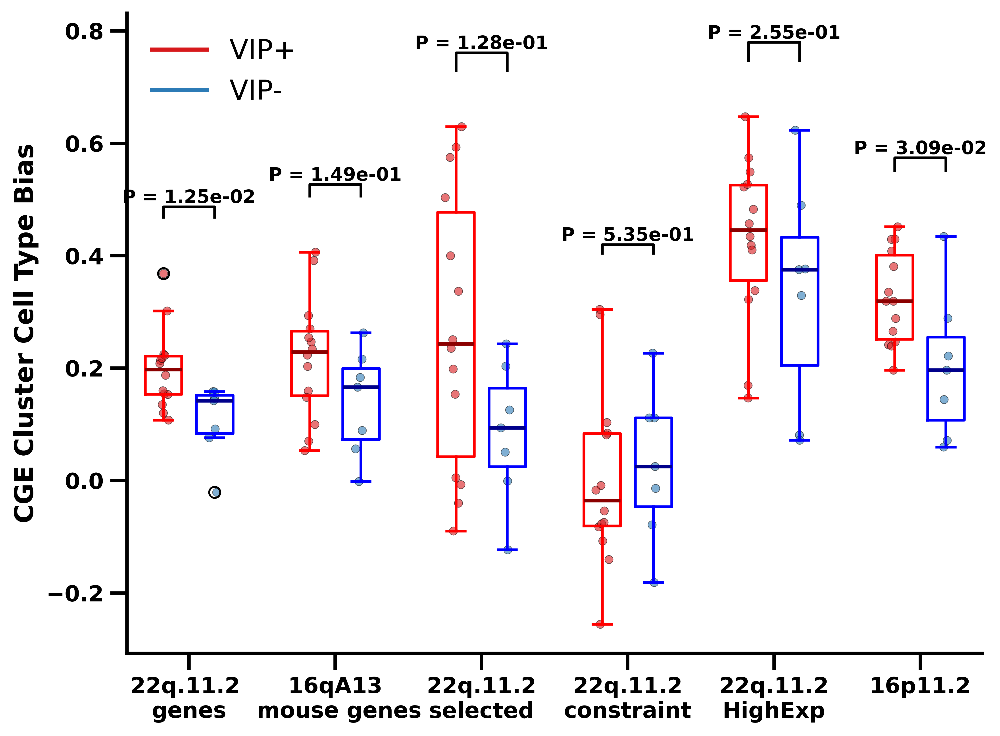

In [509]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_mouse_gene"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_selected"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_constraint"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_HighExp"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_16p11.2"]]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_mouse_gene"], 
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_selected"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_constraint"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_HighExp"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_16p11.2"]]

# Labels
ticks = ['22q.11.2 \ngenes', '16qA13\n mouse genes', '22q.11.2\nselected', '22q.11.2\nconstraint', "22q.11.2\nHighExp", "16p11.2"]

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=600, figsize=(8, 6))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')

# Apply colors and labels
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')

# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Adding p-values with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.2e}", ha='center', va='bottom', color=col, fontsize=10, fontweight='bold')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='bold')
#plt.title("Cell Type Bias Across Different Gene Sets", fontsize=16, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


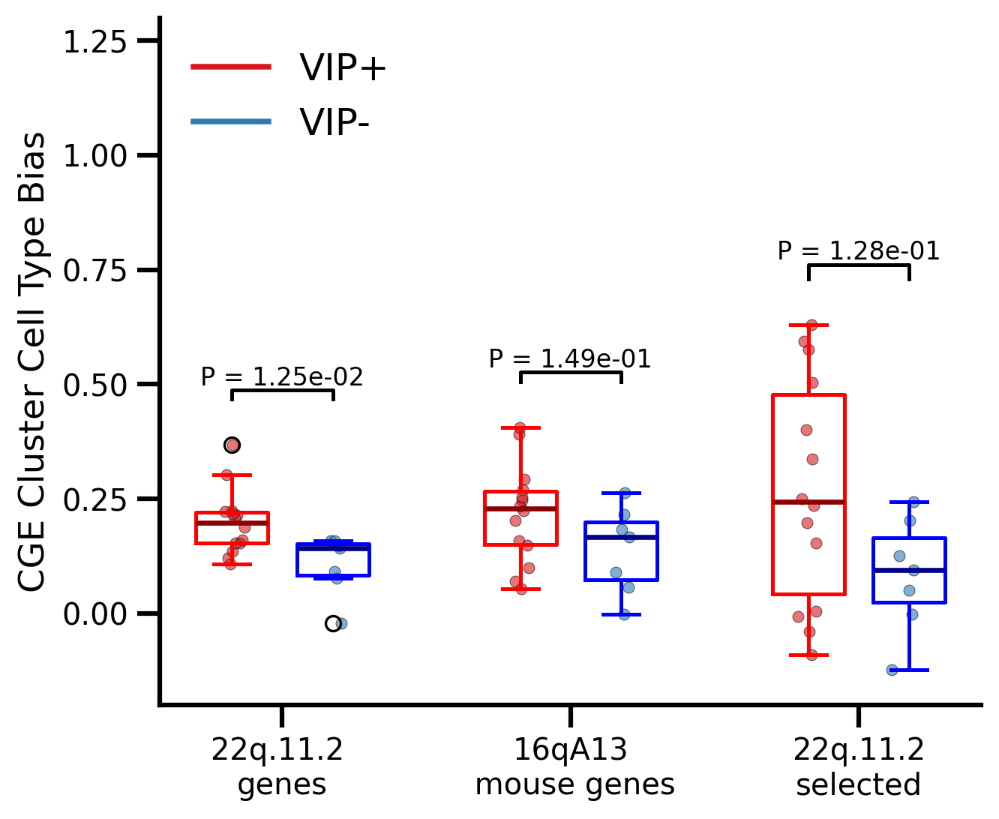

In [510]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_mouse_gene"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_selected"]
]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_mouse_gene"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_selected"]
]

# Labels
ticks = ['22q.11.2 \ngenes', '16qA13\n mouse genes', '22q.11.2\nselected']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=240, figsize=(6, 5))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')

# Apply colors and labels
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')

# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Adding p-values with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.2e}", ha='center', va='bottom', color=col, fontsize=10, fontweight='normal')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='normal')
plt.yticks(fontsize=12, fontweight='normal')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='normal')
plt.ylim(-0.2, 1.3)
#plt.title("Cell Type Bias Across Different Gene Sets", fontsize=16, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


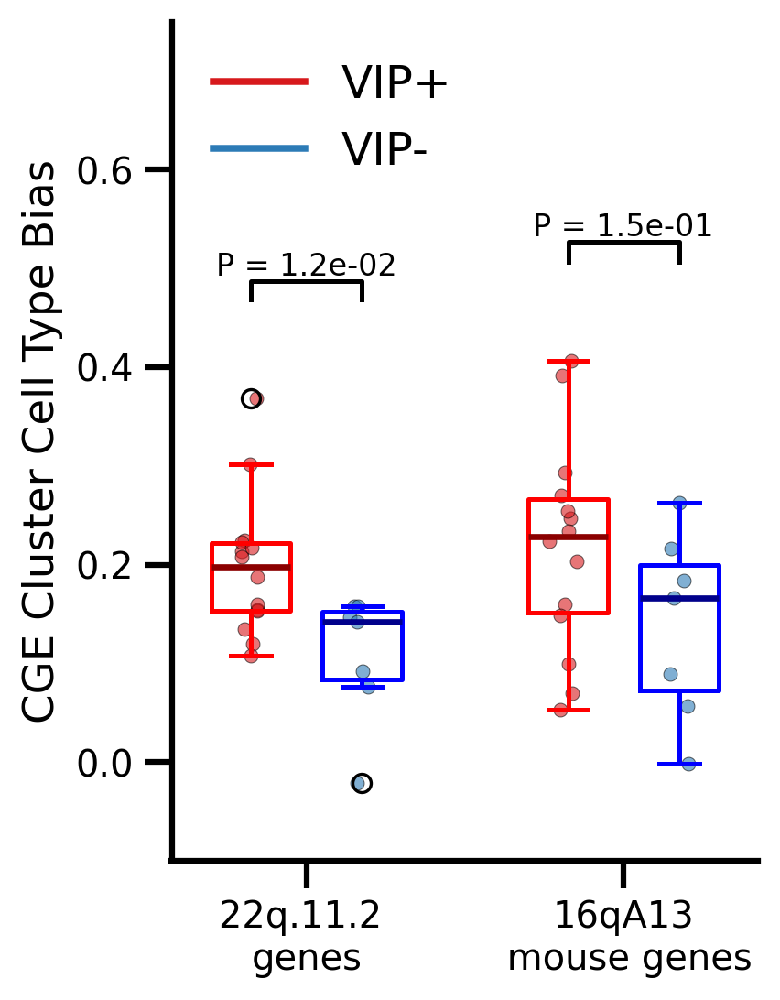

In [511]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11_mouse_gene"],
]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11_mouse_gene"],
]

# Labels
ticks = ['22q.11.2 \ngenes', '16qA13\n mouse genes']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=240, figsize=(4, 5))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')

# Apply colors and labels
define_box_properties(summer_rain_plot, '#D7191C', 'VIP+')
define_box_properties(winter_rain_plot, '#2C7BB6', 'VIP-')

# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Adding p-values with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.1e}", ha='center', va='bottom', color=col, fontsize=10, fontweight='normal')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='normal')
plt.yticks(fontsize=12, fontweight='normal')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='normal')
plt.ylim(-0.1, 0.75)
#plt.title("Cell Type Bias Across Different Gene Sets", fontsize=16, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


In [462]:

Gene22q = [8214, 5625, 9993, 23617, 2928, 6576, 8218, 7290, 64976, 128977,
           8318, 7122, 2812, 6899, 54584, 10587, 1312, 421, 128989, 54487,
           27037, 5902, 29801, 388849, 65078, 85359, 373856, 7625, 91179, 84861,
           51586, 5297, 3053, 9342, 1399, 150209, 8216, 80764, 9127, 6545, 400891,
           8220, 7353, 5413, 79680, 728418]
Gene22q = [x for x in Gene22q if x in ExpL.index]


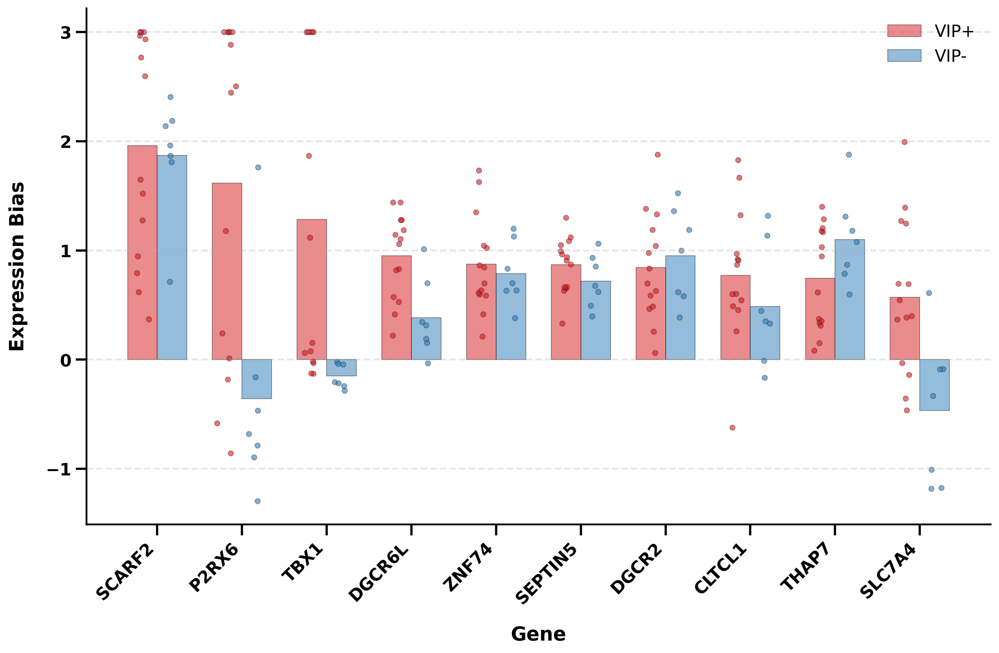

In [463]:
# Get VIP+ and VIP- CGE interneurons based on cutoff
VIP_Pos = tmpdf2[tmpdf2["VIP"] > cutoff]["Index"].values
VIP_Neg = tmpdf2[tmpdf2["VIP"] < cutoff]["Index"].values

# Calculate mean expression for VIP+ and VIP- cells
gene_biases = {}
for gene in Gene22q:
    vip_pos_bias = CT_Z2_MAT_HC.loc[gene, VIP_Pos].mean()
    vip_neg_bias = CT_Z2_MAT_HC.loc[gene, VIP_Neg].mean()
    gene_symbol = Entrez2Symbol[gene]
    gene_biases[gene_symbol] = {'VIP+': vip_pos_bias, 'VIP-': vip_neg_bias}

# Convert to dataframe and calculate difference
bias_df = pd.DataFrame.from_dict(gene_biases, orient='index')
bias_df['difference'] = bias_df['VIP+'] - bias_df['VIP-']
#bias_df = bias_df.sort_values('difference', ascending=False)
bias_df = bias_df.sort_values('VIP+', ascending=False)

# Create publication quality figure
plt.figure(figsize=(12,8), dpi=300)
bias_df = bias_df[bias_df["VIP+"] > 0.1]
top_genes = bias_df.head(10)

x = np.arange(len(top_genes))
width = 0.35

# Plot bars with enhanced styling
plt.bar(x - width/2, top_genes['VIP+'], width, label='VIP+', color='#D7191C', 
        edgecolor='black', linewidth=0.5, alpha=0.5)
plt.bar(x + width/2, top_genes['VIP-'], width, label='VIP-', color='#2C7BB6',
        edgecolor='black', linewidth=0.5, alpha=0.5)

# Add individual dots for each cluster
for i, gene in enumerate(top_genes.index):
    # Get expression values for each cluster
    vip_pos_values = [CT_Z2_MAT_HC.loc[GeneSymbol2Entrez[gene], idx] for idx in VIP_Pos]
    vip_neg_values = [CT_Z2_MAT_HC.loc[GeneSymbol2Entrez[gene], idx] for idx in VIP_Neg]
    
    # Add jitter
    x_pos = np.random.normal(i - width/2, width/8, size=len(vip_pos_values))
    x_neg = np.random.normal(i + width/2, width/8, size=len(vip_neg_values))
    
    # Plot dots
    plt.scatter(x_pos, vip_pos_values, color='#D7191C', alpha=0.6, s=20, edgecolor='black', linewidth=0.3)
    plt.scatter(x_neg, vip_neg_values, color='#2C7BB6', alpha=0.6, s=20, edgecolor='black', linewidth=0.3)

# Enhance text elements
plt.xticks(x, top_genes.index, rotation=45, ha='right', fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.legend(fontsize=14, frameon=False)

plt.ylabel('Expression Bias', fontsize=16, fontweight='bold', labelpad=15)
plt.xlabel('Gene', fontsize=16, fontweight='bold', labelpad=15)

# Remove top and right spines, enhance remaining spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)

# Add grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


In [203]:
cutoff=1
VIP_Pos = tmpdf2[tmpdf2["VIP"] > cutoff]["Index"].values
VIP_Neg = tmpdf2[tmpdf2["VIP"] < cutoff]["Index"].values

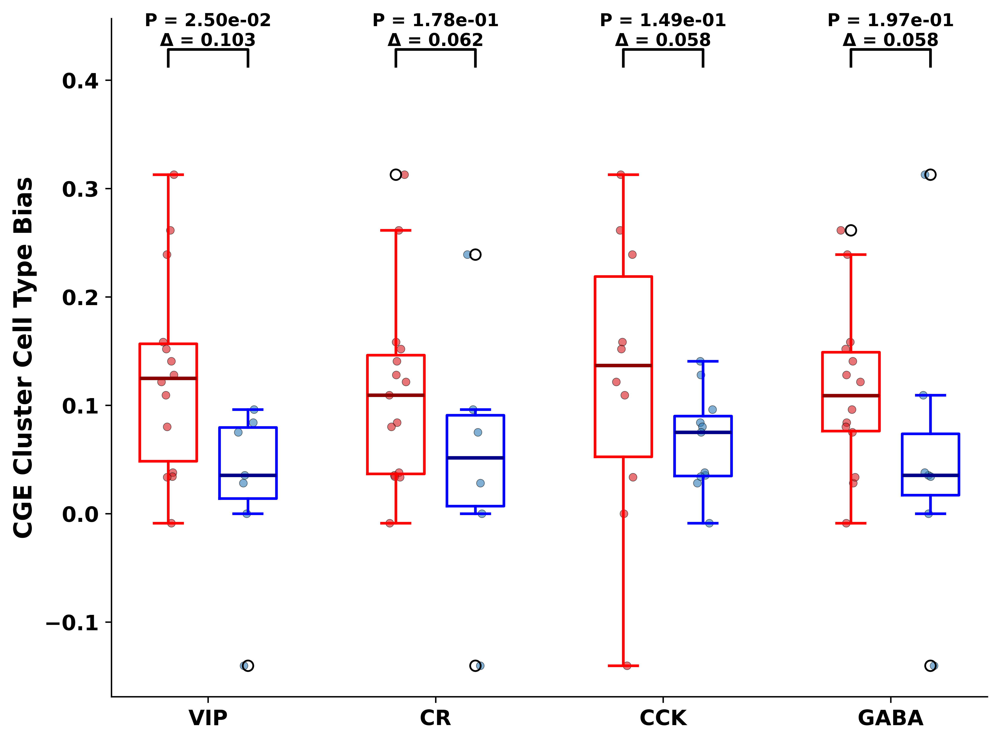

In [204]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

cutoff = 1.0

# Sample data
VIP1 = [tmpdf2[tmpdf2["VIP"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CR"] > cutoff]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["CCK"] > 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] > 0.7]["EFFECT_22q.11"],
        ]

VIP2 = [tmpdf2[tmpdf2["VIP"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CR"] < cutoff]["EFFECT_22q.11"], 
        tmpdf2[tmpdf2["CCK"] < 20]["EFFECT_22q.11"],
        tmpdf2[tmpdf2["GABA"] < 0.7]["EFFECT_22q.11"],
        ]

# Labels
ticks = ['VIP', 'CR', 'CCK', 'GABA']

# Create the figure with enhanced DPI for publication quality
plt.figure(dpi=600, figsize=(8, 6))

# Boxplot for VIP+ and VIP- groups with specific properties
summer_rain_plot = plt.boxplot(VIP1, 
                               positions=np.array(np.arange(len(VIP1)))*2.0-0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="red", linewidth=1.5),
                               medianprops=dict(color="darkred", linewidth=2),
                               whiskerprops=dict(color="red", linewidth=1.5),
                               capprops=dict(color="red", linewidth=1.5))

winter_rain_plot = plt.boxplot(VIP2, 
                               positions=np.array(np.arange(len(VIP2)))*2.0+0.35, 
                               widths=0.5, patch_artist=False,
                               boxprops=dict(color="blue", linewidth=1.5),
                               medianprops=dict(color="darkblue", linewidth=2),
                               whiskerprops=dict(color="blue", linewidth=1.5),
                               capprops=dict(color="blue", linewidth=1.5))

# Function to define and style boxplot properties
def define_box_properties(plot_name, color_code, label):
    plt.plot([], c=color_code, label=label)
    plt.legend(frameon=False, fontsize=15, loc='upper left')


# Plot individual data points with jitter and transparency
for i in range(len(VIP1)):
    x1 = np.random.normal(i*2.0-0.35, 0.04, size=len(VIP1[i]))  # VIP+ jittered positions
    x2 = np.random.normal(i*2.0+0.35, 0.04, size=len(VIP2[i]))  # VIP- jittered positions
    plt.scatter(x1, VIP1[i], color='#D7191C', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)
    plt.scatter(x2, VIP2[i], color='#2C7BB6', alpha=0.6, s=20, edgecolor='k', linewidth=0.3)

    # Calculate mean difference between groups
    mean_diff = np.mean(VIP1[i]) - np.mean(VIP2[i])
    
    # Adding p-values and mean difference with appropriate placement
    stat, p = mannwhitneyu(VIP1[i], VIP2[i])
    x1, x2 = i*2.0-0.35, i*2.0+0.35  # positions of the boxes
    y, h, col = max(max(VIP1[i]), max(VIP2[i])) + 0.1, max(max(VIP1[i]), max(VIP2[i])) * 0.05, 'k'
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1 + x2) * .5, y + h, f"P = {p:.2e}\nΔ = {mean_diff:.3f}", 
             ha='center', va='bottom', color=col, fontsize=10, fontweight='bold')

# Set x-ticks, labels, and adjust the layout for publication quality
plt.xticks(np.arange(0, len(ticks) * 2, 2), ticks, fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.ylabel("CGE Cluster Cell Type Bias", fontsize=14, fontweight='bold')

# Remove unnecessary spines for a cleaner look
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Adjust layout to prevent clipping and improve overall appearance
plt.tight_layout()

# Show the plot
plt.show()


In [205]:
X22q_Bias.head(2)
X22q_Bias_CGE = X22q_Bias[X22q_Bias["Supercluster"]=="CGE interneuron"] 
for i, row in X22q_Bias_CGE.iterrows():
    X22q_Bias_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
    X22q_Bias_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
    X22q_Bias_CGE.loc[i, "CR_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CALB2"], i]
    X22q_Bias_CGE.loc[i, "GABA_ExpL"] = ExpL.loc[GeneSymbol2Entrez["SLC32A1"], i]
X22q_Bias_CGE.head(2)

/tmp/ipykernel_817769/1664419051.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X22q_Bias_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
/tmp/ipykernel_817769/1664419051.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X22q_Bias_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
/tmp/ipykernel_817769/1664419051.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

,EFFECT,Rank,Class,Supercluster,Subtype,Neurotransmitter,Top three regions,Top three dissections,Number of cells,Neuropeptide auto-annotation,VIP_ExpL,CCK_ExpL,CR_ExpL,GABA_ExpL
281,0.312859,22,NEUR,CGE interneuron,INT-VIP,GABA,"Cerebral cortex: 70.5%, Amygdala: 13.0%, Hippo...","Human Pir: 5.7%, Human MEC: 4.6%, Human M1C: 4.5%",2234.0,CCK CHGA CHGB CRH IGF NAMPT NUCB PNOC SCG UBL ...,4.373322,33.676365,2.556849,0.689346
279,0.261646,39,NEUR,CGE interneuron,INT-VIP,GABA VGLUT3,"Cerebral cortex: 54.6%, Hippocampus: 26.0%, Am...","Human MEC: 5.4%, Human CMN: 5.0%, Human CA4C-D...",7444.0,CCK CHGA CHGB CRH IGF NAMPT NUCB NXPH SCG UBL ...,2.963595,90.443985,1.023106,0.822407


Correlation between Bias and VIP expression: 0.320
P-value: 1.576e-01


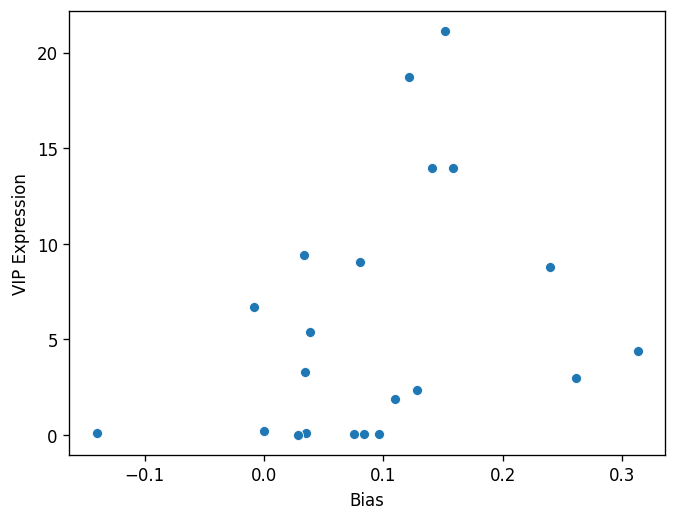

Correlation between Bias and CCK expression: 0.300
P-value: 1.867e-01


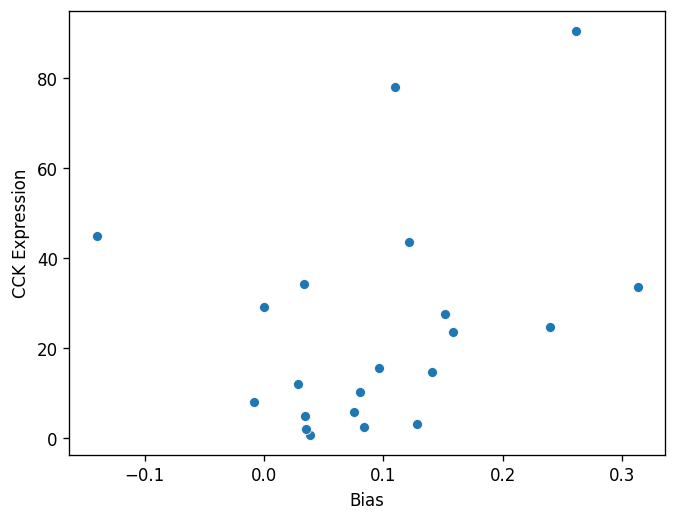

Correlation between Bias and CR expression: 0.012
P-value: 9.580e-01


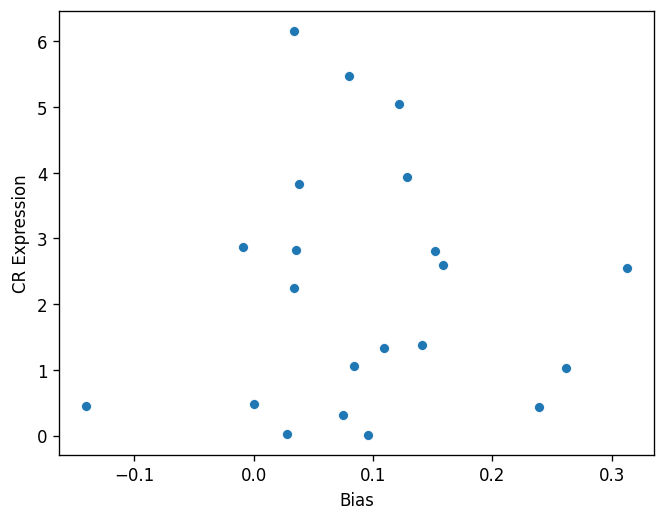

Correlation between Bias and GABA expression: 0.343
P-value: 1.279e-01


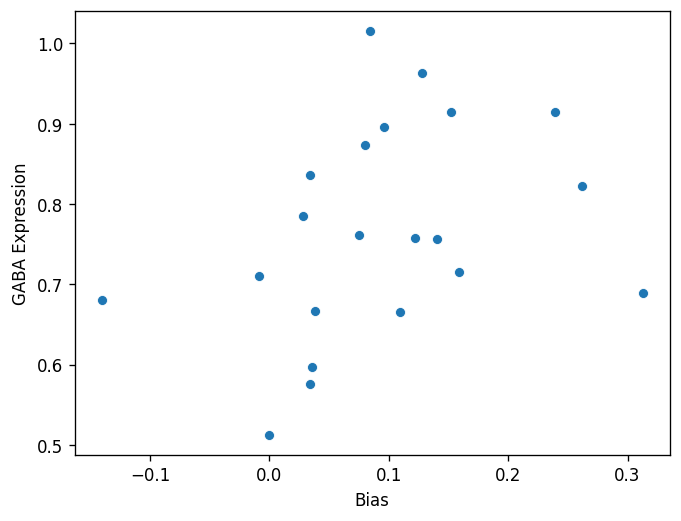

In [206]:
def plot_exp_correlation_Bias(data, exp_col):
    # Plot correlation between SpearmanR and expression level
    plt.figure(dpi=120)
    sns.scatterplot(x="EFFECT", y=exp_col, data=data)
    plt.xlabel("Bias")
    plt.ylabel(f"{exp_col.replace('_ExpL','')} Expression")

    # Calculate correlation and p-value
    from scipy import stats
    corr, pval = stats.pearsonr(data["EFFECT"], data[exp_col])
    print(f"Correlation between Bias and {exp_col.replace('_ExpL','')} expression: {corr:.3f}")
    print(f"P-value: {pval:.3e}")

    plt.show()

# Plot correlations for each expression level
for exp in ["VIP_ExpL", "CCK_ExpL", "CR_ExpL", "GABA_ExpL"]:
    plot_exp_correlation_Bias(X22q_Bias_CGE, exp)

In [207]:
for dat1, dat2 in zip(VIP1, VIP2):
    print(mannwhitneyu(dat1, dat2))

MannwhitneyuResult(statistic=79.0, pvalue=0.024957000343997247)
MannwhitneyuResult(statistic=63.0, pvalue=0.17805543269939555)
MannwhitneyuResult(statistic=76.0, pvalue=0.14886094830032745)
MannwhitneyuResult(statistic=67.0, pvalue=0.19686962504299968)


In [208]:
HumanCT_PBS_DF = pd.read_csv("../dat/Pheno_Bias_vs_IQ/HumanCT.GeneL.csv", index_col=0)

In [209]:
HumanCT_PBS_DF.head(2)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err
276,276,CGE interneuron,-0.483406,0.000161,-0.383471,0.003530,-7.890700,-13.075557,-2.705843,65.417236,0.147050,0.003530,2.586119
267,267,LAMP5-LHX6 and Chandelier,-0.474621,0.000219,-0.388152,0.003117,-8.264822,-13.618636,-2.911008,63.306980,0.150662,0.003117,2.670392


In [210]:
HumanCT_PBS_CGE = HumanCT_PBS_DF[HumanCT_PBS_DF["Supercluster"]=="CGE interneuron"]
HumanCT_PBS_Lamp5_LHX6 = HumanCT_PBS_DF[HumanCT_PBS_DF["Supercluster"]=="LAMP5-LHX6 and Chandelier"]

In [211]:
# Add subtype column if it doesn't exist
if "subtype" not in HumanCT_PBS_Lamp5_LHX6.columns:
    HumanCT_PBS_Lamp5_LHX6["subtype"] = ""

# Set subtype for each row based on CT value
for idx, row in HumanCT_PBS_Lamp5_LHX6.iterrows():
    if row.name in [264, 265, 266]:
        HumanCT_PBS_Lamp5_LHX6.loc[idx, "subtype"] = "Chandelier"
    else:
        HumanCT_PBS_Lamp5_LHX6.loc[idx, "subtype"] = "LAMP5-LHX6"

# Add expression level columns
for i, row in HumanCT_PBS_Lamp5_LHX6.iterrows():
    HumanCT_PBS_Lamp5_LHX6.loc[i, "Pvalb_ExpL"] = ExpL.loc[GeneSymbol2Entrez["PVALB"], i]
    HumanCT_PBS_Lamp5_LHX6.loc[i, "Lamp5_ExpL"] = ExpL.loc[GeneSymbol2Entrez["LAMP5"], i] 
    HumanCT_PBS_Lamp5_LHX6.loc[i, "LHX6_ExpL"] = ExpL.loc[GeneSymbol2Entrez["LHX6"], i]

/tmp/ipykernel_817769/3074081894.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_Lamp5_LHX6["subtype"] = ""
/tmp/ipykernel_817769/3074081894.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_Lamp5_LHX6.loc[i, "Pvalb_ExpL"] = ExpL.loc[GeneSymbol2Entrez["PVALB"], i]
/tmp/ipykernel_817769/3074081894.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [212]:
HumanCT_PBS_Lamp5_LHX6.sort_values("beta", ascending=True)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,subtype,Pvalb_ExpL,Lamp5_ExpL,LHX6_ExpL
267,267,LAMP5-LHX6 and Chandelier,-0.474621,0.000219,-0.388152,0.003117,-8.264822,-13.618636,-2.911008,63.306980,0.150662,0.003117,2.670392,LAMP5-LHX6,0.015717,5.756385,2.682711
269,269,LAMP5-LHX6 and Chandelier,-0.382336,0.003638,-0.351124,0.007969,-7.630912,-13.182739,-2.079085,63.349542,0.123288,0.007969,2.769158,LAMP5-LHX6,0.012757,4.660859,2.438706
270,270,LAMP5-LHX6 and Chandelier,-0.332160,0.012383,-0.322279,0.015421,-7.519756,-13.546046,-1.493467,62.121469,0.103864,0.015421,3.005811,LAMP5-LHX6,0.015155,5.763208,1.504104
268,268,LAMP5-LHX6 and Chandelier,-0.408791,0.001760,-0.347801,0.008625,-7.223281,-12.535764,-1.910798,63.350994,0.120966,0.008625,2.649777,LAMP5-LHX6,0.005725,7.565964,2.275826
266,266,LAMP5-LHX6 and Chandelier,-0.454216,0.000438,-0.349157,0.008352,-7.130584,-12.351728,-1.909440,62.166955,0.121910,0.008352,2.604219,Chandelier,0.553001,0.407459,3.082165
273,273,LAMP5-LHX6 and Chandelier,-0.303312,0.023062,-0.287766,0.031508,-7.051815,-13.454804,-0.648827,62.777484,0.082809,0.031508,3.193703,LAMP5-LHX6,0.004917,7.645052,2.504303
272,272,LAMP5-LHX6 and Chandelier,-0.269440,0.044629,-0.285255,0.033089,-6.939792,-13.301510,-0.578074,62.808881,0.081371,0.033089,3.173118,LAMP5-LHX6,0.005102,7.313265,2.206633
271,271,LAMP5-LHX6 and Chandelier,-0.318864,0.016610,-0.300730,0.024315,-6.903487,-12.876577,-0.930397,62.898249,0.090439,0.024315,2.979277,LAMP5-LHX6,0.009889,8.282571,2.416069
265,265,LAMP5-LHX6 and Chandelier,-0.382199,0.003651,-0.306950,0.021389,-6.537659,-12.068083,-1.007234,62.014450,0.094218,0.021389,2.758483,Chandelier,1.013644,0.185133,2.733239
264,264,LAMP5-LHX6 and Chandelier,-0.271901,0.042643,-0.247537,0.065863,-5.078709,-10.502138,0.344721,61.505556,0.061275,0.065863,2.705115,Chandelier,2.757685,0.031939,1.419853


In [213]:
for i, row in HumanCT_PBS_CGE.iterrows():
    HumanCT_PBS_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
    HumanCT_PBS_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
    HumanCT_PBS_CGE.loc[i, "CR_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CALB2"], i]
    HumanCT_PBS_CGE.loc[i, "M2R_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CHRM2"], i]
    HumanCT_PBS_CGE.loc[i, "NPY_ExpL"] = ExpL.loc[GeneSymbol2Entrez["NPY"], i]
    HumanCT_PBS_CGE.loc[i, "GABA_ExpL"] = ExpL.loc[GeneSymbol2Entrez["SLC32A1"], i]

    # HumanCT_PBS_CGE.loc[i, "VIP_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["VIP"], i]
    # HumanCT_PBS_CGE.loc[i, "CCK_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CCK"], i]
    # HumanCT_PBS_CGE.loc[i, "CR_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CALB2"], i]
    # HumanCT_PBS_CGE.loc[i, "M2R_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["CHRM2"], i]
    # HumanCT_PBS_CGE.loc[i, "NPY_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["NPY"], i]
    # HumanCT_PBS_CGE.loc[i, "GABA_Bias"] = CT_Z2_MAT_HC.loc[GeneSymbol2Entrez["SLC32A1"], i]

    HumanCT_PBS_CGE.loc[i, "TotalUMI"] = Anno.loc[i, "Total UMI"]

/tmp/ipykernel_817769/3711708973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_CGE.loc[i, "VIP_ExpL"] = ExpL.loc[GeneSymbol2Entrez["VIP"], i]
/tmp/ipykernel_817769/3711708973.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HumanCT_PBS_CGE.loc[i, "CCK_ExpL"] = ExpL.loc[GeneSymbol2Entrez["CCK"], i]
/tmp/ipykernel_817769/3711708973.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

In [214]:
HumanCT_PBS_CGE.sort_values("beta", ascending=True)

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
295,295,CGE interneuron,-0.377516,0.004127,-0.383056,0.003569,-8.918079,-14.785443,-3.050715,62.398727,0.146732,0.003569,2.926542,18.733238,43.597927,5.052621,0.123730,0.093864,0.757619,12338.017269
279,279,CGE interneuron,-0.329494,0.013147,-0.371572,0.004808,-8.715744,-14.657160,-2.774327,64.911867,0.138066,0.004808,2.963478,2.963595,90.443985,1.023106,1.815153,0.127217,0.822407,25857.805078
294,294,CGE interneuron,-0.382575,0.003615,-0.405017,0.001959,-8.509932,-13.751209,-3.268655,63.199902,0.164039,0.001959,2.614261,21.116175,27.631880,2.815268,0.267935,0.142493,0.914532,14501.195769
281,281,CGE interneuron,-0.316779,0.017374,-0.315160,0.017987,-8.060151,-14.682130,-1.438172,64.123579,0.099326,0.017987,3.302932,4.373322,33.676365,2.556849,0.360788,0.096688,0.689346,21801.358102
292,292,CGE interneuron,-0.242369,0.071899,-0.323303,0.015079,-7.944026,-14.287827,-1.600224,61.858284,0.104525,0.015079,3.164181,9.425919,34.196720,6.152665,1.357585,0.085859,0.836562,13349.674974
276,276,CGE interneuron,-0.483406,0.000161,-0.383471,0.003530,-7.890700,-13.075557,-2.705843,65.417236,0.147050,0.003530,2.586119,8.779327,24.634615,0.432692,1.314423,1.159135,0.914423,29291.949519
286,286,CGE interneuron,-0.310729,0.019761,-0.321221,0.015781,-7.666463,-13.832913,-1.500014,62.714557,0.103183,0.015781,3.075721,0.045906,5.807270,0.309739,0.050715,0.871065,0.760980,14374.565045
293,293,CGE interneuron,-0.329460,0.013157,-0.331133,0.012672,-7.137622,-12.686736,-1.588508,62.484309,0.109649,0.012672,2.767804,13.958615,23.516962,2.593066,0.483934,0.058396,0.715380,12579.635943
296,296,CGE interneuron,-0.289127,0.030678,-0.332189,0.012374,-7.020385,-12.458854,-1.581917,62.549445,0.110350,0.012374,2.712617,13.942251,14.610457,1.374632,0.481940,0.062999,0.756930,12499.386077
280,280,CGE interneuron,-0.201593,0.136250,-0.286159,0.032512,-6.936334,-13.273007,-0.599661,63.676933,0.081887,0.032512,3.160626,1.858206,78.125930,1.327654,0.387975,0.073051,0.666079,15170.435958


In [215]:
# 
VIP_Pos = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] > 1]
VIP_Neg = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] < 1]
CCK_Cutoff = 30
CR_Cutoff = 2
M2R_Cutoff = 2
CCKBC = VIP_Pos[(VIP_Pos["CCK_ExpL"] > CCK_Cutoff) & (VIP_Pos["CR_ExpL"] < CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]
ISI2 = VIP_Pos[(VIP_Pos["CCK_ExpL"] < CCK_Cutoff) & (VIP_Pos["CR_ExpL"] < CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]
ISI3 = VIP_Pos[(VIP_Pos["CCK_ExpL"] < CCK_Cutoff) & (VIP_Pos["CR_ExpL"] > CR_Cutoff) & (VIP_Pos["M2R_ExpL"] < M2R_Cutoff)]

# Fix: Concatenate index values using np.concatenate instead of + operator
combined_indices = np.concatenate([CCKBC.index.values, ISI2.index.values, ISI3.index.values])
Other = VIP_Pos.loc[~VIP_Pos.index.isin(combined_indices)]

print(len(CCKBC), len(ISI2), len(ISI3), len(Other))

2 2 6 4


/tmp/ipykernel_817769/2063961874.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = plt.boxplot([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']],


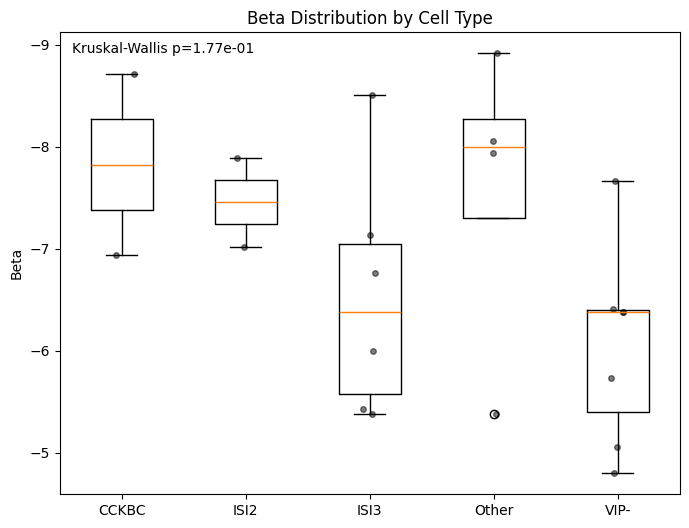

In [216]:
plt.figure(figsize=(8,6))

# Create boxplot
bp = plt.boxplot([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']],
                 labels=['CCKBC', 'ISI2', 'ISI3', 'Other', 'VIP-'])

# Add individual points with jitter
for i, data in enumerate([CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta']], 1):
    x = np.random.normal(i, 0.04, size=len(data))
    plt.plot(x, data, 'o', alpha=0.5, color='black', markersize=4)

plt.ylabel('Beta')
plt.title('Beta Distribution by Cell Type')

# Flip y-axis
plt.gca().invert_yaxis()

# Perform Kruskal-Wallis H-test
h_stat, p_val = stats.kruskal(CCKBC['beta'], ISI2['beta'], ISI3['beta'], Other['beta'], VIP_Neg['beta'])
plt.text(0.02, 0.98, f'Kruskal-Wallis p={p_val:.2e}', 
         transform=plt.gca().transAxes, verticalalignment='top')

plt.show()


In [217]:
ISI2

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
276,276,CGE interneuron,-0.483406,0.000161,-0.383471,0.003530,-7.890700,-13.075557,-2.705843,65.417236,0.14705,0.003530,2.586119,8.779327,24.634615,0.432692,1.314423,1.159135,0.914423,29291.949519
296,296,CGE interneuron,-0.289127,0.030678,-0.332189,0.012374,-7.020385,-12.458854,-1.581917,62.549445,0.11035,0.012374,2.712617,13.942251,14.610457,1.374632,0.481940,0.062999,0.756930,12499.386077


In [218]:
ISI3

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
294,294,CGE interneuron,-0.382575,0.003615,-0.405017,0.001959,-8.509932,-13.751209,-3.268655,63.199902,0.164039,0.001959,2.614261,21.116175,27.631880,2.815268,0.267935,0.142493,0.914532,14501.195769
293,293,CGE interneuron,-0.329460,0.013157,-0.331133,0.012672,-7.137622,-12.686736,-1.588508,62.484309,0.109649,0.012672,2.767804,13.958615,23.516962,2.593066,0.483934,0.058396,0.715380,12579.635943
285,285,CGE interneuron,-0.293605,0.028075,-0.298656,0.025363,-6.759899,-12.653404,-0.866394,63.434401,0.089195,0.025363,2.939581,9.062500,10.305887,5.472270,0.840657,0.227176,0.874147,18438.030290
284,284,CGE interneuron,-0.289367,0.030534,-0.282759,0.034725,-6.000612,-11.554224,-0.447000,63.114786,0.079953,0.034725,2.770048,5.386541,0.769239,3.823691,1.099023,0.084093,0.667362,14202.826765
291,291,CGE interneuron,-0.163790,0.227736,-0.257518,0.055355,-5.432285,-10.993455,0.128884,62.595169,0.066316,0.055355,2.773818,2.343056,3.050735,3.933824,1.167892,0.092239,0.963726,17173.119853
289,289,CGE interneuron,-0.137300,0.312937,-0.243920,0.070043,-5.379494,-11.214828,0.455840,61.990661,0.059497,0.070043,2.910566,3.273210,4.826679,2.248709,1.215622,0.055633,0.575946,11952.289055


In [219]:
CCKBC

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
279,279,CGE interneuron,-0.329494,0.013147,-0.371572,0.004808,-8.715744,-14.657160,-2.774327,64.911867,0.138066,0.004808,2.963478,2.963595,90.443985,1.023106,1.815153,0.127217,0.822407,25857.805078
280,280,CGE interneuron,-0.201593,0.136250,-0.286159,0.032512,-6.936334,-13.273007,-0.599661,63.676933,0.081887,0.032512,3.160626,1.858206,78.125930,1.327654,0.387975,0.073051,0.666079,15170.435958


In [220]:
Other

,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
295,295,CGE interneuron,-0.377516,0.004127,-0.383056,0.003569,-8.918079,-14.785443,-3.050715,62.398727,0.146732,0.003569,2.926542,18.733238,43.597927,5.052621,0.123730,0.093864,0.757619,12338.017269
281,281,CGE interneuron,-0.316779,0.017374,-0.315160,0.017987,-8.060151,-14.682130,-1.438172,64.123579,0.099326,0.017987,3.302932,4.373322,33.676365,2.556849,0.360788,0.096688,0.689346,21801.358102
292,292,CGE interneuron,-0.242369,0.071899,-0.323303,0.015079,-7.944026,-14.287827,-1.600224,61.858284,0.104525,0.015079,3.164181,9.425919,34.196720,6.152665,1.357585,0.085859,0.836562,13349.674974
290,290,CGE interneuron,-0.143590,0.291072,-0.258269,0.054623,-5.380938,-10.872378,0.110502,61.921985,0.066703,0.054623,2.739038,6.690440,7.909301,2.871501,3.634750,0.051313,0.710638,12325.803934


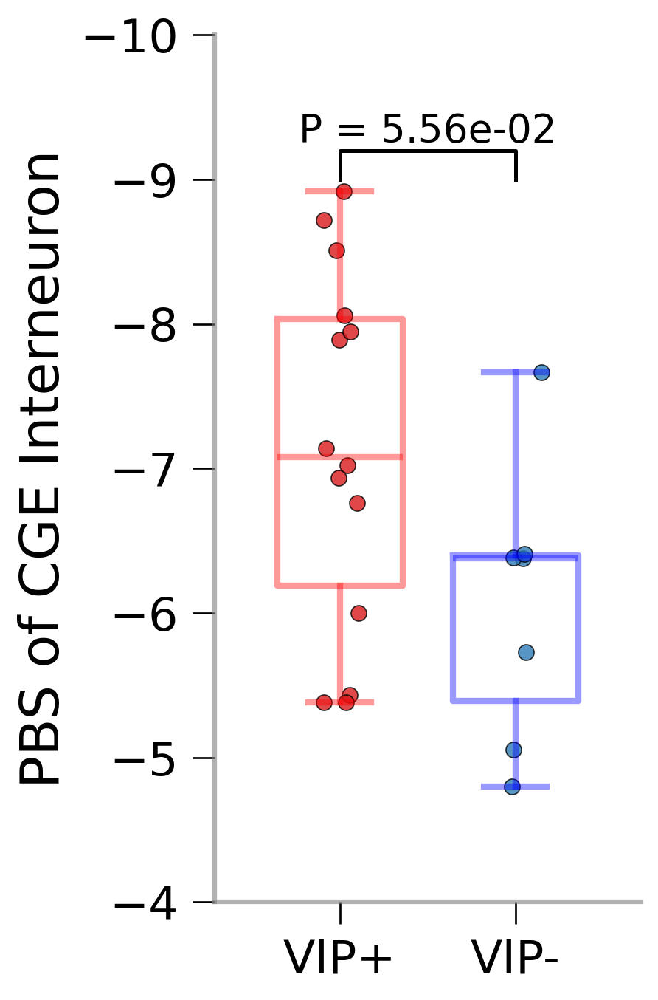

In [370]:
HumanCT_PBS_CGE_VIP_Pos = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] > 1]
HumanCT_PBS_CGE_VIP_Neg = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] < 1]
from scipy import stats

# Perform mannwhitneyu test
t_stat, p_val = stats.mannwhitneyu(HumanCT_PBS_CGE_VIP_Pos['beta'], HumanCT_PBS_CGE_VIP_Neg['beta'])

plt.figure(dpi=240, figsize=(4, 6))
plt.style.use('seaborn-v0_8-paper')

# Create boxplots for VIP+ and VIP- groups
vip_pos_plot = plt.boxplot([HumanCT_PBS_CGE_VIP_Pos['beta']], 
                          positions=[0.65],
                          widths=0.5,
                          patch_artist=False,
                          boxprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          medianprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          whiskerprops=dict(color="red", linewidth=2.5, alpha=0.4),
                          capprops=dict(color="red", linewidth=2.5, alpha=0.4))

vip_neg_plot = plt.boxplot([HumanCT_PBS_CGE_VIP_Neg['beta']], 
                          positions=[1.35],
                          widths=0.5,
                          patch_artist=False,
                          boxprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          medianprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          whiskerprops=dict(color="blue", linewidth=2.5, alpha=0.4),
                          capprops=dict(color="blue", linewidth=2.5, alpha=0.4))

# Add individual points with jitter
x1 = np.random.normal(0.65, 0.04, size=len(HumanCT_PBS_CGE_VIP_Pos['beta']))
x2 = np.random.normal(1.35, 0.04, size=len(HumanCT_PBS_CGE_VIP_Neg['beta']))
plt.scatter(x1, HumanCT_PBS_CGE_VIP_Pos['beta'], color='#D7191C', alpha=0.8, s=40, edgecolor='k', linewidth=0.5)
plt.scatter(x2, HumanCT_PBS_CGE_VIP_Neg['beta'], color='#2C7BB6', alpha=0.8, s=40, edgecolor='k', linewidth=0.5)

# Add p-value bracket
y = min(HumanCT_PBS_CGE_VIP_Pos['beta'].min(), HumanCT_PBS_CGE_VIP_Neg['beta'].min()) - 2
y = -9
h = 0.2
plt.plot([0.65, 0.65, 1.35, 1.35], [y, y-h, y-h, y], lw=1.5, c='k')
plt.text(1, y-h, f"P = {p_val:.2e}", ha='center', va='bottom', color='k', fontsize=16, fontweight='normal')

# Customize plot
plt.xticks([0.65, 1.35], ['VIP+', 'VIP-'], fontsize=19, fontweight='normal')
plt.yticks(fontsize=19, fontweight='normal')
plt.ylabel("PBS of CGE Interneuron", fontsize=22, fontweight='normal')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# make other spines transparent
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)
plt.gca().spines['left'].set_color('grey')
plt.gca().spines['left'].set_alpha(0.6)
plt.gca().spines['bottom'].set_color('grey') 
plt.gca().spines['bottom'].set_alpha(0.6)

# Invert y-axis
plt.gca().invert_yaxis()

plt.tight_layout()
plt.ylim(-4, -10)
plt.show()


In [164]:
HumanCT_PBS_CGE[(HumanCT_PBS_CGE["CCK_ExpL"] < 10 )& (HumanCT_PBS_CGE["VIP_ExpL"] > 1)]


,CT,Supercluster,SpearmanR,SpearmanP,PearsonR,PearsonP,beta,CI_low,CI_high,intercept,r_value,p_value,std_err,VIP_ExpL,CCK_ExpL,CR_ExpL,M2R_ExpL,NPY_ExpL,GABA_ExpL,TotalUMI
284,284,CGE interneuron,-0.289367,0.030534,-0.282759,0.034725,-6.000612,-11.554224,-0.447000,63.114786,0.079953,0.034725,2.770048,5.386541,0.769239,3.823691,1.099023,0.084093,0.667362,14202.826765
291,291,CGE interneuron,-0.163790,0.227736,-0.257518,0.055355,-5.432285,-10.993455,0.128884,62.595169,0.066316,0.055355,2.773818,2.343056,3.050735,3.933824,1.167892,0.092239,0.963726,17173.119853
290,290,CGE interneuron,-0.143590,0.291072,-0.258269,0.054623,-5.380938,-10.872378,0.110502,61.921985,0.066703,0.054623,2.739038,6.690440,7.909301,2.871501,3.634750,0.051313,0.710638,12325.803934
289,289,CGE interneuron,-0.137300,0.312937,-0.243920,0.070043,-5.379494,-11.214828,0.455840,61.990661,0.059497,0.070043,2.910566,3.273210,4.826679,2.248709,1.215622,0.055633,0.575946,11952.289055


In [140]:
CGE_idx = HumanCT_PBS_CGE.index.values
results = []
for entrez in ExpL.index.values:
    Gene_symbol = Entrez2Symbol.get(entrez, "")
    if Gene_symbol is None:
        continue
    Rho = HumanCT_PBS_CGE.loc[CGE_idx, "SpearmanR"]
    Beta = HumanCT_PBS_CGE.loc[CGE_idx, "beta"]
    ExpL_entrez = ExpL.loc[entrez, CGE_idx]
    Rho_Corr,p_rho = pearsonr(Rho, ExpL_entrez)
    Beta_Corr,p_beta = pearsonr(Beta, ExpL_entrez)
    results.append({
        'entrez': entrez,
        'Gene_symbol': Gene_symbol,
        'Rho_Correlation': Rho_Corr,
        'Rho_P_Value': p_rho,
        'Beta_Correlation': Beta_Corr,
        'Beta_P_Value': p_beta
    })
results_df = pd.DataFrame(results)

/home/jw3514/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/jw3514/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/jw3514/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/jw3514/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/home/jw3514/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarni

In [153]:
results_df = results_df.sort_values(by="Beta_Correlation", ascending=True)
# reindex with ranking
results_df = results_df.reset_index(drop=True)

In [154]:
results_df.head(100)

,entrez,Gene_symbol,Rho_Correlation,Rho_P_Value,Beta_Correlation,Beta_P_Value
0,79730,NSUN7,-0.777802,0.000033,-0.811590,0.000008
1,9655,SOCS5,-0.696390,0.000454,-0.806261,0.000010
2,875,CBS,-0.683855,0.000630,-0.804042,0.000011
3,25925,ZNF521,-0.553494,0.009243,-0.782154,0.000028
4,10555,AGPAT2,-0.589861,0.004886,-0.774611,0.000038
...,...,...,...,...,...,...
95,55352,COPRS,-0.711635,0.000297,-0.675105,0.000786
96,10567,RABAC1,-0.584241,0.005417,-0.675007,0.000788
97,7434,VIPR2,-0.402695,0.070312,-0.674820,0.000791
98,219287,AMER2,-0.623953,0.002505,-0.673715,0.000813


In [155]:
results_df[results_df["Gene_symbol"] == "VIP"]

,entrez,Gene_symbol,Rho_Correlation,Rho_P_Value,Beta_Correlation,Beta_P_Value
472,7432,VIP,-0.5378,0.011917,-0.581307,0.005713


In [157]:
for gene in results_df.head(100)["Gene_symbol"].values:
    print(gene)

NSUN7
SOCS5
CBS
ZNF521
AGPAT2
MICU1
VSX2
ZBTB21
ELFN2
MKNK2
KCNK10
ZNF292
CLMN
ARHGEF28
DMGDH
S100B
KBTBD11
IKBKB
DHX40
B3GALT6
MAZ
LGALS3
HTRA1
SLC2A1
MAGI1
GPX1
DHCR7
RNF180
BAG5
ATP5F1E
PRXL2C
RMC1
SERPINB8
MMAB
VWCE
GOLGA8T
GAB1
EEF1A2
BMI1
PEMT
RXRA
PDGFA
CCDC168
RNF41
LRRC24
MVK
SUB1
RMI1
HTATSF1
COX17
A1BG
CNTFR
MAP7
H1-4
POLR2I
SEPTIN11
HLA-DRB1
GTPBP1
EVPLL
CFAP300
FAM174C
PCP4
PTPRN
ST8SIA5
LPCAT2
TDRD9
BCR
PPP1R15A
PSPN
C9orf64
EVA1C
BEND7
PCBD1
RAB5C
TCF15
CD47
HNRNPK
SSR4
PROP1
NIBAN2
SULF2
ENKD1
NPC1
MAL
CDV3
KCNH6
MAPK8IP1
BRD3
FBLL1
HMG20B
G6PC3
PSORS1C1
SEPTIN10
SLC35D2
FGF2
COPRS
RABAC1
VIPR2
AMER2
NATD1


### Test

In [48]:
def plot_exp_correlation(data, x_label = "SpearmanR", exp_col="VIP_ExpL"):
    # Plot correlation between SpearmanR and expression level
    plt.figure(dpi=120)
    sns.scatterplot(x=x_label, y=exp_col, data=data)
    
    # Add linear regression line
    sns.regplot(x=x_label, y=exp_col, data=data, scatter=False, color='red')
    
    plt.xlabel(x_label)
    plt.ylabel(f"{exp_col.replace('_ExpL','')} Expression")

    # Calculate correlation and p-value
    from scipy import stats
    corr, pval = stats.pearsonr(data[x_label], data[exp_col])
    
    # Add correlation annotation to plot
    plt.text(0.05, 0.95, f'r = {corr:.3f}\np = {pval:.2e}', 
             transform=plt.gca().transAxes,
             verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    print(f"Correlation between SpearmanR and {exp_col.replace('_ExpL','')} expression: {corr:.3f}")
    print(f"P-value: {pval:.3e}")

    plt.show()


Correlation between VIP expression and Total UMI: -0.126
P-value: 5.872e-01


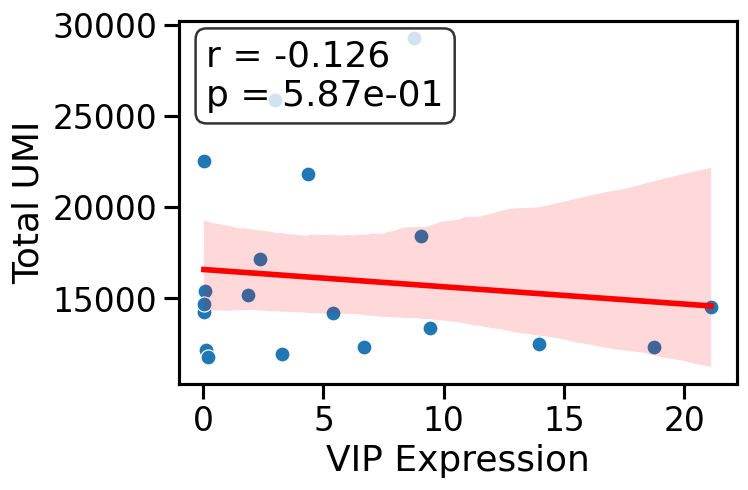

In [56]:
# Calculate correlation between VIP expression and total UMI count
corr, pval = stats.pearsonr(HumanCT_PBS_CGE["VIP_ExpL"], HumanCT_PBS_CGE["TotalUMI"])

# Create scatter plot
plt.figure(dpi=120)
sns.scatterplot(data=HumanCT_PBS_CGE, x="VIP_ExpL", y="TotalUMI")
sns.regplot(data=HumanCT_PBS_CGE, x="VIP_ExpL", y="TotalUMI", scatter=False, color='red')

plt.xlabel("VIP Expression")
plt.ylabel("Total UMI")

# Add correlation annotation
plt.text(0.05, 0.95, f'r = {corr:.3f}\np = {pval:.2e}', 
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

print(f"Correlation between VIP expression and Total UMI: {corr:.3f}")
print(f"P-value: {pval:.3e}")

plt.show()

Linear regression results:
R² score: 0.722

Coefficients and p-values:
TotalUMI: -1.36e-05 (p = 1.978e-11)
VIP_ExpL: -0.010 (p = 4.732e-05)
Intercept: 0.010


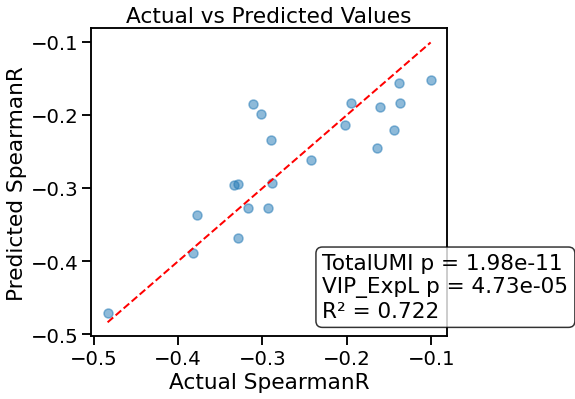

In [66]:
# Fit linear model of SpearmanR with TotalUMI and VIP_ExpL
from sklearn.linear_model import LinearRegression
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare X and y data
X = HumanCT_PBS_CGE[['TotalUMI', 'VIP_ExpL']]
y = HumanCT_PBS_CGE['SpearmanR']

# Fit linear model
model = LinearRegression()
model.fit(X, y)

# Calculate p-values
n = len(y)
p = 2  # number of predictors
mse = np.sum((y - model.predict(X))**2) / (n-p-1)
var_b = mse * np.linalg.inv(X.T @ X).diagonal()
sd_b = np.sqrt(var_b)
t_stat = model.coef_ / sd_b
p_values = 2 * (1 - stats.t.cdf(np.abs(t_stat), n-p-1))

# Print results
print("Linear regression results:")
print(f"R² score: {model.score(X, y):.3f}")
print("\nCoefficients and p-values:")
print(f"TotalUMI: {model.coef_[0]:.2e} (p = {p_values[0]:.3e})")
print(f"VIP_ExpL: {model.coef_[1]:.3f} (p = {p_values[1]:.3e})")
print(f"Intercept: {model.intercept_:.3f}")

# Create visualization
fig, ax = plt.subplots(figsize=(8, 6))

# Plot actual vs predicted values
y_pred = model.predict(X)
ax.scatter(y, y_pred, alpha=0.5)
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
ax.set_xlabel('Actual SpearmanR')
ax.set_ylabel('Predicted SpearmanR')
ax.set_title('Actual vs Predicted Values')

# Add coefficient p-values and R² annotation
text = f'TotalUMI p = {p_values[0]:.2e}\nVIP_ExpL p = {p_values[1]:.2e}\nR² = {model.score(X, y):.3f}'
ax.text(0.65, 0.05, text,
         transform=ax.transAxes,
         verticalalignment='bottom',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Remove ax2 since we don't want residual plot


plt.tight_layout()
plt.show()

Linear regression results:
R² score: 0.570

Coefficients and p-values:
TotalUMI: -1.24e-04 (p = 8.217e-08)
VIP_ExpL: -0.124 (p = 3.283e-04)
Intercept: -4.068


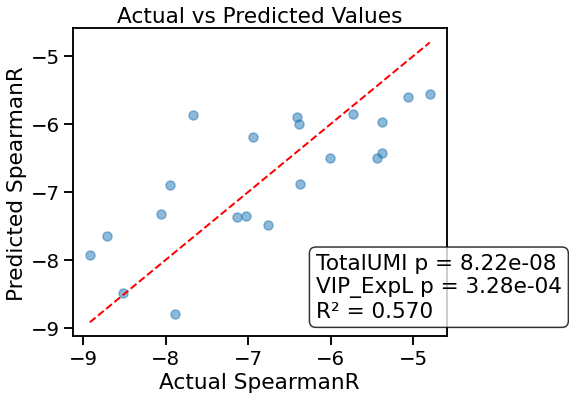

In [67]:
# Fit linear model of SpearmanR with TotalUMI and VIP_ExpL
from sklearn.linear_model import LinearRegression
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare X and y data
X = HumanCT_PBS_CGE[['TotalUMI', 'VIP_ExpL']]
y = HumanCT_PBS_CGE['beta']

# Fit linear model
model = LinearRegression()
model.fit(X, y)

# Calculate p-values
n = len(y)
p = 2  # number of predictors
mse = np.sum((y - model.predict(X))**2) / (n-p-1)
var_b = mse * np.linalg.inv(X.T @ X).diagonal()
sd_b = np.sqrt(var_b)
t_stat = model.coef_ / sd_b
p_values = 2 * (1 - stats.t.cdf(np.abs(t_stat), n-p-1))

# Print results
print("Linear regression results:")
print(f"R² score: {model.score(X, y):.3f}")
print("\nCoefficients and p-values:")
print(f"TotalUMI: {model.coef_[0]:.2e} (p = {p_values[0]:.3e})")
print(f"VIP_ExpL: {model.coef_[1]:.3f} (p = {p_values[1]:.3e})")
print(f"Intercept: {model.intercept_:.3f}")

# Create visualization
fig, ax = plt.subplots(figsize=(8, 6))

# Plot actual vs predicted values
y_pred = model.predict(X)
ax.scatter(y, y_pred, alpha=0.5)
ax.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
ax.set_xlabel('Actual SpearmanR')
ax.set_ylabel('Predicted SpearmanR')
ax.set_title('Actual vs Predicted Values')

# Add coefficient p-values and R² annotation
text = f'TotalUMI p = {p_values[0]:.2e}\nVIP_ExpL p = {p_values[1]:.2e}\nR² = {model.score(X, y):.3f}'
ax.text(0.65, 0.05, text,
         transform=ax.transAxes,
         verticalalignment='bottom',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Remove ax2 since we don't want residual plot


plt.tight_layout()
plt.show()

Correlation between SpearmanR and VIP expression: -0.538
P-value: 1.192e-02


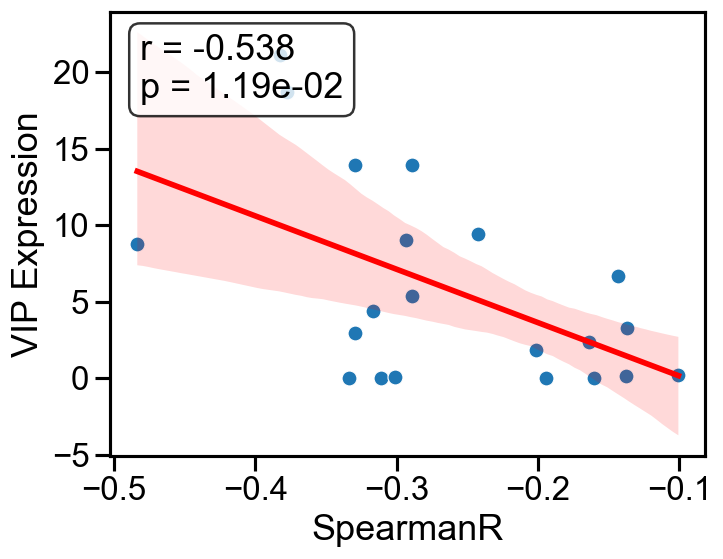

Correlation between SpearmanR and CCK expression: -0.236
P-value: 3.026e-01


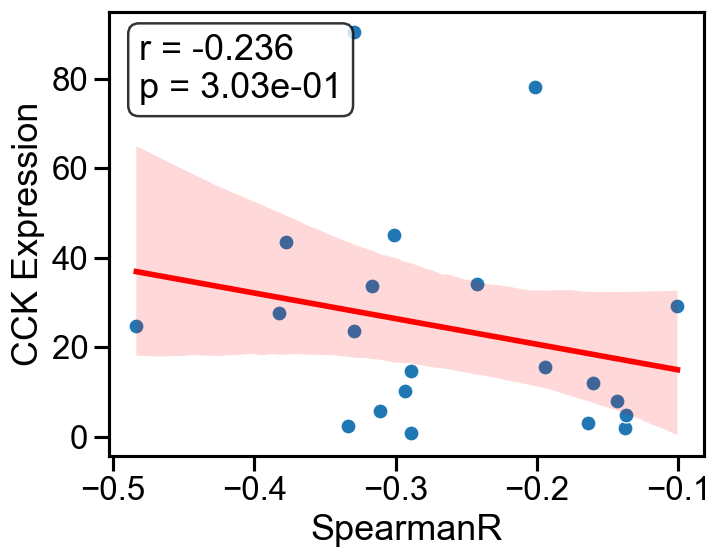

Correlation between SpearmanR and CR expression: -0.041
P-value: 8.611e-01


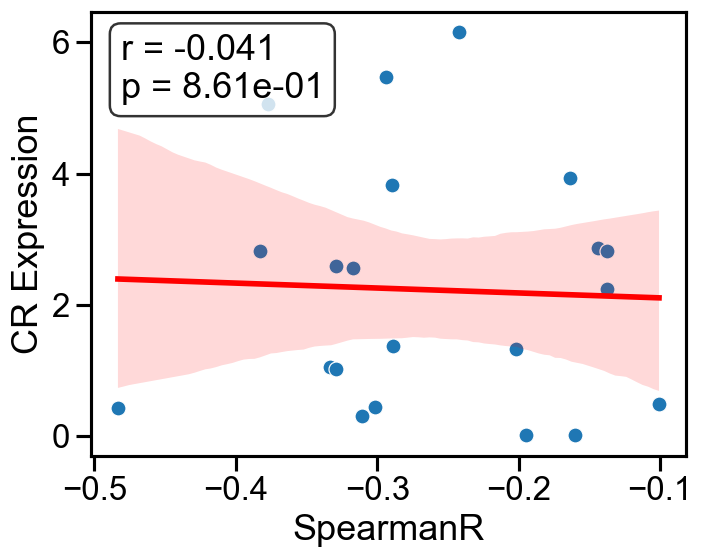

Correlation between SpearmanR and NPY expression: -0.533
P-value: 1.275e-02


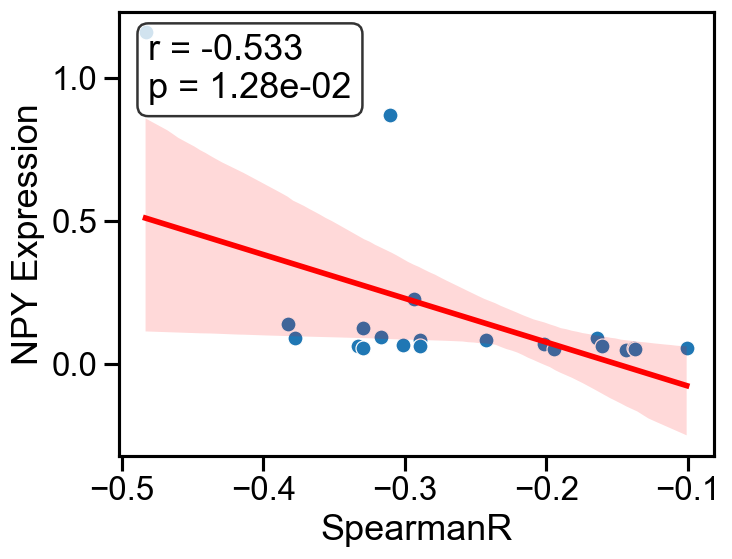

Correlation between SpearmanR and M2R expression: -0.030
P-value: 8.962e-01


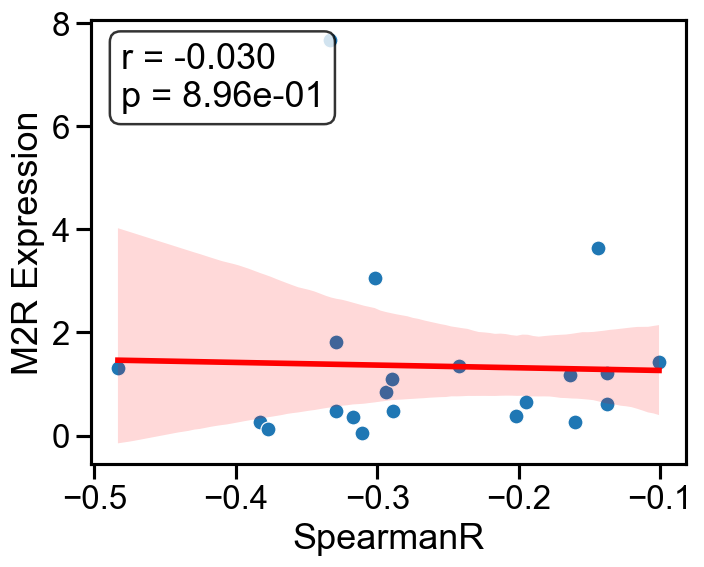

Correlation between SpearmanR and TotalUMI expression: -0.585
P-value: 5.354e-03


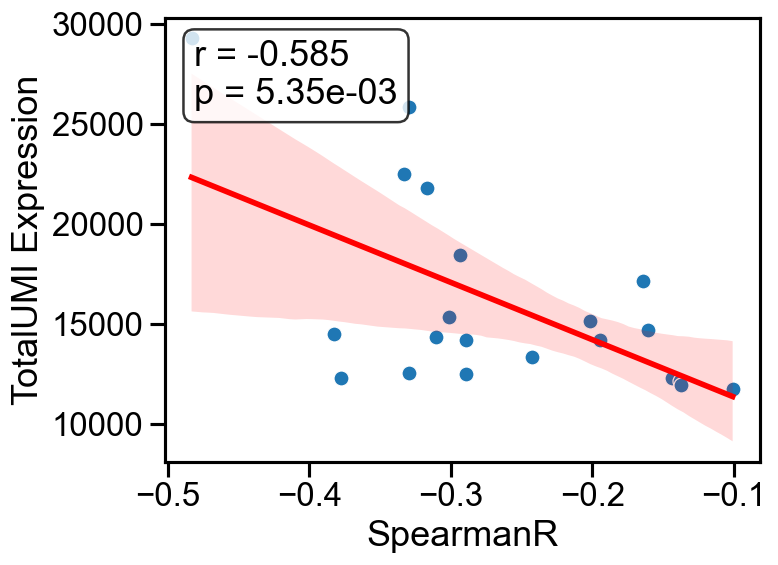

In [179]:

# Plot correlations for each expression level
for exp in ["VIP_ExpL", "CCK_ExpL", "CR_ExpL", "NPY_ExpL", "M2R_ExpL", "TotalUMI"]:
    plot_exp_correlation(HumanCT_PBS_CGE, "SpearmanR", exp)


Correlation between SpearmanR and VIP_Bias expression: -0.162
P-value: 4.823e-01


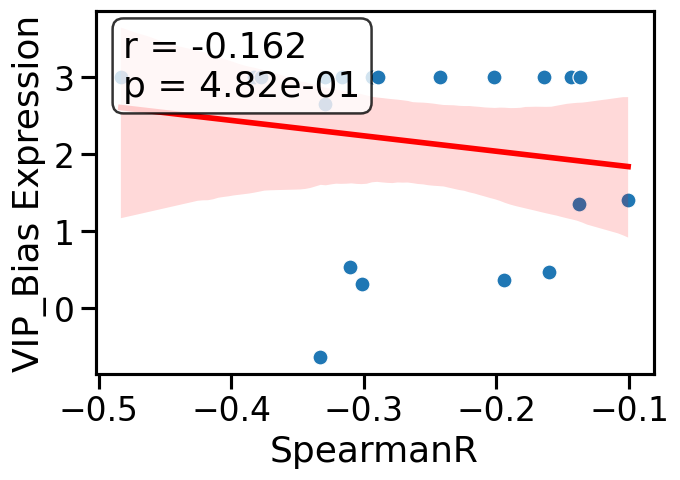

Correlation between SpearmanR and CCK_Bias expression: -0.095
P-value: 6.805e-01


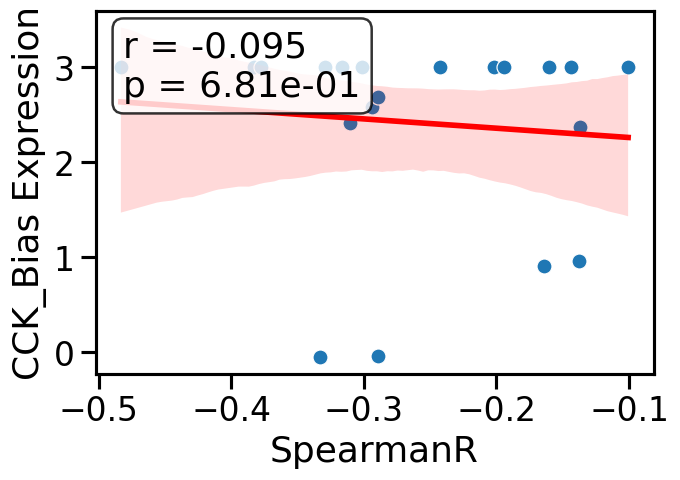

Correlation between SpearmanR and CR_Bias expression: 0.220
P-value: 3.369e-01


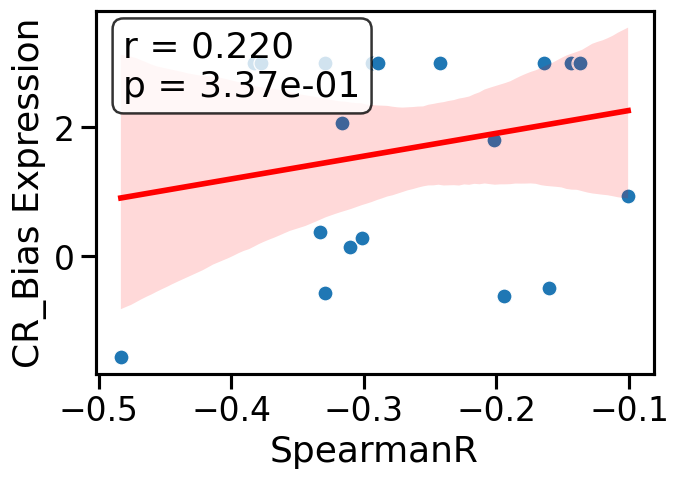

Correlation between SpearmanR and NPY_Bias expression: 0.218
P-value: 3.428e-01


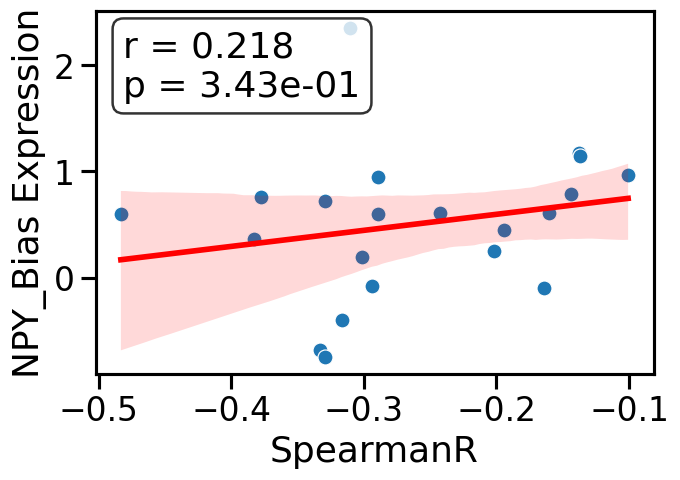

Correlation between SpearmanR and GABA_Bias expression: 0.395
P-value: 7.622e-02


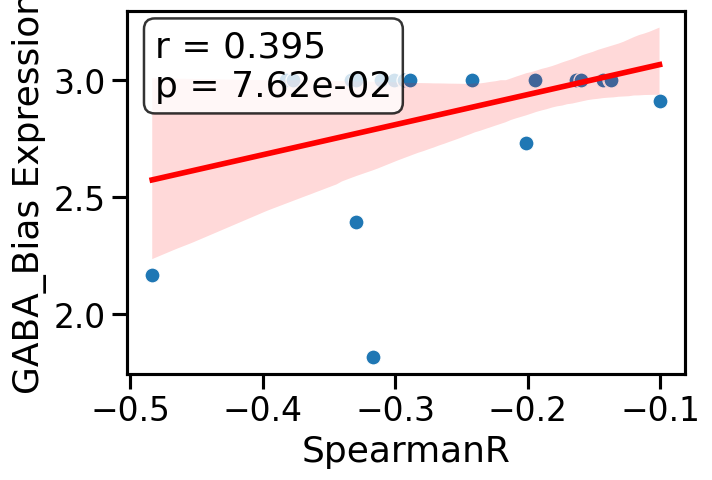

In [50]:
# Plot correlations for each expression level
for exp in ["VIP_Bias", "CCK_Bias", "CR_Bias", "NPY_Bias", "GABA_Bias"]:
    plot_exp_correlation(HumanCT_PBS_CGE, "SpearmanR", exp)


In [37]:



for exp in ["VIP_ExpL", "CCK_ExpL", "CR_ExpL", "NPY_ExpL", "GABA_ExpL"]:
    plot_exp_correlation(HumanCT_PBS_CGE, "beta", exp)


NameError: name 'plot_exp_correlation' is not defined

In [38]:
# Split data into VIP positive and negative groups
VIP_Pos_dat = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] > 1.0]
VIP_Neg_dat = HumanCT_PBS_CGE[HumanCT_PBS_CGE["VIP_ExpL"] < 1.0]

# Create figure
plt.figure(figsize=(8,6))

# Create boxplot data
data = [VIP_Pos_dat["SpearmanR"], VIP_Neg_dat["SpearmanR"]]
labels = ["VIP+", "VIP-"]
print(mannwhitneyu(VIP_Pos_dat["SpearmanR"], VIP_Neg_dat["SpearmanR"]))
# Generate boxplot
plt.boxplot(data, labels=labels)
plt.ylabel("EFFECT")
plt.title("Effect Size Distribution by VIP Expression")

plt.show()


ValueError: `x` and `y` must be of nonzero size.

<Figure size 576x432 with 0 Axes>

### Sup Figures


In [230]:
ExpMat = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/gene_exp_avg2time.csv", index_col=0)
LogExpMat = np.log2(ExpMat+1)
qnLogExpMat = quantileNormalize(LogExpMat)
Meta = pd.read_csv("/home/jw3514/Work/BrainDisorders/data/expression/brainspan/gene_matrix/rows_metadata.csv", index_col=0)
Meta = Meta[~Meta["entrez_id"].isna()]
Meta["entrez_id"] = [int(x) for x in Meta["entrez_id"].values]

Time = ['mean_2A', 'mean_2B', 'mean_3A', 'mean_3B', 'mean_4', 'mean_5',
       'mean_6', 'mean_7', 'mean_8', 'mean_9', 'mean_10', 'mean_11']

In [231]:
ASD_GW_top60 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top60.txt")
ASD_GW_top200 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top200.txt")
ASD_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top500.txt")
ASD_GW_top1000 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.ASD.top1000.txt")

SCZ_GW_top60 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top60.txt")
SCZ_GW_top200 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top200.txt")
SCZ_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top500.txt")
SCZ_GW_top1000 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.SCZ.top1000.txt")

X22q_GW = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.22q.11.46.txt")
BP_GW_top500 = Fil2Dict("../../UNIMED/dat/Genetics/GeneWeights/Rare/GW.BP.top500.txt")

In [232]:
ASD_Genes = list(ASD_GW_top500.keys())[:60]
SCZ_Genes = list(SCZ_GW_top500.keys())[:60]
BP_Genes = list(BP_GW_top500.keys())[:60]
#DDD_Genes = 
X22q_Genes = list(X22q_GW.keys())

In [233]:
ASD_Idx = Meta[Meta["entrez_id"].isin(ASD_Genes)].index
ASD_Dat = qnLogExpMat.loc[ASD_Idx, Time]

SCZ_Idx = Meta[Meta["entrez_id"].isin(SCZ_Genes)].index
SCZ_Dat = qnLogExpMat.loc[SCZ_Idx, Time]

BP_Idx = Meta[Meta["entrez_id"].isin(BP_Genes)].index
BP_Dat = qnLogExpMat.loc[BP_Idx, Time]

#DDD_Idx = Meta[Meta["entrez_id"].isin(DDD_Genes)].index
#DDD_Dat = qnLogExpMat.loc[DDD_Idx, Time]

X22q_Idx = Meta[Meta["entrez_id"].isin(X22q_Genes)].index
X22q_Dat = qnLogExpMat.loc[X22q_Idx, Time]

ALL_Dat = qnLogExpMat.loc[:, Time]

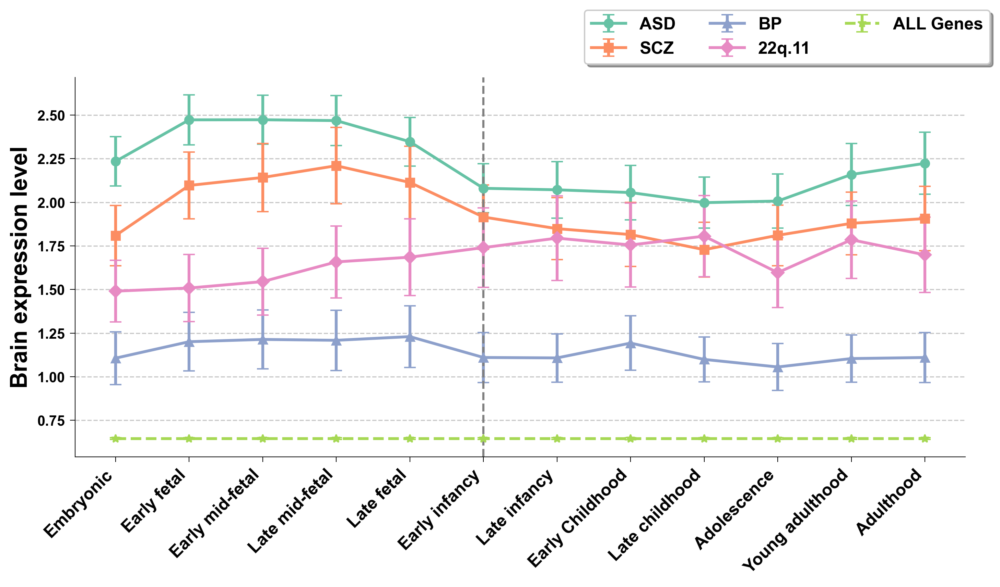

In [234]:
import matplotlib.pyplot as plt
import math
import seaborn as sns

# Create a color palette
palette = sns.color_palette("Set2", 5)

# Create the figure and axis
fig, ax = plt.subplots(dpi=300, figsize=(10, 6))

# Plotting the data with error bars
ax.errorbar(x=ASD_Dat.columns.values,
            y=ASD_Dat.mean(axis=0), 
            yerr=ASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD", color=palette[0], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=SCZ_Dat.columns.values,
            y=SCZ_Dat.mean(axis=0), 
            yerr=SCZ_Dat.std(axis=0)/math.sqrt(SCZ_Dat.shape[0]), 
            label="SCZ", color=palette[1], marker='s', capsize=4, linewidth=2)

ax.errorbar(x=BP_Dat.columns.values,
            y=BP_Dat.mean(axis=0), 
            yerr=BP_Dat.std(axis=0)/math.sqrt(BP_Dat.shape[0]), 
            label="BP", color=palette[2], marker='^', capsize=4, linewidth=2)

ax.errorbar(x=X22q_Dat.columns.values,
            y=X22q_Dat.mean(axis=0), 
            yerr=X22q_Dat.std(axis=0)/math.sqrt(X22q_Dat.shape[0]), 
            label="22q.11", color=palette[3], marker='D', capsize=4, linewidth=2)

ax.errorbar(x=ALL_Dat.columns.values,
            y=ALL_Dat.mean(axis=0), 
            yerr=ALL_Dat.std(axis=0)/math.sqrt(ALL_Dat.shape[0]), 
            label="ALL Genes", color=palette[4], ls="--", marker='*', capsize=4, linewidth=2)

# Vertical line at x = 5
ax.axvline(x=5, color='grey', ls="--", linewidth=1.5)

# Customizing x-axis ticks
labels = ["Embryonic", "Early fetal", "Early mid-fetal", "Late mid-fetal", "Late fetal", 
          "Early infancy", "Late infancy", "Early Childhood", "Late childhood", "Adolescence",
          "Young adulthood", "Adulthood"]
ax.set_xticks(ASD_Dat.columns.values)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=12)

# Set y-axis label
ax.set_ylabel("Brain expression level", fontsize=16, weight='bold')

# Set y-axis limits
#ax.set_ylim(0.5, 4.5)

# Remove top and right spines
ax.spines[['right', 'top']].set_visible(False)

# Add grid lines
ax.grid(True, which='major', axis='y', linestyle='--', alpha=0.7)

# Move the legend outside the plot
ax.legend(loc="upper center", bbox_to_anchor=(0.8, 1.2), fancybox=True, shadow=True, ncol=3, fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [236]:
HIQ_ASD_Genes = pd.read_csv("../../ASD_Circuits/dat/Unionize_bias/ASD.HIQ.gw.csv", header=None)
HIQ_ASD_Genes = HIQ_ASD_Genes[0].values
LIQ_ASD_Genes = pd.read_csv("../../ASD_Circuits/dat/Unionize_bias/ASD.LIQ.gw.csv", header=None)
LIQ_ASD_Genes = LIQ_ASD_Genes[0].values

HIQASD_Idx = Meta[Meta["entrez_id"].isin(HIQ_ASD_Genes)].index
HIQASD_Dat = qnLogExpMat.loc[HIQASD_Idx, Time]

LIQASD_Idx = Meta[Meta["entrez_id"].isin(LIQ_ASD_Genes)].index
LIQASD_Dat = qnLogExpMat.loc[LIQASD_Idx, Time]

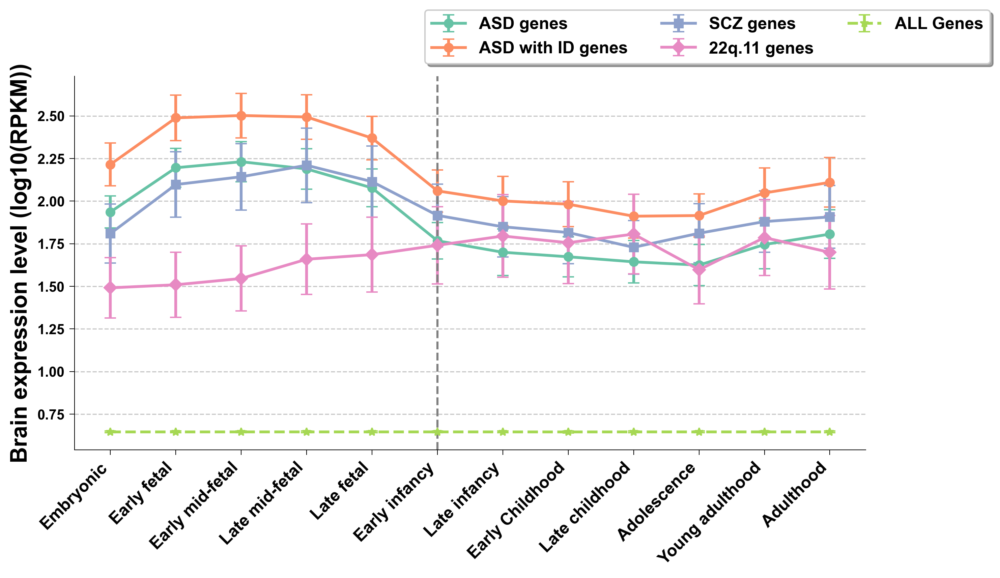

In [237]:
import matplotlib.pyplot as plt
import math
import seaborn as sns

# Create a color palette
palette = sns.color_palette("Set2", 5)

# Create the figure and axis
fig, ax = plt.subplots(dpi=300, figsize=(10, 6))

# Plotting the data with error bars
ax.errorbar(x=HIQASD_Dat.columns.values,
            y=HIQASD_Dat.mean(axis=0), 
            yerr=HIQASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD genes", color=palette[0], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=LIQASD_Dat.columns.values,
            y=LIQASD_Dat.mean(axis=0), 
            yerr=LIQASD_Dat.std(axis=0)/math.sqrt(ASD_Dat.shape[0]), 
            label="ASD with ID genes", color=palette[1], marker='o', capsize=4, linewidth=2)

ax.errorbar(x=SCZ_Dat.columns.values,
            y=SCZ_Dat.mean(axis=0), 
            yerr=SCZ_Dat.std(axis=0)/math.sqrt(SCZ_Dat.shape[0]), 
            label="SCZ genes", color=palette[2], marker='s', capsize=4, linewidth=2)

ax.errorbar(x=X22q_Dat.columns.values,
            y=X22q_Dat.mean(axis=0), 
            yerr=X22q_Dat.std(axis=0)/math.sqrt(X22q_Dat.shape[0]), 
            label="22q.11 genes", color=palette[3], marker='D', capsize=4, linewidth=2)

ax.errorbar(x=ALL_Dat.columns.values,
            y=ALL_Dat.mean(axis=0), 
            yerr=ALL_Dat.std(axis=0)/math.sqrt(ALL_Dat.shape[0]), 
            label="ALL Genes", color=palette[4], ls="--", marker='*', capsize=4, linewidth=2)

# Vertical line at x = 5
ax.axvline(x=5, color='grey', ls="--", linewidth=1.5)

# Customizing x-axis ticks
labels = ["Embryonic", "Early fetal", "Early mid-fetal", "Late mid-fetal", "Late fetal", 
          "Early infancy", "Late infancy", "Early Childhood", "Late childhood", "Adolescence",
          "Young adulthood", "Adulthood"]
ax.set_xticks(ASD_Dat.columns.values)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=12)

# Set y-axis label
ax.set_ylabel("Brain expression level (log10(RPKM))", fontsize=16, weight='bold')

# Set y-axis limits
#ax.set_ylim(0.5, 4.5)

# Remove top and right spines
ax.spines[['right', 'top']].set_visible(False)

# Add grid lines
ax.grid(True, which='major', axis='y', linestyle='--', alpha=0.7)

# Move the legend outside the plot
ax.legend(loc="upper center", bbox_to_anchor=(0.8, 1.2), fancybox=True, shadow=True, ncol=3, fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Other (demonstrate figures)

### Heatmap of gene expression

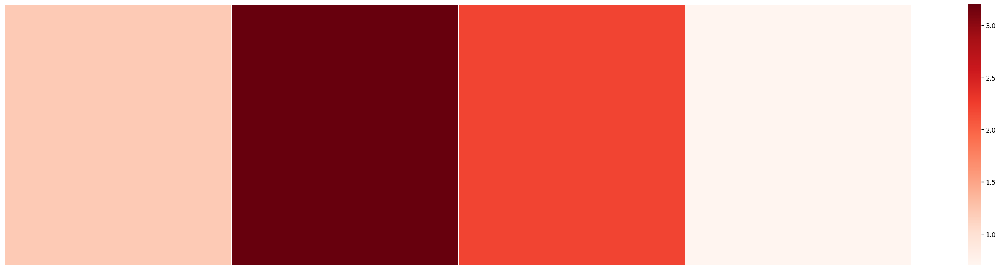

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [1.2, 0.8, 3.1, 4.5],
    'CellType2': [3.2, 2.1, 0.6, 1.5],
    'CellType3': [2.2, 1.5, 0.9, 3.3],
    'CellType4': [0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(25, 6), dpi=120)

# Create a heatmap with Seaborn
sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5)

ax = sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5, cbar=False)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

plt.tight_layout()
plt.show()


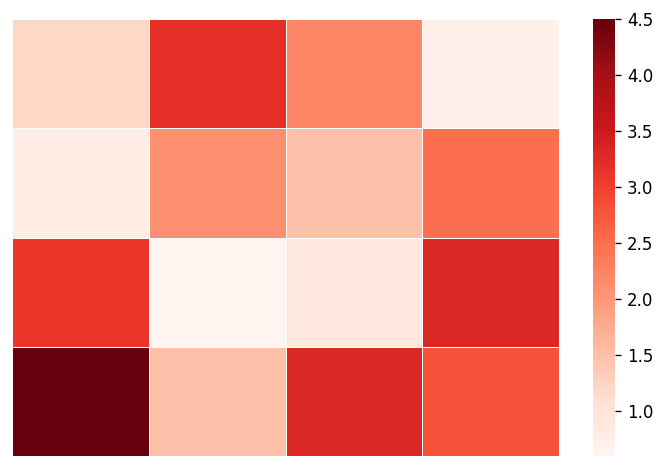

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [1.2, 0.8, 3.1, 4.5],
    'CellType2': [3.2, 2.1, 0.6, 1.5],
    'CellType3': [2.2, 1.5, 0.9, 3.3],
    'CellType4': [0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
#df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(6, 4), dpi=120)

# Create a heatmap with Seaborn
sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5)

ax = sns.heatmap(df, annot=False, cmap="Reds", linewidths=0.5, cbar=False)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

plt.tight_layout()
plt.show()


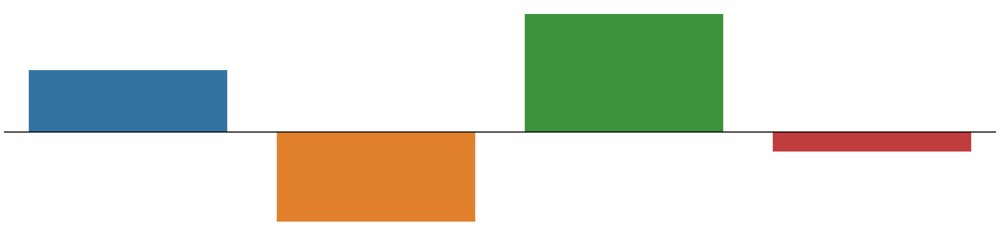

In [274]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [2.2, -0.8, 3.1, -2.5],
    'CellType2': [-3.2, 2.1, 0.6, 1.5],
    'CellType3': [4.2, 1.5, 0.9, 3.3],
    'CellType4': [-0.7, 2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)
df = df.head(1)

# Set up the matplotlib figure
plt.figure(figsize=(25, 6), dpi=120)

# Create a barplot
ax = sns.barplot(data=df)

# Remove the axis labels
ax.set_xticklabels([])
ax.set_yticklabels([])

# Remove axis ticks as well
ax.tick_params(left=False, bottom=False)

# Remove all spines (frame) of the plot
for spine in ax.spines.values():
    spine.set_visible(False)

# Add a horizontal line at y=0
ax.axhline(y=0, color='black', linewidth=2)

# Improve layout and display the plot
plt.tight_layout()
plt.show()


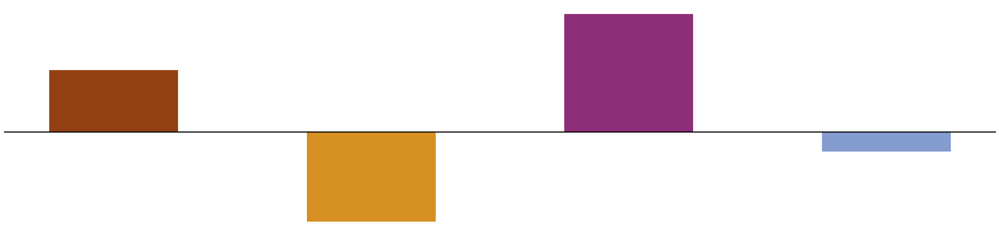

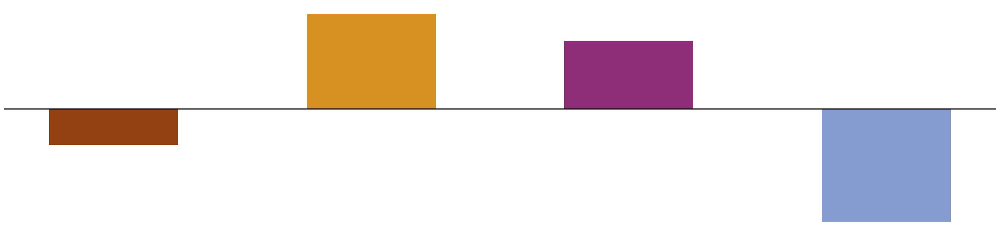

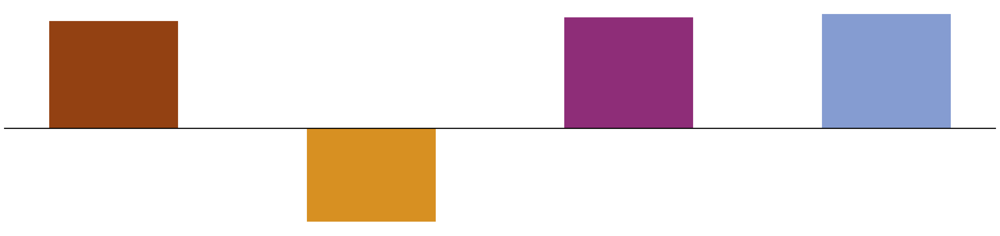

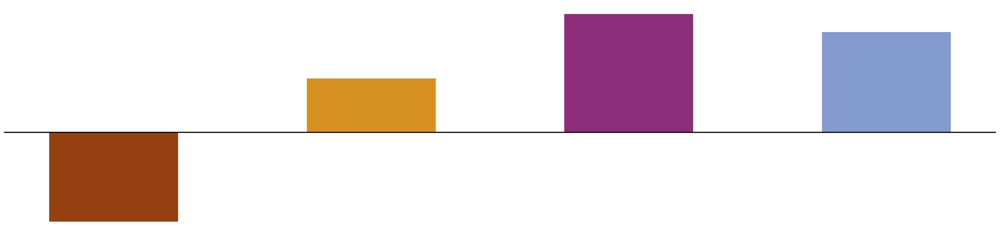

In [293]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data: rows are genes, columns are cell types
data = {
    'CellType1': [2.2, -0.8, 3.1, -2.5],
    'CellType2': [-3.2, 2.1, -2.7, 1.5],
    'CellType3': [4.2, 1.5, 3.2, 3.3],
    'CellType4': [-0.7, -2.5, 3.3, 2.8]
}
genes = ['Gene1', 'Gene2', 'Gene3', 'Gene4']

# Create a DataFrame for gene expression
df = pd.DataFrame(data, index=genes)


# Set up the matplotlib figure

for i, row in df.iterrows():
    df_plot = row
    plt.figure(figsize=(25, 6), dpi=120)

    # Create a barplot with different colors for each bar and thinner width
    colors = ['#934112', '#d79022', '#8e2d78', '#859cd1']  # Define colors
    ax = plt.bar(range(len(df_plot)), df_plot.values, color=colors, width=0.5)

    # Remove the axis labels
    plt.xticks([])
    plt.yticks([])

    # Remove axis ticks as well
    plt.tick_params(left=False, bottom=False)

    # Remove all spines (frame) of the plot
    for spine in plt.gca().spines.values():
        spine.set_visible(False)

    # Add a horizontal line at y=0
    plt.axhline(y=0, color='black', linewidth=2)

    # Improve layout and display the plot
    plt.tight_layout()
    plt.show()


In [281]:
df

,CellType1,CellType2,CellType3,CellType4
Gene1,2.2,-3.2,4.2,-0.7
Gene2,-0.8,2.1,1.5,2.5
Gene3,3.1,2.7,3.2,3.3
Gene4,-2.5,1.5,3.3,2.8


### QQ PLot show genes we using

In [256]:
SCZMutDF = pd.read_csv("../dat3/SCZ.ALLGENE.MutCountModified.csv")
SCZMutDF["Rank"] = SCZMutDF.index.values
SCZMutDF["Entrez"] = [int(x) for x in SCZMutDF["Entrez"].values]
SCZMutDF = SCZMutDF.set_index("Entrez")

In [257]:
SCZMutDF.head(2)

,Gene Symbol,Gene Name,Case PTV,Ctrl PTV,Case mis3,Ctrl mis3,Case mis2,Ctrl mis2,P ca/co (Class 1),P ca/co (Class 2),...,nLGD,nMis3,nMis2,LGD_OR,Mis3_OR,Mis2_OR,LGD_pen,Mis3_pen,Mis2_pen,Rank
Entrez,,,,,,,,,,,,,,,,,,,,,
9739,SETD1A,SET domain containing 1A,15.0,3.0,3.0,4.0,11,10,3.600000e-07,0.000588,...,17.252543,2.003391,8.508477,19.064378,3.211252,4.380156,0.067661,0.014307,0.019408,0
8454,CUL1,Cullin 1,8.0,1.0,2.0,0.0,7,16,1.010000e-05,0.261000,...,10.750848,2.000000,3.013563,21.067577,12.042194,1.889051,0.075481,0.051619,0.008466,1


In [258]:
SCZMutDF.columns.values


array(['Gene Symbol', 'Gene Name', 'Case PTV', 'Ctrl PTV', 'Case mis3',
       'Ctrl mis3', 'Case mis2', 'Ctrl mis2', 'P ca/co (Class 1)',
       'P ca/co (Class 2)', 'P ca/co (comb)', 'De novo PTV',
       'De novo mis3', 'De novo mis2', 'P de novo', 'P meta', 'Q meta',
       'OR (PTV)', 'OR (Class I)', 'OR (Class II)', 'Case syn',
       'Ctrl syn', 'P ca/co (syn)', 'P meta, no gnomAD',
       'Case/Ctrl PTV, no gnomAD', 'Case/Ctrl mis3, no gnomAD',
       'Case/Ctrl mis2, no gnomAD', 'P ca/co (Class I), no gnomAD',
       'P ca/co (Class II), no gnomAD', 'P ca/co (comb), no gnomAD',
       'pLI', 'nLGD', 'nMis3', 'nMis2', 'LGD_OR', 'Mis3_OR', 'Mis2_OR',
       'LGD_pen', 'Mis3_pen', 'Mis2_pen', 'Rank'], dtype=object)

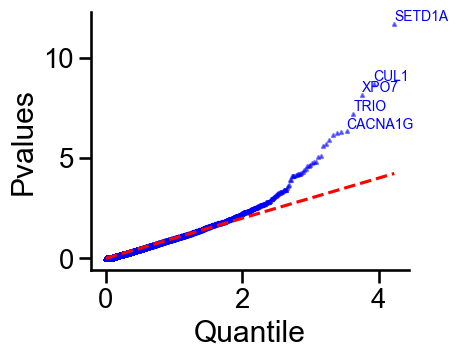

In [278]:
# Create QQ plot for P meta values
import scipy.stats as stats
import numpy as np

# Get P meta values and sort them with corresponding gene symbols
p_values = SCZMutDF['P meta'].values
gene_symbols = SCZMutDF['Gene Symbol'].values

# Remove any NaN values
mask = ~np.isnan(p_values)
p_values = p_values[mask]
gene_symbols = gene_symbols[mask]

# Convert to -log10 scale
p_values = -np.log10(p_values)

# Create array of tuples with p-values and gene symbols
p_value_genes = list(zip(p_values, gene_symbols))

# Sort by p-value while keeping gene symbols aligned
p_value_genes.sort(key=lambda x: x[0])
p_values = np.array([x[0] for x in p_value_genes])
gene_symbols = np.array([x[1] for x in p_value_genes])

# Generate expected values under null hypothesis
n = len(p_values)
expected = -np.log10(np.arange(1, n+1)/(n+1))
expected = np.sort(expected)

# Create QQ plot
plt.figure(figsize=(5,4))

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Check for infinite values before plotting
mask = np.isfinite(expected) & np.isfinite(p_values)
plt.scatter(expected[mask], p_values[mask], alpha=0.5, marker="^", color="blue", s=5)
plt.plot([0, max(expected[mask])], [0, max(expected[mask])], 'r--') # Add diagonal line

# Label top 5 genes
for i in range(min(5, len(p_values))):
    if np.isfinite(expected[-(i+1)]) and np.isfinite(p_values[-(i+1)]):
        plt.text(expected[-(i+1)], p_values[-(i+1)], 
                gene_symbols[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="blue")

plt.xlabel('Quantile')
plt.ylabel('Pvalues')

plt.tight_layout()
plt.show()

In [279]:
Spark_Meta_1stage = pd.read_excel("~/Work/SPARK2020/TabS_DenovoWEST_Stage1.xlsx",
                           skiprows=1, sheet_name="AllGenes")

In [284]:
# Drop rows where pDenovoWEST cannot be converted to float
Spark_Meta_1stage = Spark_Meta_1stage[pd.to_numeric(Spark_Meta_1stage['pDenovoWEST'], errors='coerce').notna()]

In [285]:
Spark_Meta_1stage.head(2)

,GeneID,EntrezID,HGNC,CytoBand,ExACpLI,LoFOvsE,LOEUF,LOEUFbin,SynOvsE,sHet,...,AllExpected,pAllEnrich,MisObserved,MisExpected,pMisEnrich,MisEvents,MisDist,pMisCluster,pMisComb,pDenovoWEST
0,ENSG00000143442,23126,POGZ,1q21.3,1,0.045859,0.119,0,0.97057,0.214955,...,0.306547,0.0,0.396,0.162758,0.1,4,170.7,0.00692,0.00583,0.0
1,ENSG00000169057,4204,MECP2,Xq28,0.69809,0.085755,0.407,1,2.0282,0.088203,...,0.065821,0.0,4.329,0.04961,0.0,13,170.9,0.00197,0.0,0.0


In [286]:
Spark_Meta_1stage.columns.values

array(['GeneID', 'EntrezID', 'HGNC', 'CytoBand', 'ExACpLI', 'LoFOvsE',
       'LOEUF', 'LOEUFbin', 'SynOvsE', 'sHet', 'Arisk', 'forecASD',
       'SFARICategory', 'SFARIScore', 'DDDCategory', 'DDDAllelic',
       'DDDMutCons', 'DDDOrgan', 'AutismMerged_LoF',
       'AutismMerged_LoF_Rate', 'ASC_LoF', 'MSSNG_LoF', 'SSC_LoF',
       'SPARK_LoF', 'Control_LoF', 'AutismMerged_Dmis_REVEL0.5',
       'AutismMerged_Dmis_REVEL0.5_Rate', 'ASC_Dmis_REVEL0.5',
       'MSSNG_Dmis_REVEL0.5', 'SSC_Dmis_REVEL0.5', 'SPARK_Dmis_REVEL0.5',
       'Control_Dmis_REVEL0.5', 'AutismMerged_Bmis_REVEL0.5',
       'AutismMerged_Bmis_REVEL0.5_Rate', 'ASC_Bmis_REVEL0.5',
       'MSSNG_Bmis_REVEL0.5', 'SSC_Bmis_REVEL0.5', 'SPARK_Bmis_REVEL0.5',
       'Control_Bmis_REVEL0.5', 'AllObserved', 'AllExpected',
       'pAllEnrich', 'MisObserved', 'MisExpected', 'pMisEnrich',
       'MisEvents', 'MisDist', 'pMisCluster', 'pMisComb', 'pDenovoWEST'],
      dtype=object)

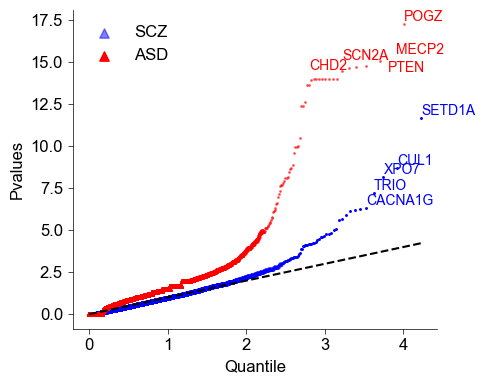

In [347]:
# Create QQ plot for P meta values
import scipy.stats as stats
import numpy as np

# Get P meta values and sort them with corresponding gene symbols
p_values_scz = SCZMutDF['P meta'].values
gene_symbols_scz = SCZMutDF['Gene Symbol'].values

# Remove any NaN values
mask_scz = ~np.isnan(p_values_scz)
p_values_scz = p_values_scz[mask_scz]
gene_symbols_scz = gene_symbols_scz[mask_scz]

# Convert to -log10 scale
p_values_scz = -np.log10(p_values_scz)

# Create array of tuples with p-values and gene symbols
p_value_genes_scz = list(zip(p_values_scz, gene_symbols_scz))

# Sort by p-value while keeping gene symbols aligned
p_value_genes_scz.sort(key=lambda x: x[0])
p_values_scz = np.array([x[0] for x in p_value_genes_scz])
gene_symbols_scz = np.array([x[1] for x in p_value_genes_scz])

# Generate expected values under null hypothesis
n_scz = len(p_values_scz)
expected_scz = -np.log10(np.arange(1, n_scz+1)/(n_scz+1))
expected_scz = np.sort(expected_scz)

# Get P meta values and sort them with corresponding gene symbols
p_values_asd = Spark_Meta_1stage['pDenovoWEST'].astype(float).values  # Convert to float
gene_symbols_asd = Spark_Meta_1stage['HGNC'].values

# Remove any NaN values
mask_asd = ~np.isnan(p_values_asd)
p_values_asd = p_values_asd[mask_asd]
gene_symbols_asd = gene_symbols_asd[mask_asd]

# Convert to -log10 scale
p_values_asd = -np.log10(p_values_asd)

# Create array of tuples with p-values and gene symbols
p_value_genes_asd = list(zip(p_values_asd, gene_symbols_asd))

# Sort by p-value while keeping gene symbols aligned
p_value_genes_asd.sort(key=lambda x: x[0])
p_values_asd = np.array([x[0] for x in p_value_genes_asd])
gene_symbols_asd = np.array([x[1] for x in p_value_genes_asd])

# Generate expected values for ASD
n_asd = len(p_values_asd)
expected_asd = -np.log10(np.arange(1, n_asd+1)/(n_asd+1))
expected_asd = np.sort(expected_asd)

# Create QQ plot
plt.figure(figsize=(5,4))

# Remove top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Plot SCZ data with different alphas
mask_scz_plot = np.isfinite(expected_scz) & np.isfinite(p_values_scz)
plt.scatter(expected_scz[mask_scz_plot][:-60], p_values_scz[mask_scz_plot][:-60], 
           alpha=0.5, marker="^", color="blue", s=5, label='SCZ')
plt.scatter(expected_scz[mask_scz_plot][-60:], p_values_scz[mask_scz_plot][-60:], 
           alpha=1.0, marker=".", color="blue", s=5)

# Plot ASD data with different alphas
mask_asd_plot = np.isfinite(expected_asd) & np.isfinite(p_values_asd)
plt.scatter(expected_asd[mask_asd_plot][:-60], p_values_asd[mask_asd_plot][:-60], 
           alpha=1.0, marker="^", color="red", s=5, label='ASD')
plt.scatter(expected_asd[mask_asd_plot][-60:], p_values_asd[mask_asd_plot][-60:], 
           alpha=0.5, marker=".", color="red", s=5)

# Add diagonal line using max of both datasets
max_expected = max(max(expected_scz[mask_scz_plot]), max(expected_asd[mask_asd_plot]))
plt.plot([0, max_expected], [0, max_expected], 'k--')

# Label top 5 genes for SCZ
for i in range(min(5, len(p_values_scz))):
    if np.isfinite(expected_scz[-(i+1)]) and np.isfinite(p_values_scz[-(i+1)]):
        plt.text(expected_scz[-(i+1)], p_values_scz[-(i+1)], 
                gene_symbols_scz[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="blue")

# Label top 5 genes for ASD with offset positions to avoid overlap
offsets = [(0, 0), (0.2, 0.2), (-0.3, 0.2), (0.4, -0.5), (-0.5, -0.3)]  # x,y offsets
for i in range(min(5, len(p_values_asd))):
    if np.isfinite(expected_asd[-(i+1)]) and np.isfinite(p_values_asd[-(i+1)]):
        x = expected_asd[-(i+1)] + offsets[i][0]
        y = p_values_asd[-(i+1)] + offsets[i][1]
        plt.text(x, y, gene_symbols_asd[-(i+1)],
                fontsize=10, ha='left', va='bottom', color="red")

plt.legend(loc='upper left', frameon=False, markerscale=3)

plt.xlabel('Quantile')
plt.ylabel('Pvalues')

plt.tight_layout()
plt.show()

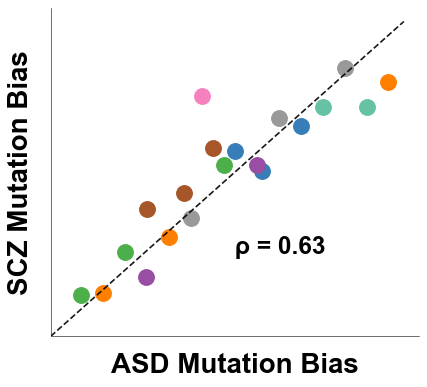

In [350]:
import matplotlib.pyplot as plt
import numpy as np

# Set style
#plt.style.use('seaborn-whitegrid')
plt.rcParams['font.size'] = 12

# Create figure
fig, ax = plt.subplots(figsize=(5.5, 5), dpi=80)

# Generate some example data points along diagonal with some scatter
np.random.seed(42)  # For reproducibility
x = np.linspace(-0.5, 0.5, 15)
y = x + np.random.normal(0, 0.1, 15)  # Add some random noise

# Additional scattered points
x_scatter = np.random.uniform(-0.4, 0.4, 5)
y_scatter = x_scatter + np.random.normal(0, 0.15, 5)

# Combine all points
x_all = np.concatenate([x, x_scatter])
y_all = np.concatenate([y, y_scatter])

# Define colors for different cell types
colors = ['#E41A1C', '#377EB8', '#4DAF4A', '#984EA3', '#FF7F00', '#FFFF33', '#A65628', '#F781BF', '#999999', '#66C2A5']  # Red, Blue, Green, Purple, Orange, Yellow, Brown, Pink, Gray, Teal
cell_types = np.random.choice(len(colors), size=len(x_all))  # Randomly assign cell types

# Create scatter plot with different colors
for i in range(len(colors)):
    mask = cell_types == i
    ax.scatter(x_all[mask], y_all[mask], c=colors[i], alpha=1, s=200, 
              label=f'Cell Type {i+1}')

# Add diagonal reference line
ax.plot([-0.6, 0.55], [-0.6, 0.55], '--', color='black', alpha=0.9)

# Add stats box
stats_text = 'ρ = 0.63'
plt.text(0.0, -0.3, stats_text, fontsize=22, fontweight='bold')

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Customize axes
ax.set_xlabel('ASD Mutation Bias', labelpad=15, fontsize=25, fontweight='bold')
ax.set_ylabel('SCZ Mutation Bias', labelpad=15, fontsize=25, fontweight='bold')
ax.set_xlim(-0.6, 0.6)
ax.set_ylim(-0.6, 0.6)
ax.set_xticks([])
ax.set_yticks([])

# # Add legend
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

In [453]:
res = SCZ_Bias.join(HighIQ_ASD_Bias, how = 'inner', lsuffix="_SCZ", rsuffix="_ASD")


In [454]:
res.head(2)

,EFFECT_SCZ,Rank_SCZ,Class_SCZ,Supercluster_SCZ,Subtype_SCZ,Neurotransmitter_SCZ,Top three regions_SCZ,Top three dissections_SCZ,Number of cells_SCZ,Neuropeptide auto-annotation_SCZ,EFFECT_ASD,Rank_ASD,Class_ASD,Supercluster_ASD,Subtype_ASD,Neurotransmitter_ASD,Top three regions_ASD,Top three dissections_ASD,Number of cells_ASD,Neuropeptide auto-annotation_ASD
136,0.450682,1,NEUR,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 54.6%, Cerebral cortex: 36.2%, Hypot...","Human CoA: 54.6%, Human AON: 28.3%, Human HTHs...",152.0,ADCYAP CBLN CCK CHGA CHGB CRH NAMPT NUCB PYY S...,0.583226,1,NEUR,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 54.6%, Cerebral cortex: 36.2%, Hypot...","Human CoA: 54.6%, Human AON: 28.3%, Human HTHs...",152.0,ADCYAP CBLN CCK CHGA CHGB CRH NAMPT NUCB PYY S...
146,0.411754,2,NEUR,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 65.4%, Cerebral cortex: 33.1%, Hypot...","Human Pir: 22.2%, Human CEN: 19.8%, Human BL: ...",5654.0,ADCYAP CBLN CCK CHGA CHGB NAMPT NUCB SCG UBL V...,0.429989,4,NEUR,Deep-layer intratelencephalic,NaN,VGLUT1 VGLUT2,"Amygdala: 65.4%, Cerebral cortex: 33.1%, Hypot...","Human Pir: 22.2%, Human CEN: 19.8%, Human BL: ...",5654.0,ADCYAP CBLN CCK CHGA CHGB NAMPT NUCB SCG UBL V...


In [468]:
# Create empty lists to store results
superclusters = []
scz_biases = []
asd_biases = []
scz_sems = []
asd_sems = []

# Calculate biases for each supercluster
for supercluster in ALL_CTs:
    dat = res[res["Supercluster_ASD"]==supercluster]
    bias_asd = dat["EFFECT_ASD"].mean()
    bias_scz = dat["EFFECT_SCZ"].mean()
    sem_scz = dat["EFFECT_SCZ"].sem()
    sem_asd = dat["EFFECT_ASD"].sem()
    
    # Append to lists
    superclusters.append(supercluster)
    scz_biases.append(bias_scz)
    asd_biases.append(bias_asd)
    scz_sems.append(sem_scz)
    asd_sems.append(sem_asd)

# Create dataframe
bias_df = pd.DataFrame({
    'Supercluster': superclusters,
    'SCZ_Bias': scz_biases,
    'SCZ_SEM': scz_sems,
    'ASD_Bias': asd_biases,
    'ASD_SEM': asd_sems
})


In [469]:
bias_df

,Supercluster,SCZ_Bias,SCZ_SEM,ASD_Bias,ASD_SEM
0,Amygdala excitatory,0.190660,0.021751,0.251151,0.029637
1,CGE interneuron,0.086897,0.022175,-0.129493,0.034366
2,Cerebellar inhibitory,-0.031849,0.020955,-0.129909,0.050383
3,Deep-layer corticothalamic and 6b,0.048633,0.020241,0.138385,0.027254
4,Deep-layer intratelencephalic,0.185010,0.029674,0.230797,0.041459
5,Deep-layer near-projecting,0.112043,0.020419,0.034250,0.030897
6,Eccentric medium spiny neuron,0.155233,0.021033,0.047121,0.014049
7,Hippocampal CA1-3,0.143197,0.040786,0.130346,0.065487
8,Hippocampal CA4,0.040211,0.048068,0.123935,0.086838
9,Hippocampal dentate gyrus,0.021492,0.055800,-0.041786,0.094609


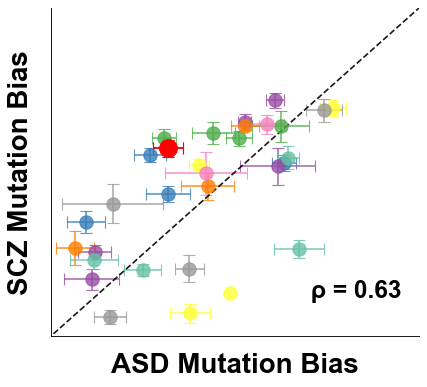

In [472]:
import matplotlib.pyplot as plt
import numpy as np

# Set style
#plt.style.use('seaborn-whitegrid')
plt.rcParams['font.size'] = 12

# Create figure
fig, ax = plt.subplots(figsize=(5.5, 5), dpi=80)

# Combine all points
x_all = bias_df["ASD_Bias"].values
y_all = bias_df["SCZ_Bias"].values
x_err = bias_df["ASD_SEM"].values
y_err = bias_df["SCZ_SEM"].values

# Define colors for different cell types
colors = ['#377EB8', '#4DAF4A', '#984EA3', '#FF7F00', '#FFFF33', '#A65628', '#F781BF', '#999999', '#66C2A5']  # Red, Blue, Green, Purple, Orange, Yellow, Brown, Pink, Gray, Teal
cell_types = np.random.choice(len(colors), size=len(x_all))  # Randomly assign cell types

# Create scatter plot with different colors and error bars
for i in range(len(colors)):
    mask = cell_types == i
    ax.errorbar(x_all[mask], y_all[mask], 
                xerr=x_err[mask], yerr=y_err[mask],
                fmt='o', c=colors[i], alpha=0.8, markersize=12,
                label=f'Cell Type {i+1}', capsize=5)

selected_superclusters = ["CGE interneuron"]
for supercluster in selected_superclusters:
    dat = bias_df[bias_df["Supercluster"]==supercluster]
    ax.errorbar(dat["ASD_Bias"].values, dat["SCZ_Bias"].values,
                xerr=dat["ASD_SEM"].values, yerr=dat["SCZ_SEM"].values,
                fmt='o', c="red", alpha=1, markersize=16, capsize=5)

# Add diagonal reference line
ax.plot([-0.5, 0.5], [-0.5, 0.5], '--', color='black', alpha=0.9)

# # Add x=0 and y=0 lines
# ax.axhline(y=0, color='black', linestyle='--', alpha=0.9)
# ax.axvline(x=0, color='black', linestyle='--', alpha=0.9)

# Add stats box
stats_text = 'ρ = 0.63'
plt.text(0.2, -0.3, stats_text, fontsize=22, fontweight='bold')

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Customize axes
ax.set_xlabel('ASD Mutation Bias', labelpad=15, fontsize=25, fontweight='bold')
ax.set_ylabel('SCZ Mutation Bias', labelpad=15, fontsize=25, fontweight='bold')
ax.set_xlim(-0.4, 0.45)
ax.set_ylim(-0.4, 0.45)
ax.set_xticks([])
ax.set_yticks([])

# # Add legend
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

### Panel 2 A 

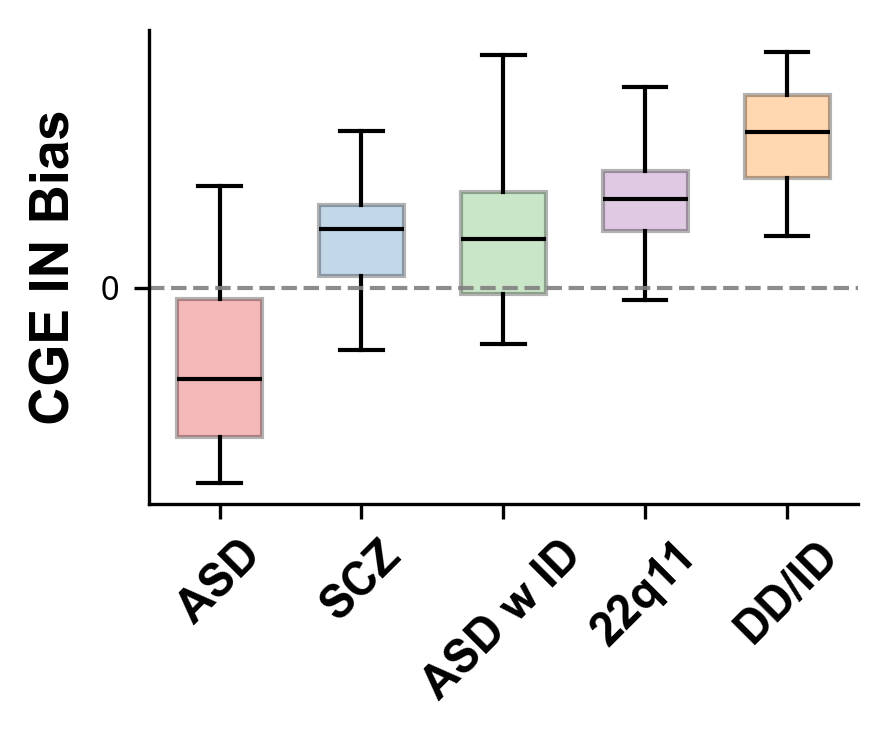

In [422]:
CT = "CGE interneuron"
CT_idx = Anno[Anno["Supercluster"]==CT].index.values

def plot_mutation_bias_comparison(CT, datasets, anno_df):
    # Get cell type indices
    CT_idx = anno_df[anno_df["Supercluster"]==CT].index.values
    
    # Get data for key datasets only
    key_datasets = {
        'ASD': datasets['ASD'],
        'SCZ': datasets['SCZ'], 
        'DD/ID': datasets['DD/ID'],
        '22q11': datasets['22q11'],
        'ASD w ID': datasets['ASD w ID']
    }
    
    data = {name: df.loc[CT_idx, "EFFECT"] for name, df in key_datasets.items()}

    # Calculate means and sort datasets
    means = {k: v.mean() for k,v in data.items()}
    sorted_datasets = sorted(data.keys(), key=lambda x: means[x])
    sorted_data = {k: data[k] for k in sorted_datasets}

    # Create simplified figure
    plt.style.use('default')
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 8
    
    fig, ax = plt.subplots(figsize=(3, 2.5), dpi=300)

    # Plot boxplots only
    positions = range(1, len(sorted_data)+1)
    bp = ax.boxplot([v for v in sorted_data.values()], positions=positions,
                    showfliers=False, patch_artist=True, widths=0.6)

    # Customize boxplots - fix color array length
    colors = ['#E41A1C', '#377EB8', '#4DAF4A', '#984EA3', '#FF7F00'] # Added extra color
    for i, box in enumerate(bp['boxes']):
        box.set(facecolor=colors[i], alpha=0.3)
        box.set(edgecolor='black', linewidth=1)
    plt.setp(bp['medians'], color='black', linewidth=1)
    plt.setp(bp['whiskers'], color='black', linewidth=1)
    plt.setp(bp['caps'], color='black', linewidth=1)

    # Customize plot
    ax.axhline(y=0, color='grey', linestyle='--', linewidth=1, alpha=0.9)
    ax.set_xticks(range(1,len(sorted_data)+1))
    ax.set_xticklabels(sorted_data.keys(), rotation=45, ha='center', fontsize=11, fontweight='bold')
    ax.set_ylabel('CGE IN Bias', labelpad=5, fontweight='bold', fontsize=13)
    ax.set_yticks([0]) # Only keep 0 on y-axis

    # Clean up
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    #ax.spines['left'].set_visible(False)
    plt.tight_layout()
    plt.show()

# Example usage with simplified datasets
datasets = {
    'ASD': HighIQ_ASD_Bias,
    'SCZ': SCZ_Bias,
    'DD/ID': DDD_Bias,
    '22q11': X22q_Bias,
    'ASD w ID': LowIQ_ASD_Bias
}

plot_mutation_bias_comparison("CGE interneuron", datasets, Anno)


### Panel 2 B 

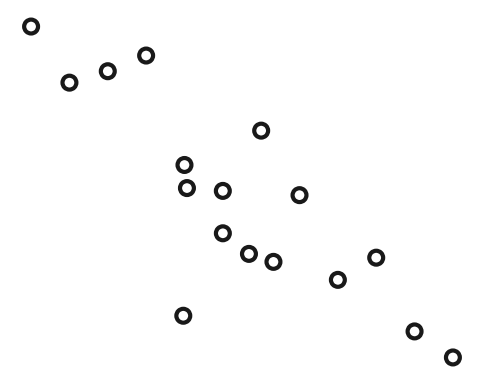

In [426]:
import matplotlib.pyplot as plt
import numpy as np

# Set style
plt.rcParams['font.size'] = 12

# Create figure
fig, ax = plt.subplots(figsize=(5, 4))

# Generate example data points
np.random.seed(42)
x = np.linspace(-1, 2, 12)
y = -10*x + 75 + np.random.normal(0, 5, 12)  # Negative correlation with noise

# Additional scattered points
x_scatter = np.random.uniform(-0.5, 1.5, 5)
y_scatter = -10*x_scatter + 75 + np.random.normal(0, 8, 5)

# Combine all points
x_all = np.concatenate([x, x_scatter])
y_all = np.concatenate([y, y_scatter])

# Plot
ax.scatter(x_all, y_all, edgecolor='black', alpha=0.9, s=100, facecolor='none', linewidth=3)


# Remove ticks
ax.set_xticks([])
ax.set_yticks([])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

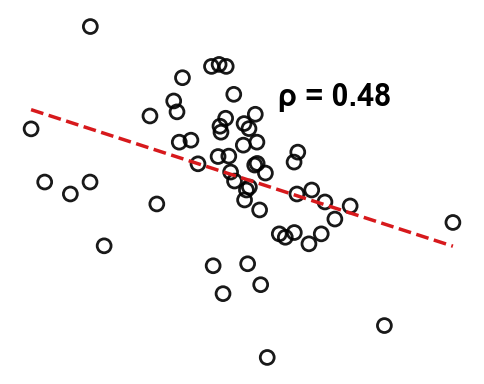

In [451]:
# load biases, IQs from file 
fig, ax = plt.subplots(figsize=(5, 4))
biases = np.loadtxt("biases.txt")
IQs = np.loadtxt("IQs.txt")

# plot IQs vs biases
# Plot
ax.scatter(biases, IQs, edgecolor='black', alpha=0.9, s=100, facecolor='none', linewidth=2)

# Add regression line
b, a = np.polyfit(biases, IQs, deg=1)
xseq = np.linspace(min(biases), max(biases), num=100)
ax.plot(xseq, a + b * xseq, color="#d7191c", lw=2.5, linestyle='--', zorder=5)

#ax.set_xlim(-1.2, 2.2)
#ax.set_ylim(40, 100)
# add text 
ax.text(0.8, 80, "ρ = 0.48", fontsize=22, fontweight='bold')
# Remove ticks
ax.set_xticks([])
ax.set_yticks([])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

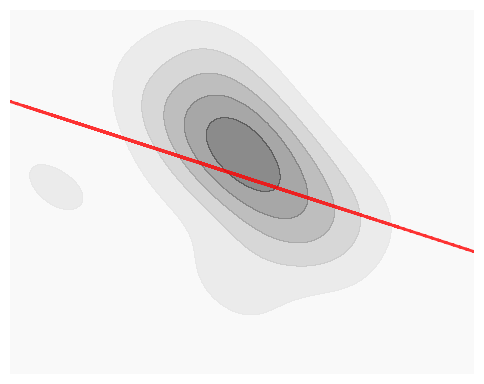

In [452]:
# load biases, IQs from file 
fig, ax = plt.subplots(figsize=(5, 4))

# Import gaussian_kde
from scipy.stats import gaussian_kde

# Create kernel density estimate
kde = gaussian_kde(np.vstack([biases, IQs]))

# Create a regular grid to evaluate the density
xmin, xmax = biases.min(), biases.max()
ymin, ymax = IQs.min(), IQs.max()
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

# Evaluate the density
z = kde(positions)
z = z.reshape(xx.shape)

# Plot the density with fewer contours in grayscale
h = ax.contourf(xx, yy, z, levels=5, cmap='Greys', alpha=0.5)

# Add regression line
z = np.polyfit(biases, IQs, 1)
p = np.poly1d(z)
ax.plot(biases, p(biases), alpha=0.8, linewidth=2, linestyle='dashed', color='red')

ax.set_xticks([])
ax.set_yticks([])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()